In [1]:
!pip install pandas
!pip install numpy
!pip install seaborn
!pip install -U scikit-learn
!pip install tabulate
!pip install umap-learn
!pip install ruptures
!pip install statsmodels

from tabulate import tabulate
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.cluster import SpectralClustering
from sklearn.neighbors import NearestNeighbors
from sklearn.mixture import GaussianMixture
from sklearn.impute import SimpleImputer
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.metrics import adjusted_rand_score, pairwise_distances
from sklearn.metrics import confusion_matrix
from sklearn.manifold import trustworthiness
from sklearn.preprocessing import MinMaxScaler
import ruptures as rpt
import matplotlib.dates as mdates




[notice] A new release of pip is available: 23.2.1 -> 25.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.2.1 -> 25.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.2.1 -> 25.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.2.1 -> 25.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.2.1 -> 25.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.2.1 -> 25.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.2.1 -> 25.1
[notice] To update, run: python.exe -m pip install --upgrade pip

[notice] A new release of pip is available: 23.2.1 -> 25.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
AllCountiesData = pd.read_csv("MTA_Daily_Ridership_Data__2020_-_2025_20250414.csv")
print(AllCountiesData.head())
X_with_dates = AllCountiesData.copy()
AllCountiesData = AllCountiesData.drop(columns=["Date"])
AllCountiesData = AllCountiesData.dropna()

df = AllCountiesData.copy()
X = AllCountiesData.copy()
sns.set_palette("Purples")

         Date  Subways: Total Estimated Ridership  \
0  03/01/2020                             2212965   
1  03/02/2020                             5329915   
2  03/03/2020                             5481103   
3  03/04/2020                             5498809   
4  03/05/2020                             5496453   

   Subways: % of Comparable Pre-Pandemic Day  \
0                                       0.97   
1                                       0.96   
2                                       0.98   
3                                       0.99   
4                                       0.99   

   Buses: Total Estimated Ridership  Buses: % of Comparable Pre-Pandemic Day  \
0                            984908                                     0.99   
1                           2209066                                     0.99   
2                           2228608                                     0.99   
3                           2177165                                     

descriptive_stats = AllCountiesData.describe()
sns.set_style("whitegrid")
plt.figure(figsize=(18, 12))  # Larger figure for readability

# Plot histograms with different bin settings
for i, col in enumerate(AllCountiesData, 1):
    plt.subplot(10, 4, i) 
    bins = 20
    
    sns.histplot(
        data=AllCountiesData,
        x=col,
        bins=bins,
        color='dodgerblue',
        edgecolor='white',
        kde=False  # No continuous line
    )
    
    plt.title(f'{col}', fontsize=10)
    plt.xlabel('Value Range')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

stats = AllCountiesData.describe().T.round(2)

# Convert to markdown-style table
print("Tomato Features - Descriptive Statistics\n")
print(tabulate(stats, 
               headers=['Metric'] + stats.columns.tolist(),
               tablefmt='github', 
               stralign='center',
               numalign='center',
               showindex=True))

# Assuming X is your original data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

def plot_kmeans_elbow(X, max_k=10):
    distortions = []
    for k in range(1, max_k+1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(X)
        distortions.append(kmeans.inertia_)
    
    plt.figure(figsize=(8, 4))
    plt.plot(range(1, max_k+1), distortions, marker='o')
    plt.title('K-means Elbow Method')
    plt.xlabel('Number of clusters')
    plt.ylabel('Distortion (WCSS)')
    plt.xticks(range(1, max_k+1))
    plt.grid()
    plt.show()

def plot_hierarchical_elbow(X, max_k=10):
    methods = ['ward', 'complete', 'average']
    plt.figure(figsize=(12, 6))
    
    for method in methods:
        Z = linkage(X, method=method)
        last = Z[-max_k:, 2]  # Get distances for last max_k merges
        plt.plot(range(2, max_k+2), last[::-1], marker='o', label=method)
    
    plt.title('Hierarchical Clustering Elbow')
    plt.xlabel('Number of clusters')
    plt.ylabel('Merge Distance')
    plt.legend()
    plt.grid()
    plt.show()

def plot_dbscan_analysis(X, eps_range=np.linspace(0.1, 1.0, 10), min_samples_range=range(2, 6)):
    # K-distance graph
    neigh = NearestNeighbors(n_neighbors=2)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)
    distances = np.sort(distances[:,1], axis=0)
    
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 2, 1)
    plt.plot(distances)
    plt.title('K-distance Graph for Epsilon Selection')
    plt.xlabel('Points sorted by distance')
    plt.ylabel('2-NN distance')
    plt.grid()
    
    # Silhouette analysis
    results = []
    for eps in eps_range:
        for min_samples in min_samples_range:
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            labels = dbscan.fit_predict(X)
            if len(np.unique(labels)) > 1:
                score = silhouette_score(X, labels)
                results.append((eps, min_samples, score))
    
    results = np.array(results)
    plt.subplot(1, 2, 2)
    for min_samples in min_samples_range:
        mask = results[:,1] == min_samples
        plt.plot(results[mask,0], results[mask,2], marker='o', label=f'min_samples={min_samples}')
    plt.title('DBSCAN Silhouette Scores')
    plt.xlabel('Epsilon')
    plt.ylabel('Silhouette Score')
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

def plot_gmm_analysis(X, max_components=10):
    n_components = range(1, max_components+1)
    bics = []
    aics = []
    
    for n in n_components:
        gmm = GaussianMixture(n_components=n, random_state=42)
        gmm.fit(X)
        bics.append(gmm.bic(X))
        aics.append(gmm.aic(X))
    
    plt.figure(figsize=(10, 5))
    plt.plot(n_components, bics, label='BIC', marker='o')
    plt.plot(n_components, aics, label='AIC', marker='o')
    plt.title('GMM Component Selection (Lower is Better)')
    plt.xlabel('Number of components')
    plt.ylabel('Information Criterion')
    plt.legend()
    plt.xticks(n_components)
    plt.grid()
    plt.show()

# Execute all analyses
print("=== K-means Elbow ===")
plot_kmeans_elbow(X_scaled)

print("\n=== Hierarchical Elbow ===")
plot_hierarchical_elbow(X_scaled)

print("\n=== DBSCAN Analysis ===")
plot_dbscan_analysis(X_scaled)

print("\n=== GMM Analysis ===")
plot_gmm_analysis(X_scaled)

C:\Users\Amit L\PycharmProjects\Analysis\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\Amit L\PycharmProjects\Analysis\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


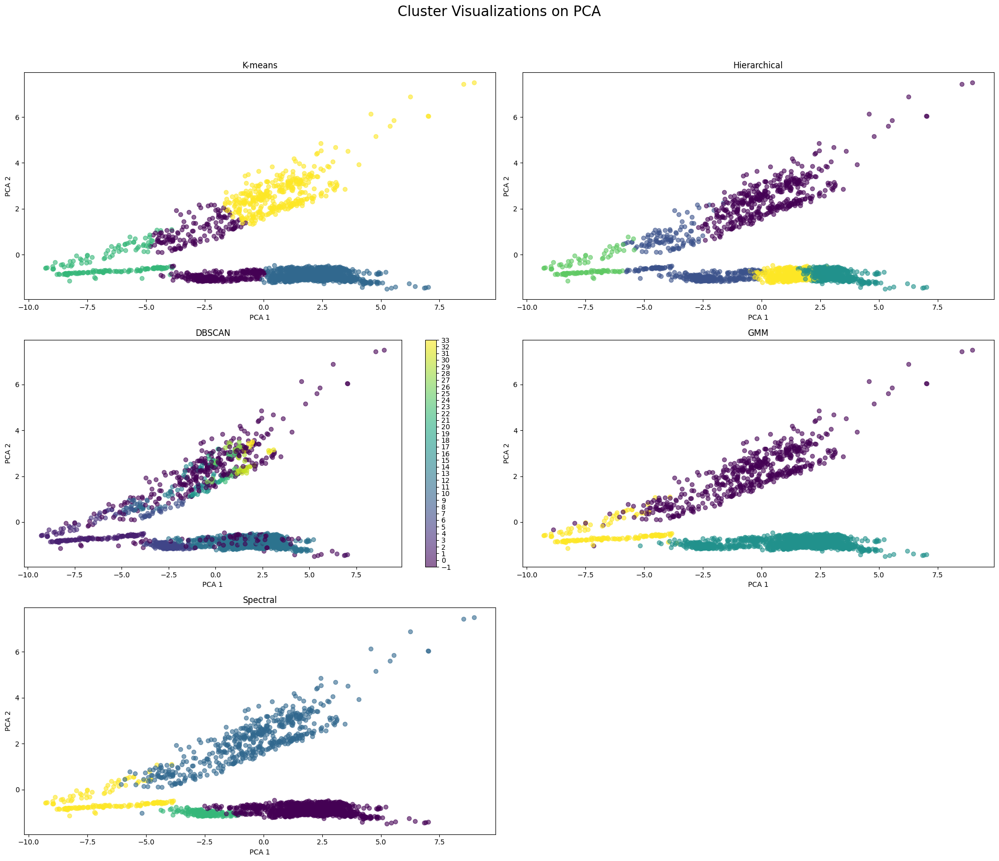

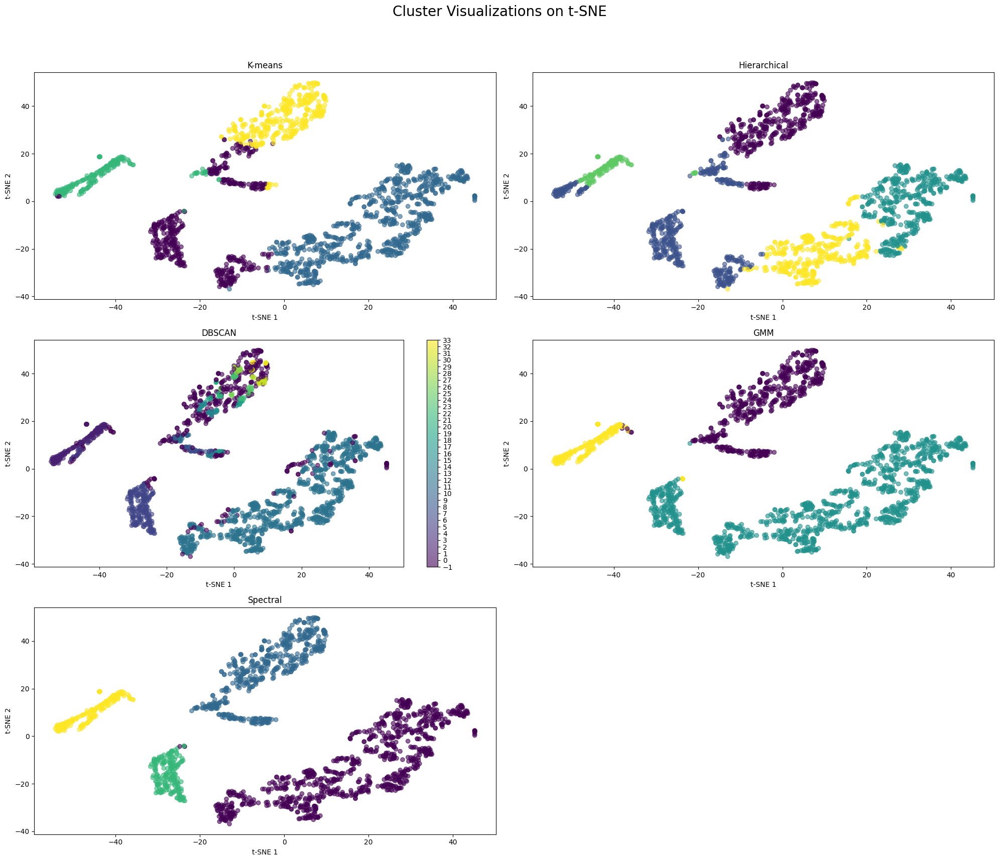

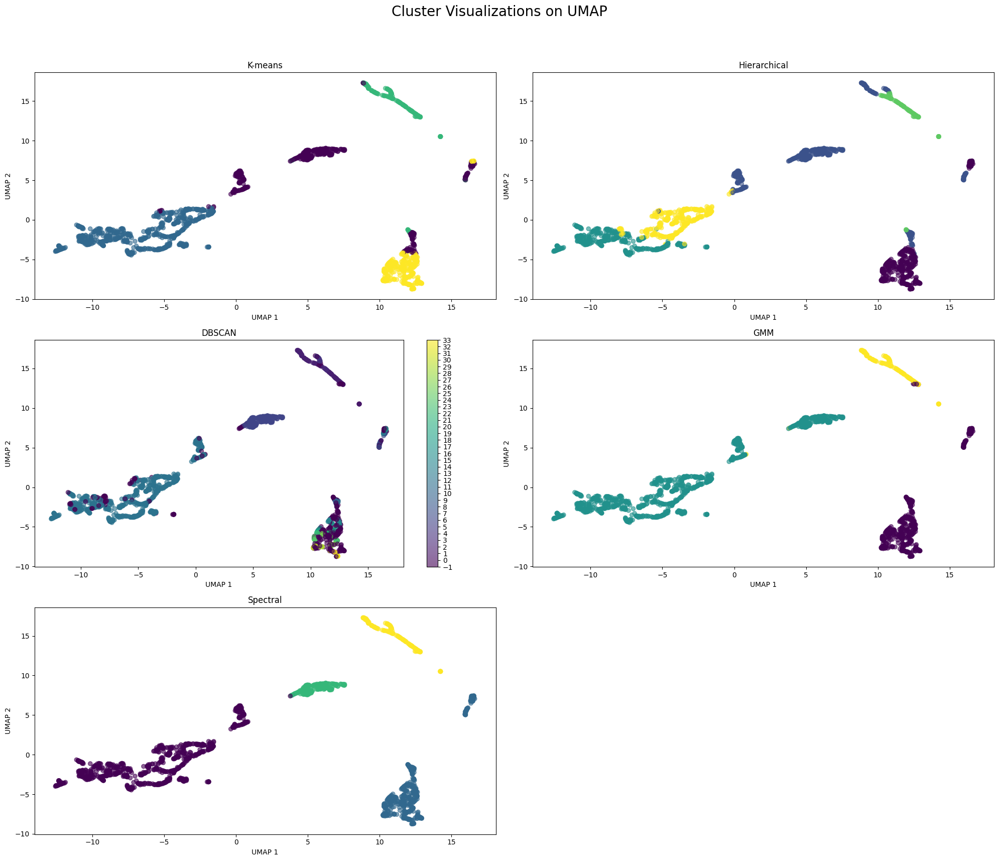

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, SpectralClustering
from sklearn.mixture import GaussianMixture

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

def compare_clustering_visualizations(
    df,
    kmeans_n_clusters=4,
    hierarchical_n_clusters=5,
    dbscan_eps=0.6,
    dbscan_min_samples=4,
    gmm_n_components=3,
    spectral_n_clusters=4,
    perplexity=40,
    random_state=42
):
    """
    Compare multiple clustering algorithms across different dimensionality reductions.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        Input data with features (will be automatically scaled)
    kmeans_n_clusters : int
        Number of clusters for K-means
    hierarchical_n_clusters : int
        Number of clusters for Hierarchical clustering
    dbscan_eps : float
        Epsilon parameter for DBSCAN
    dbscan_min_samples : int
        Minimum samples parameter for DBSCAN
    gmm_n_components : int
        Number of components for Gaussian Mixture Model
    spectral_n_clusters : int
        Number of clusters for Spectral Clustering
    perplexity : int
        Perplexity parameter for t-SNE
    random_state : int
        Random seed for reproducibility
    """
    
    
    # === Define clustering algorithms ===
    cluster_algorithms = {
        'K-means': KMeans(n_clusters=kmeans_n_clusters, random_state=random_state),
        'Hierarchical': AgglomerativeClustering(n_clusters=hierarchical_n_clusters, 
                                              linkage='ward'),
        'DBSCAN': DBSCAN(eps=dbscan_eps, min_samples=dbscan_min_samples),
        'GMM': GaussianMixture(n_components=gmm_n_components, random_state=random_state),
        'Spectral': SpectralClustering(n_clusters=spectral_n_clusters, 
                                     affinity='nearest_neighbors', 
                                     random_state=random_state)
    }

    # === Fit clusterers ===
    cluster_results = {}
    for name, model in cluster_algorithms.items():
        if name == 'GMM':
            cluster_results[name] = model.fit_predict(X_scaled)
        else:
            cluster_results[name] = model.fit_predict(X_scaled)

    # === Dimensionality reduction ===
    reduction_methods = {
        'PCA': PCA(n_components=2).fit_transform(X_scaled),
        't-SNE': TSNE(n_components=2, perplexity=perplexity, 
                     random_state=random_state).fit_transform(X_scaled),
        'UMAP': umap.UMAP(random_state=random_state).fit_transform(X_scaled)
    }

    # === Visualization ===
    for reduction_name, X_reduced in reduction_methods.items():
        plt.figure(figsize=(20, 18))
        plt.suptitle(f'Cluster Visualizations on {reduction_name}', fontsize=20)
        
        for i, (cluster_name, labels) in enumerate(cluster_results.items(), 1):
            plt.subplot(3, 2, i)
            scatter = plt.scatter(X_reduced[:, 0], X_reduced[:, 1], 
                               c=labels, cmap='viridis', alpha=0.6)
            plt.title(cluster_name)
            plt.xlabel(f'{reduction_name} 1')
            plt.ylabel(f'{reduction_name} 2')
            if cluster_name == 'DBSCAN':
                plt.colorbar(scatter, ticks=np.unique(labels))

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()
        
    return cluster_results, reduction_methods

cluster_results, reductions = compare_clustering_visualizations(X_scaled)

In [4]:
from sklearn import metrics

def evaluate_clustering_performance(X_scaled, cluster_results, verbose=True):
    """
    Evaluate clustering results using multiple metrics and return a formatted DataFrame.
    
    Parameters:
    -----------
    X_scaled : array-like
        Scaled feature matrix (n_samples, n_features)
    cluster_results : dict
        Dictionary of clustering results {method_name: cluster_labels}
    verbose : bool
        Whether to print the results table
    
    Returns:
    --------
    pd.DataFrame
        DataFrame with evaluation metrics for each method
    """
    def _evaluate_single_cluster(X, labels):
        """Helper function for individual cluster evaluation"""
        if len(np.unique(labels)) > 1 and np.all(labels != -1):  # Ignore noise-only/single-cluster
            return {
                'Silhouette': metrics.silhouette_score(X, labels),
                'Davies-Bouldin': metrics.davies_bouldin_score(X, labels),
                'Calinski-Harabasz': metrics.calinski_harabasz_score(X, labels),
                'n_clusters': len(np.unique(labels))
            }
        return {
            'Silhouette': np.nan,
            'Davies-Bouldin': np.nan,
            'Calinski-Harabasz': np.nan,
            'n_clusters': len(np.unique(labels[labels != -1]))  # Exclude noise if present
        }
    
    # Evaluate all methods
    evaluation_results = []
    for method, labels in cluster_results.items():
        metrics_dict = _evaluate_single_cluster(X_scaled, labels)
        evaluation_results.append({
            'Method': method,
            **metrics_dict
        })
    
    # Create DataFrame
    eval_df = pd.DataFrame(evaluation_results).set_index('Method')
    
    # Formatting
    if verbose:
        print("=== Clustering Performance Comparison ===")
        display(eval_df.style
               .format('{:.3f}', subset=['Silhouette', 'Davies-Bouldin', 'Calinski-Harabasz'])
               .highlight_max(subset=['Silhouette', 'Calinski-Harabasz'], color='lightgreen')
               .highlight_min(subset=['Davies-Bouldin'], color='lightgreen')
               .set_caption(f"Evaluation Metrics (Higher is better for all except Davies-Bouldin)"))
    
    return eval_df

metrics_df = evaluate_clustering_performance(X_scaled, cluster_results)

=== Clustering Performance Comparison ===


,Silhouette,Davies-Bouldin,Calinski-Harabasz,n_clusters
Method,,,,
K-means,0.450,0.876,1576.361,4
Hierarchical,0.336,0.881,1345.468,5
DBSCAN,nan,nan,nan,34
GMM,0.357,1.162,861.107,3
Spectral,0.369,0.938,1042.768,4


def plot_kmeans_elbow(X, max_k=10):
    """K-means elbow method"""
    distortions = []
    for k in range(1, max_k+1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(X)
        distortions.append(kmeans.inertia_)
    
    plt.figure(figsize=(8, 4))
    plt.plot(range(1, max_k+1), distortions, marker='o')
    plt.title('K-means Elbow Method')
    plt.xlabel('Number of clusters')
    plt.ylabel('Distortion (WCSS)')
    plt.xticks(range(1, max_k+1))
    plt.show()

def plot_hierarchical_elbow(X, max_k=10):
    """Hierarchical clustering elbow using linkage"""
    methods = ['ward', 'complete', 'average']
    plt.figure(figsize=(12, 6))
    
    for i, method in enumerate(methods):
        # Calculate linkage matrix
        Z = linkage(X, method=method)
        
        # Extract distances for each merge step
        distances = Z[:, 2]
        
        # Plot the distances
        plt.plot(range(1, len(distances)+1), distances[::-1], 
                label=f'{method} linkage')
    
    plt.title('Hierarchical Clustering Elbow')
    plt.xlabel('Number of clusters')
    plt.ylabel('Merge Distance')
    plt.legend()
    plt.grid()
    plt.show()

def plot_dbscan_analysis(X, eps_range=np.linspace(0.1, 1.0, 10), min_samples_range=range(2, 6)):
    """DBSCAN parameter analysis"""
    # K-distance graph
    neigh = NearestNeighbors(n_neighbors=2)
    nbrs = neigh.fit(X)
    distances, _ = nbrs.kneighbors(X)
    distances = np.sort(distances[:,1], axis=0)
    
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 2, 1)
    plt.plot(distances)
    plt.title('K-distance Graph for Epsilon Selection')
    plt.xlabel('Points sorted by distance')
    plt.ylabel('2-NN distance')
    
    # Silhouette analysis
    results = []
    for eps in eps_range:
        for min_samples in min_samples_range:
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            labels = dbscan.fit_predict(X)
            if len(np.unique(labels)) > 1:  # At least 2 clusters
                score = silhouette_score(X, labels)
                results.append((eps, min_samples, score))
    
    # Plot silhouette scores
    results = np.array(results)
    plt.subplot(1, 2, 2)
    for min_samples in min_samples_range:
        mask = results[:,1] == min_samples
        plt.plot(results[mask,0], results[mask,2], 
                marker='o', label=f'min_samples={min_samples}')
    plt.title('DBSCAN Silhouette Scores')
    plt.xlabel('Epsilon')
    plt.ylabel('Silhouette Score')
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_gmm_analysis(X, max_components=10):
    """GMM component selection"""
    n_components = range(1, max_components+1)
    bics = []
    aics = []
    
    for n in n_components:
        gmm = GaussianMixture(n_components=n, random_state=42)
        gmm.fit(X)
        bics.append(gmm.bic(X))
        aics.append(gmm.aic(X))
    
    plt.figure(figsize=(10, 5))
    plt.plot(n_components, bics, label='BIC', marker='o')
    plt.plot(n_components, aics, label='AIC', marker='o')
    plt.title('GMM Component Selection (Lower is Better)')
    plt.xlabel('Number of components')
    plt.ylabel('Information Criterion')
    plt.legend()
    plt.xticks(n_components)
    plt.grid()
    plt.show()

# Run all analyses
print("=== K-means Elbow ===")
plot_kmeans_elbow(X_scaled)

print("\n=== Hierarchical Elbow ===")
plot_hierarchical_elbow(X_scaled)

print("\n=== DBSCAN Analysis ===")
plot_dbscan_analysis(X_scaled)

print("\n=== GMM Analysis ===")
plot_gmm_analysis(X_scaled)


def compare_spectral_clustering(X_scaled, n_clusters=4, random_state=42):
    """Compare Spectral Clustering on t-SNE vs UMAP embeddings."""
    
    # 1. Generate embeddings
    print("Generating dimensionality reductions...")
    tsne = TSNE(n_components=2, random_state=random_state, perplexity=40)
    X_tsne = tsne.fit_transform(X_scaled)
    
    umap_reducer = umap.UMAP(random_state=random_state, n_neighbors=15, min_dist=0.1)
    X_umap = umap_reducer.fit_transform(X_scaled)
    
    # 2. Apply Spectral Clustering on the original (scaled) data
    print("Applying Spectral Clustering...")
    spectral = SpectralClustering(n_clusters=n_clusters, 
                                  affinity='nearest_neighbors',
                                  random_state=random_state)
    spectral_clusters = spectral.fit_predict(X_scaled)
    
    # 3. Visualization on the embeddings
    print("Creating comparison plots...")
    plt.figure(figsize=(18, 8))
    
    # t-SNE plot
    plt.subplot(1, 2, 1)
    scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=spectral_clusters, 
                          cmap='Spectral', alpha=0.7, s=10)
    plt.colorbar(scatter, ticks=np.unique(spectral_clusters))
    tsne_silhouette = metrics.silhouette_score(X_tsne, spectral_clusters)
    plt.title(f'Spectral Clustering on t-SNE\nSilhouette: {tsne_silhouette:.3f}')
    
    # UMAP plot
    plt.subplot(1, 2, 2)
    scatter = plt.scatter(X_umap[:, 0], X_umap[:, 1], c=spectral_clusters,
                          cmap='Spectral', alpha=0.7, s=10)
    plt.colorbar(scatter, ticks=np.unique(spectral_clusters))
    umap_silhouette = metrics.silhouette_score(X_umap, spectral_clusters)
    plt.title(f'Spectral Clustering on UMAP\nSilhouette: {umap_silhouette:.3f}')
    
    plt.tight_layout()
    plt.show()
    
    # 4. Quantitative Comparison on both embeddings
    print("\n=== Quantitative Comparison ===")
    results = []
    for name, emb in [('t-SNE', X_tsne), ('UMAP', X_umap)]:
        sil_score = metrics.silhouette_score(emb, spectral_clusters)
        ch_score = metrics.calinski_harabasz_score(emb, spectral_clusters)
        db_score = metrics.davies_bouldin_score(emb, spectral_clusters)
        results.append([name, sil_score, ch_score, db_score])
    
    metrics_df = pd.DataFrame(results, 
                              columns=['Method', 'Silhouette', 'Calinski-Harabasz', 'Davies-Bouldin'])
    print(metrics_df)
    
    # 5. Consistency Analysis: Compare clustering on t-SNE vs UMAP embeddings
    print("\n=== Consistency Analysis ===")
    # Fit Spectral Clustering separately on each embedding
    spectral_tsne = SpectralClustering(n_clusters=n_clusters, 
                                       affinity='nearest_neighbors',
                                       random_state=random_state)
    clusters_tsne = spectral_tsne.fit_predict(X_tsne)
    
    spectral_umap = SpectralClustering(n_clusters=n_clusters, 
                                       affinity='nearest_neighbors',
                                       random_state=random_state)
    clusters_umap = spectral_umap.fit_predict(X_umap)
    
    consistency_score = adjusted_rand_score(clusters_tsne, clusters_umap)
    print(f"Cluster assignment consistency (Adjusted Rand Score): {consistency_score:.3f}")
    
    # Compute average nearest neighbor correlation between distances in t-SNE and UMAP
    nn_preservation = np.mean([
        np.corrcoef(pairwise_distances(X_tsne)[i], pairwise_distances(X_umap)[i])[0,1]
        for i in range(len(X_tsne))
    ])
    print(f"Nearest neighbor correlation: {nn_preservation:.3f}")
    
    # 6. Cluster-wise Comparison: Show centroids in t-SNE and UMAP for each cluster
    print("\nGenerating cluster-wise centroid comparisons...")
    for cluster in np.unique(spectral_clusters):
        plt.figure(figsize=(8,4))
        plt.suptitle(f'Cluster {cluster} Comparison', fontsize=16)
        
        # t-SNE Centroid
        plt.subplot(121)
        plt.scatter(X_tsne[:,0], X_tsne[:,1], c='lightgray', alpha=0.3)
        centroid_tsne = X_tsne[spectral_clusters == cluster].mean(axis=0)
        plt.scatter(centroid_tsne[0], centroid_tsne[1], c='red', s=200, marker='X')
        plt.title('t-SNE Centroid')
        
        # UMAP Centroid
        plt.subplot(122)
        plt.scatter(X_umap[:,0], X_umap[:,1], c='lightgray', alpha=0.3)
        centroid_umap = X_umap[spectral_clusters == cluster].mean(axis=0)
        plt.scatter(centroid_umap[0], centroid_umap[1], c='red', s=200, marker='X')
        plt.title('UMAP Centroid')
        
        plt.tight_layout()
        plt.show()
    
    return {
        'tsne_embedding': X_tsne,
        'umap_embedding': X_umap,
        'clusters': spectral_clusters,
        'metrics': metrics_df
    }

# Usage example:
results = compare_spectral_clustering(X_scaled, n_clusters=4)
X['Spectral_Cluster'] = results['clusters']


def compare_spectral_clustering(X_scaled, n_clusters=4, random_state=42):
    """Complete Spectral Clustering comparison with error handling"""
    
    # 1. Generate embeddings
    print("Generating dimensionality reductions...")
    try:
        X_tsne = TSNE(n_components=2, random_state=random_state, perplexity=40).fit_transform(X_scaled)
        X_umap = umap.UMAP(random_state=random_state, n_neighbors=15, min_dist=0.1).fit_transform(X_scaled)
    except Exception as e:
        print(f"Error generating embeddings: {str(e)}")
        return None
    
    # 2. Apply Spectral Clustering
    print("Applying Spectral Clustering...")
    try:
        spectral = SpectralClustering(n_clusters=n_clusters, 
                                      affinity='nearest_neighbors',
                                      random_state=random_state)
        spectral_clusters = spectral.fit_predict(X_scaled)
        
        # Get cluster assignments in each embedded space
        tsne_clusters = SpectralClustering(n_clusters=n_clusters, 
                                           affinity='nearest_neighbors',
                                           random_state=random_state).fit_predict(X_tsne)
        umap_clusters = SpectralClustering(n_clusters=n_clusters, 
                                           affinity='nearest_neighbors',
                                           random_state=random_state).fit_predict(X_umap)
    except Exception as e:
        print(f"Error in clustering: {str(e)}")
        return None
    
    # 3. Visualization of Original Clustering
    print("Creating comparison plots...")
    plt.figure(figsize=(18, 8))
    
    plt.subplot(1, 2, 1)
    scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=spectral_clusters, 
                          cmap='Spectral', alpha=0.7, s=10)
    plt.colorbar(scatter, ticks=np.unique(spectral_clusters))
    plt.title('Spectral Clustering on Original Data (t-SNE Projection)')
    
    plt.subplot(1, 2, 2)
    scatter = plt.scatter(X_umap[:, 0], X_umap[:, 1], c=spectral_clusters,
                          cmap='Spectral', alpha=0.7, s=10)
    plt.colorbar(scatter, ticks=np.unique(spectral_clusters))
    plt.title('Spectral Clustering on Original Data (UMAP Projection)')
    
    plt.tight_layout()
    plt.show()
    
    # 4. Consistency Analysis
    print("\n=== Consistency Analysis ===")
    consistency = adjusted_rand_score(tsne_clusters, umap_clusters)
    print(f"Cluster assignment consistency: {consistency:.3f}")
    
    # 5. Confusion Matrix
    plt.figure(figsize=(10, 8))
    mat = confusion_matrix(tsne_clusters, umap_clusters)
    sns.heatmap(mat, annot=True, fmt='d', cmap='Blues')
    plt.title('Cluster Assignment Confusion Matrix\n(t-SNE vs UMAP)')
    plt.xlabel('UMAP Clusters')
    plt.ylabel('t-SNE Clusters')
    plt.show()
    
    # 6. Disagreement Analysis
    disagreement = tsne_clusters != umap_clusters
    print(f"\nPoints with conflicting assignments: {disagreement.mean():.1%}")
    
    if disagreement.any():
        plt.figure(figsize=(12, 6))
        
        plt.subplot(1, 2, 1)
        plt.scatter(X_tsne[~disagreement, 0], X_tsne[~disagreement, 1], 
                    c=tsne_clusters[~disagreement], cmap='tab10', alpha=0.3)
        plt.scatter(X_tsne[disagreement, 0], X_tsne[disagreement, 1],
                    c='black', s=50, label='Conflicts')
        plt.title('Conflict Points in t-SNE')
        plt.legend()
        
        plt.subplot(1, 2, 2)
        plt.scatter(X_umap[~disagreement, 0], X_umap[~disagreement, 1],
                    c=umap_clusters[~disagreement], cmap='tab10', alpha=0.3)
        plt.scatter(X_umap[disagreement, 0], X_umap[disagreement, 1],
                    c='black', s=50, label='Conflicts')
        plt.title('Conflict Points in UMAP')
        plt.legend()
        
        plt.tight_layout()
        plt.show()
    
    return {
        'X_tsne': X_tsne,
        'X_umap': X_umap,
        'original_clusters': spectral_clusters,
        'tsne_clusters': tsne_clusters,
        'umap_clusters': umap_clusters,
        'consistency_score': consistency
    }

# Example usage block (safe to run directly)
if __name__ == "__main__":
    from sklearn.preprocessing import StandardScaler
    from sklearn.datasets import make_blobs
    
    # Generate sample data
    Y,_ = make_blobs(n_samples=1000, centers=20, random_state=41)
    Y_scaled = StandardScaler().fit_transform(Y)
    
    results = compare_spectral_clustering(Y_scaled)


def knn_preservation(X_high, X_low, k=30):
    """
    Measures how well the k-nearest neighbors are preserved in the low-dimensional space.
    Returns average Spearman correlation over samples.
    """
    from scipy.stats import spearmanr

    D_high = pairwise_distances(X_high)
    D_low = pairwise_distances(X_low)
    n = X_high.shape[0]

    correlations = []
    for i in range(n):
        # Exclude self, get sorted indices
        high_ranks = np.argsort(D_high[i])[1:k+1]
        low_ranks = np.argsort(D_low[i])[1:k+1]
        # Convert to full ranking vectors for Spearman
        rank_vector_high = np.argsort(np.argsort(D_high[i]))
        rank_vector_low = np.argsort(np.argsort(D_low[i]))
        corr, _ = spearmanr(rank_vector_high, rank_vector_low)
        correlations.append(corr)
    
    return np.nanmean(correlations)

# Compute metrics
print("=== Embedding Quality Metrics ===")
X_tsne = TSNE(n_components=2,  perplexity=40).fit_transform(X_scaled)
X_umap = umap.UMAP(n_neighbors=15, min_dist=0.1).fit_transform(X_scaled)
for name, emb in [('t-SNE', X_tsne), ('UMAP', X_umap)]:
    trust = trustworthiness(X_scaled, emb, n_neighbors=10)
    
    # Continuity is not available in sklearn so we do a custom approximation:
    cont = trustworthiness(emb, X_scaled, n_neighbors=10)  # Reversed order
    
    knn_corr = knn_preservation(X_scaled, emb)
    
    print(f"\n{name} Embedding:")
    print(f"  Trustworthiness:        {trust:.3f}")
    print(f"  Continuity (approx.):   {cont:.3f}")
    print(f"  k-NN Distance Corr:      {knn_corr:.3f}")


def create_radar_charts(df = X, cluster_col='Spectral_Cluster', features=None
                        , n_cols=3):
    """
    Creates radar charts showing normalized feature distributions per cluster.
    
    Parameters:
    - df: DataFrame containing features and cluster assignments
    - cluster_col: Name of column containing cluster labels
    - features: List of features to include (None = all numeric)
    - n_cols: Number of columns in subplot grid
    """
    # Prepare data
    if features is None:
        features = df.select_dtypes(include=[np.number]).columns.tolist()
        features.remove(cluster_col)
    
    clusters = sorted(df[cluster_col].unique())
    n_rows = int(np.ceil(len(clusters) / n_cols))
    
    # Normalize features [0,1] for radar chart
    scaler = MinMaxScaler()
    df_scaled = pd.DataFrame(scaler.fit_transform(df[features]), 
                           columns=features)
    df_scaled[cluster_col] = df[cluster_col]
    
    # Prepare radar chart
    angles = np.linspace(0, 2*np.pi, len(features), endpoint=False).tolist()
    angles += angles[:1]  # Close the loop
    
    fig = plt.figure(figsize=(6*n_cols, 6*n_rows))
    fig.suptitle('Radar Charts by Cluster', fontsize=16, y=1.05)
    
    for i, cluster in enumerate(clusters):
        ax = fig.add_subplot(n_rows, n_cols, i+1, polar=True)
        
        # Get cluster stats
        cluster_data = df_scaled[df_scaled[cluster_col] == cluster]
        vals = cluster_data[features].mean().values.tolist()
        vals += vals[:1]  # Close the loop
        
        # Plot
        ax.plot(angles, vals, linewidth=2, linestyle='solid', 
               label=f'Cluster {cluster}')
        ax.fill(angles, vals, alpha=0.3)
        
        # Customize
        ax.set_theta_offset(np.pi/2)
        ax.set_theta_direction(-1)
        ax.set_thetagrids(np.degrees(angles[:-1]), features)
        
        # Set same scale for all
        ax.set_ylim(0, 1)
        ax.set_title(f'Cluster {cluster} Profile', pad=20)
        ax.grid(True)
    
    plt.tight_layout()
    plt.show()


create_radar_charts(X,cluster_col='Spectral_Cluster', features=None)

# Assuming:
# df = your DataFrame with features and 'cluster' column from Spectral Clustering
# List your numeric features (exclude 'cluster' column)

# Create a copy to preserve original data
X_normalized = X.copy()

# Identify numeric features to normalize (exclude cluster column)
numeric_features = [col for col in X.columns if col != 'Spectral_Cluster' and pd.api.types.is_numeric_dtype(X[col])]

# Normalize features to [0,1] range
scaler = MinMaxScaler()
X_normalized[numeric_features] = scaler.fit_transform(X[numeric_features])
X_normalized['Spectral_Cluster'] = X['Spectral_Cluster']

numeric_features = [col for col in X_normalized.columns if col != 'Spectral_Cluster']

plt.figure(figsize=(15, 8))
for i, feature in enumerate(numeric_features, 1):
    plt.subplot(5, 3, i)  # Adjust grid size based on feature count
    sns.violinplot(data=X_normalized, x='Spectral_Cluster', y=feature, hue = 'Spectral_Cluster', cut=0, legend = 0).set(ylabel=None)
    plt.title(f'{feature}')
plt.show()

plt.figure(figsize=(15, 8))
for i, feature in enumerate(numeric_features, 1):
    plt.subplot(5, 3, i)
    for cluster in sorted(X_normalized['Spectral_Cluster'].unique()):
        cluster_data = X_normalized[X_normalized['Spectral_Cluster'] == cluster][feature]
        x = np.sort(cluster_data)
        y = np.arange(1, len(x)+1)/len(x)
        plt.plot(x, y, label=f'Cluster {cluster}', alpha=0.8)
    plt.title(f'CDF of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Probability')
    plt.legend()
plt.tight_layout()
plt.show()

from scipy import stats

results = []
for feature in numeric_features:
    clusters = []
    for cluster in sorted(X_normalized['Spectral_Cluster'].unique()):
        clusters.append(X_normalized[X_normalized['Spectral_Cluster'] == cluster][feature])
    
    # Kruskal-Wallis test for overall differences
    h_stat, p_val = stats.kruskal(*clusters)
    
    # Pairwise Mann-Whitney tests
    pairs = []
    for i in range(len(clusters)):
        for j in range(i+1, len(clusters)):
            _, p = stats.mannwhitneyu(clusters[i], clusters[j], alternative='two-sided')
            pairs.append(f"Cluster {i}-{j}: p={p:.4f}")
    
    results.append([
        feature,
        f"{p_val:.4f}",
        "\n".join(pairs)  # Newline for better readability
    ])

# Print with tabulate
headers = ["Feature", "Kruskal-Wallis\np-value", "Pairwise Mann-Whitney\n(p-values)"]
print(tabulate(results, headers=headers, tablefmt="grid", stralign="left", numalign="center"))

In [5]:
total_cols = [col for col in df.columns if 'Total' in col]
df_totals = df[total_cols].copy()

pct_cols = [col for col in df.columns if '% of Comparable Pre-Pandemic Day' in col]
df_pct = df[pct_cols].copy()


scaler = StandardScaler()
df_totals_scaled = scaler.fit_transform(df_totals)
df_pct_scaled = scaler.fit_transform(df_pct)



# Execute all analyses
print("=== K-means Elbow ===")
plot_kmeans_elbow(df_totals_scaled)

print("\n=== Hierarchical Elbow ===")
plot_hierarchical_elbow(df_totals_scaled)

print("\n=== DBSCAN Analysis ===")
plot_dbscan_analysis(df_totals_scaled)

print("\n=== GMM Analysis ===")
plot_gmm_analysis(df_totals_scaled)

C:\Users\Amit L\PycharmProjects\Analysis\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\Amit L\PycharmProjects\Analysis\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


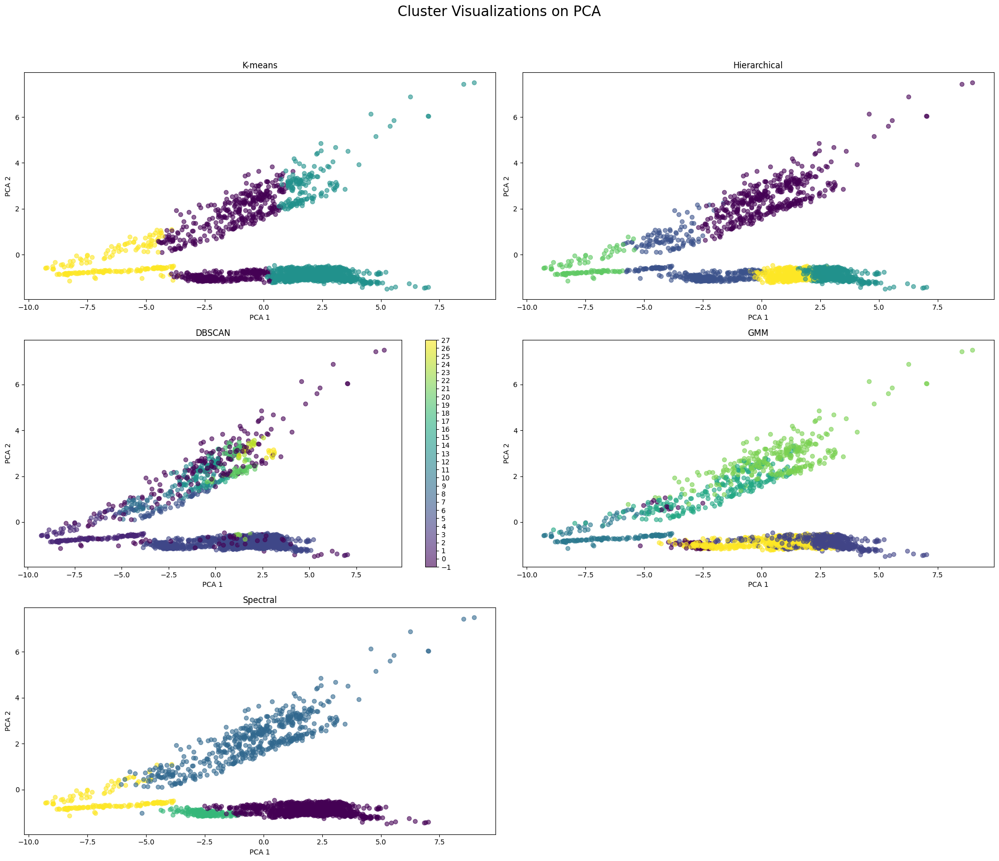

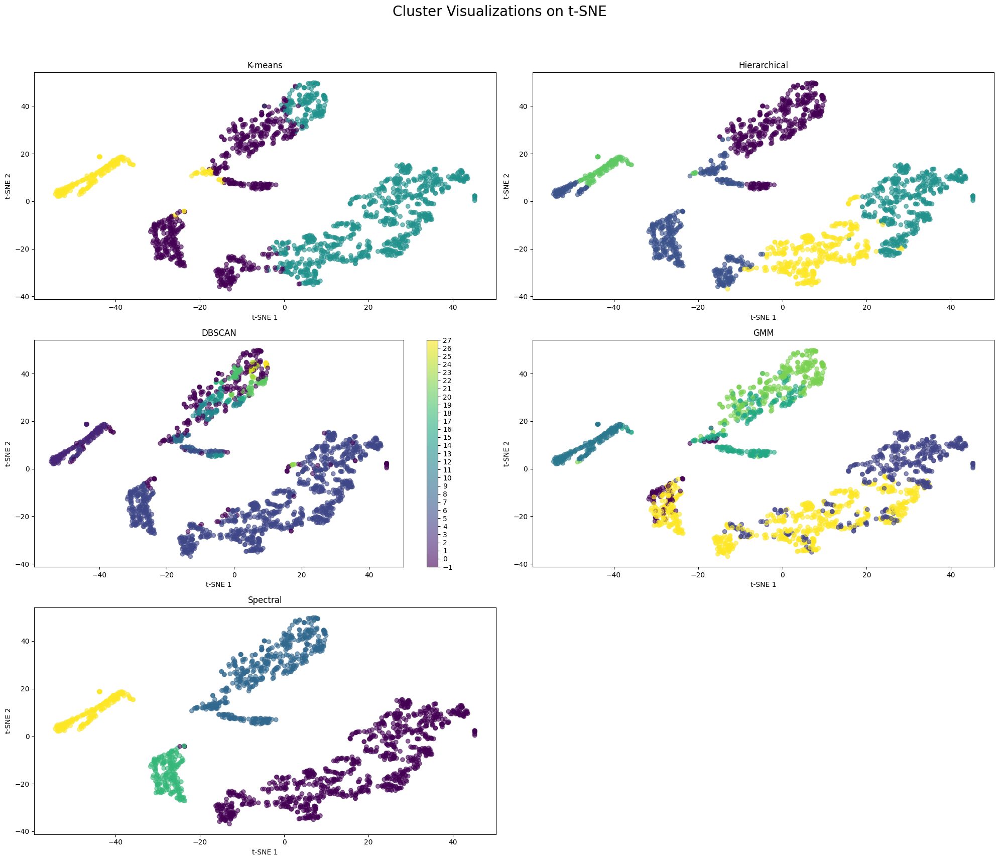

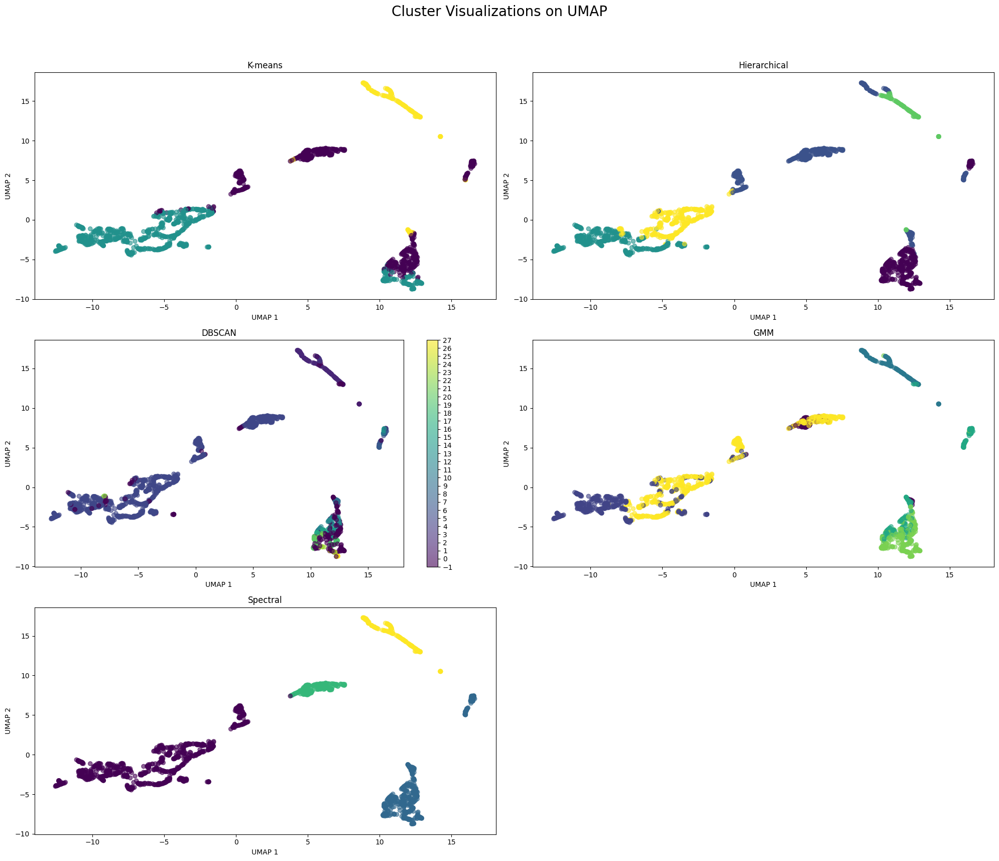

=== Clustering Performance Comparison ===


,Silhouette,Davies-Bouldin,Calinski-Harabasz,n_clusters
Method,,,,
K-means,0.391,0.869,1795.949,3
Hierarchical,0.280,1.470,1775.068,5
DBSCAN,nan,nan,nan,28
GMM,0.110,1.652,824.283,6
Spectral,0.351,1.068,1569.580,4


In [6]:
total_cluster_results, total_reductions = compare_clustering_visualizations(
    df_totals_scaled,
    kmeans_n_clusters=3,
    hierarchical_n_clusters=5,
    dbscan_eps=0.7,
    dbscan_min_samples=4,
    gmm_n_components=6,
    spectral_n_clusters=4,
    perplexity=40,
    random_state=42
)

total_metrics_df = evaluate_clustering_performance(df_totals_scaled, total_cluster_results)

# Execute all analyses
print("=== K-means Elbow ===")
plot_kmeans_elbow(df_pct_scaled)

print("\n=== Hierarchical Elbow ===")
plot_hierarchical_elbow(df_pct_scaled)

print("\n=== DBSCAN Analysis ===")
plot_dbscan_analysis(df_pct_scaled)

print("\n=== GMM Analysis ===")
plot_gmm_analysis(df_pct_scaled)

C:\Users\Amit L\PycharmProjects\Analysis\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\Amit L\PycharmProjects\Analysis\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


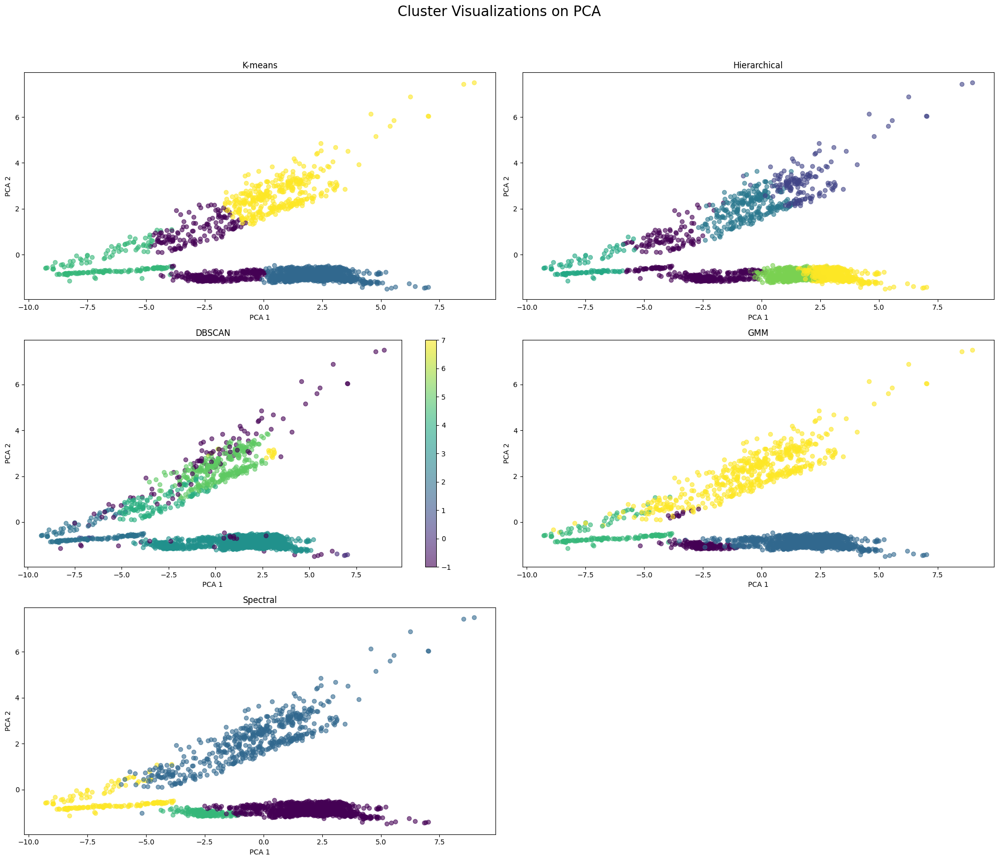

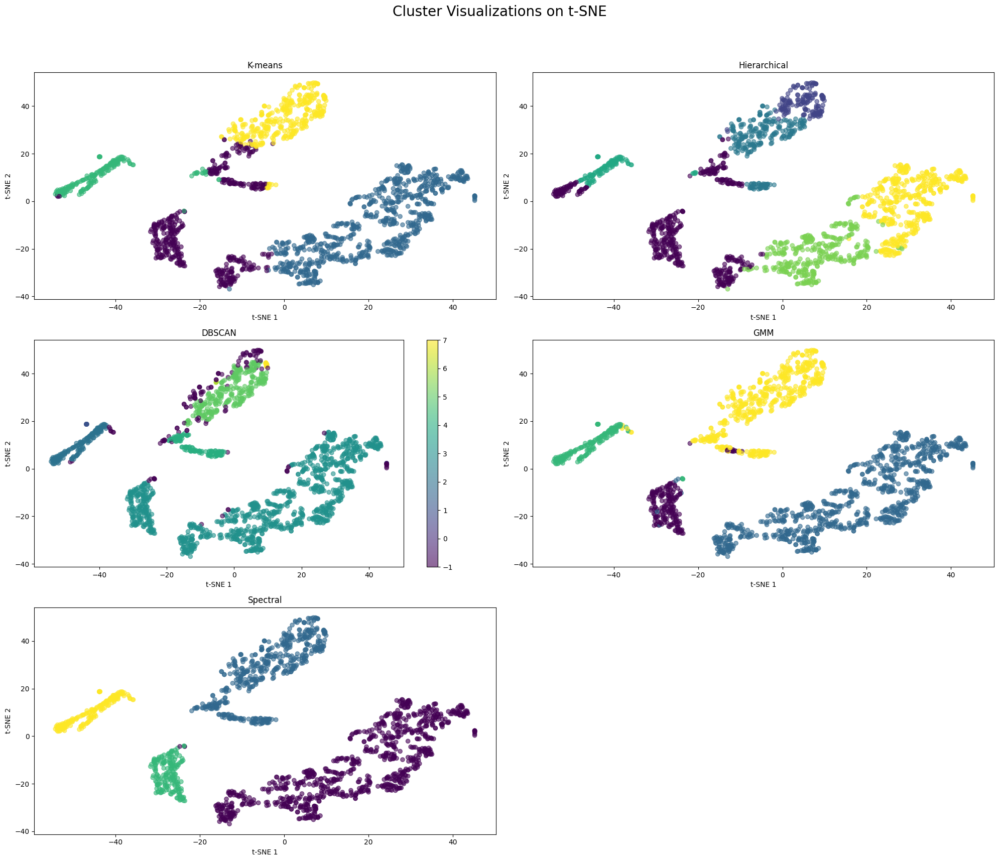

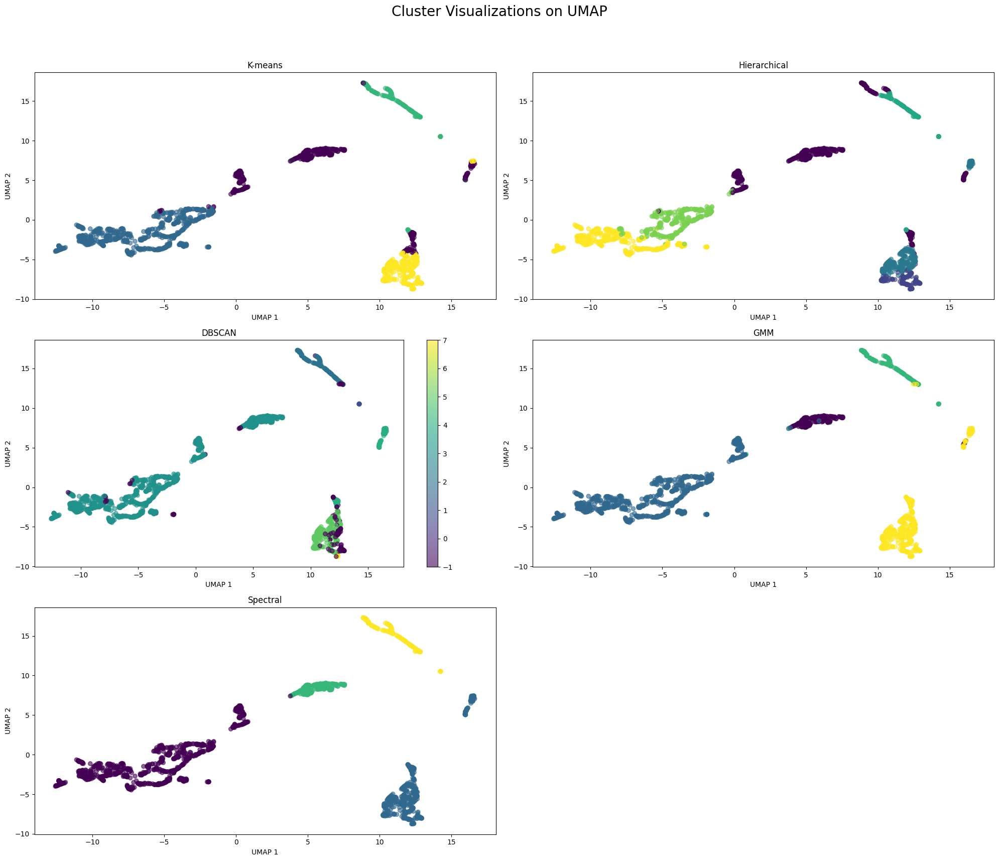

=== Clustering Performance Comparison ===


,Silhouette,Davies-Bouldin,Calinski-Harabasz,n_clusters
Method,,,,
K-means,0.307,1.206,1345.608,4
Hierarchical,0.260,1.373,1154.736,6
DBSCAN,nan,nan,nan,8
GMM,0.220,2.114,694.025,4
Spectral,0.217,2.176,722.524,4


In [7]:
pct_cluster_results, pct_reductions = compare_clustering_visualizations(
    df_pct_scaled,
    kmeans_n_clusters=4,
    hierarchical_n_clusters=6,
    dbscan_eps=0.9,
    dbscan_min_samples=4,
    gmm_n_components=4,
    spectral_n_clusters=4,
    perplexity=40,
    random_state=42
)

pct_metrics_df = evaluate_clustering_performance(df_pct_scaled, pct_cluster_results)

In [8]:
df_totals['Spectral_Cluster'] = total_cluster_results['Spectral']
#create_radar_charts(df_totals,cluster_col='Spectral_Cluster', features=None)

df_pct['Spectral_Cluster'] = pct_cluster_results['Spectral']
#create_radar_charts(df_pct,cluster_col='Spectral_Cluster', features=None)

# Create a copy to preserve original data
df_totals_normalized = df_totals.copy()

# Identify numeric features to normalize (exclude cluster column)
numeric_features = [col for col in df_totals.columns if col != 'Spectral_Cluster' and pd.api.types.is_numeric_dtype(df_totals[col])]

# Normalize features to [0,1] range
scaler = MinMaxScaler()
df_totals_normalized[numeric_features] = scaler.fit_transform(df_totals[numeric_features])
df_totals_normalized['Spectral_Cluster'] = df_totals['Spectral_Cluster']

numeric_features = [col for col in df_totals_normalized.columns if col != 'Spectral_Cluster']

plt.figure(figsize=(15, 8))
for i, feature in enumerate(numeric_features, 1):
    plt.subplot(5, 3, i)  # Adjust grid size based on feature count
    sns.violinplot(data=df_totals_normalized, x='Spectral_Cluster', y=feature, hue = 'Spectral_Cluster', cut=0, legend = 0).set(ylabel=None)
    plt.title(f'{feature}')
plt.show()

def plot_correlation_matrix(df, title="Correlation Matrix", figsize=(12, 10), 
                          cmap='coolwarm', annot=True, fmt=".2f", 
                          cbar=True, mask_upper=True, rotate_labels=45):
    """
    Generate a styled correlation matrix heatmap for any DataFrame.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        Input DataFrame with numeric columns
    title : str
        Title for the plot
    figsize : tuple
        Figure dimensions (width, height)
    cmap : str
        Color palette name
    annot : bool
        Whether to display correlation values
    fmt : str
        String formatting for annotations
    cbar : bool
        Whether to show colorbar
    mask_upper : bool
        Whether to mask upper triangle
    rotate_labels : int
        Degrees to rotate x-axis labels
    
    Returns:
    --------
    matplotlib.axes.Axes
    """
    # Calculate correlations
    corr = df.corr()
    
    # Create mask if requested
    mask = np.triu(np.ones_like(corr, dtype=bool)) if mask_upper else None
    
    # Create figure
    plt.figure(figsize=figsize)
    ax = sns.heatmap(corr, 
                    mask=mask,
                    cmap=cmap,
                    vmin=-1, 
                    vmax=1,
                    annot=annot,
                    fmt=fmt,
                    center=0,
                    square=True,
                    linewidths=0.5,
                    cbar=cbar,
                    cbar_kws={'shrink': 0.8})
    
    # Improve labels
    ax.set_xticklabels(ax.get_xticklabels(), rotation=rotate_labels, ha='right')
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
    ax.set_title(title, pad=20)
    
    plt.tight_layout()
    return ax

plot_correlation_matrix(df_totals_normalized, title="Transportation Metrics Correlation")

=== Clustering Evaluation Metrics ===
Silhouette Score: 0.6118 (higher is better, range: -1 to 1)
Davies-Bouldin Score: 0.6075 (lower is better)
Calinski-Harabasz Score: 2832.0642 (higher is better)



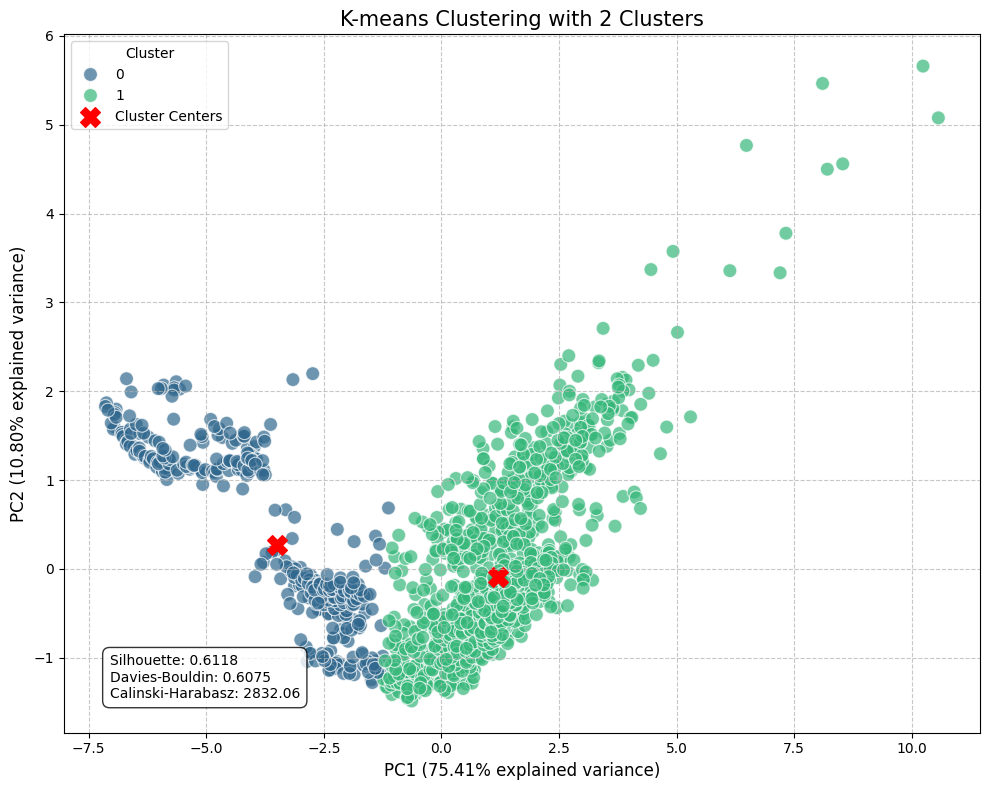

,Count,Percentage
Cluster,,
0,456,25.7%
1,1320,74.3%


C:\Users\Amit L\AppData\Local\Temp\ipykernel_13280\690339232.py:309: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  .applymap(style_contrib, subset=["Difference"])


,Cluster,Rank,Feature,Cluster Mean,Overall Mean,Difference
0,0,1,Subways: % of Comparable Pre-Pandemic Day,0.28,0.56,-0.29
1,0,2,Metro-North: % of Comparable Pre-Pandemic Day,0.16,0.53,-0.36
2,0,3,Bridges and Tunnels: % of Comparable Pre-Pandemic Day,0.76,0.94,-0.18
3,1,1,Subways: % of Comparable Pre-Pandemic Day,0.66,0.56,+0.10
4,1,2,Metro-North: % of Comparable Pre-Pandemic Day,0.65,0.53,+0.13
5,1,3,Bridges and Tunnels: % of Comparable Pre-Pandemic Day,1.00,0.94,+0.06


C:\Users\Amit L\AppData\Local\Temp\ipykernel_13280\690339232.py:355: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  .applymap(centroid_style)


Cluster,Cluster 0,Cluster 1
Feature,,
Access-A-Ride: % of Comparable Pre-Pandemic Day,-0.29 (-33%),+0.10 (+11%)
Bridges and Tunnels: % of Comparable Pre-Pandemic Day,-0.18 (-19%),+0.06 (+6%)
Buses: % of Comparable Pre-Pandemic Day,-0.23 (-42%),+0.08 (+14%)
LIRR: % of Comparable Pre-Pandemic Day,-0.36 (-59%),+0.12 (+21%)
Metro-North: % of Comparable Pre-Pandemic Day,-0.36 (-69%),+0.13 (+24%)
Staten Island Railway: % of Comparable Pre-Pandemic Day,-0.22 (-56%),+0.07 (+19%)
Subways: % of Comparable Pre-Pandemic Day,-0.29 (-51%),+0.10 (+17%)


=== Clustering Evaluation Metrics ===
Silhouette Score: 0.6118 (higher is better, range: -1 to 1)
Davies-Bouldin Score: 0.6075 (lower is better)
Calinski-Harabasz Score: 2832.0642 (higher is better)



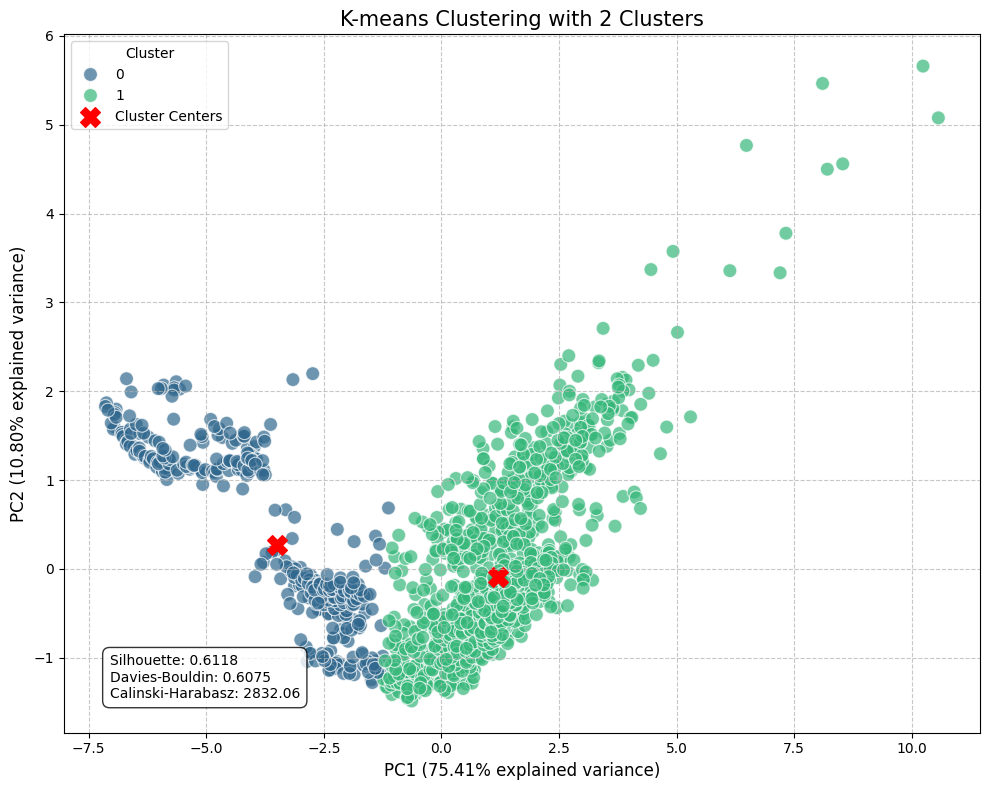

,Count,Percentage
Cluster,,
0,456,25.7%
1,1320,74.3%


C:\Users\Amit L\AppData\Local\Temp\ipykernel_13280\690339232.py:309: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  .applymap(style_contrib, subset=["Difference"])


,Cluster,Rank,Feature,Cluster Mean,Overall Mean,Difference
0,0,1,Metro-North: Total Estimated Ridership,35992.02,117522.40,-81530.38
1,0,2,Subways: Total Estimated Ridership,1274052.97,2541830.26,-1267777.29
2,0,3,Bridges and Tunnels: Total Traffic,697184.60,857259.62,-160075.02
3,1,1,Metro-North: Total Estimated Ridership,145687.44,117522.40,+28165.04
4,1,2,Subways: Total Estimated Ridership,2979789.69,2541830.26,+437959.43
5,1,3,Bridges and Tunnels: Total Traffic,912558.26,857259.62,+55298.64


C:\Users\Amit L\AppData\Local\Temp\ipykernel_13280\690339232.py:355: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  .applymap(centroid_style)


Cluster,Cluster 0,Cluster 1
Feature,,
Access-A-Ride: Total Scheduled Trips,-7101.23 (-32%),+2453.15 (+11%)
Bridges and Tunnels: Total Traffic,-160075.02 (-19%),+55298.64 (+6%)
Buses: Total Estimated Ridership,-414766.90 (-41%),+143283.11 (+14%)
LIRR: Total Estimated Ridership,-81137.90 (-58%),+28029.46 (+20%)
Metro-North: Total Estimated Ridership,-81530.38 (-69%),+28165.04 (+24%)
Staten Island Railway: Total Estimated Ridership,-2299.48 (-51%),+794.37 (+18%)
Subways: Total Estimated Ridership,-1267777.29 (-50%),+437959.43 (+17%)


In [9]:
from sklearn.metrics import davies_bouldin_score 
from sklearn.metrics import calinski_harabasz_score
from matplotlib.colors import LinearSegmentedColormap, TwoSlopeNorm
from matplotlib.backends.backend_pdf import PdfPages
from pandas.plotting import table
import matplotlib.colors as mcolors

# Use this colormap for both centroid and contributing difference styling
def get_custom_style(val, vmin, vmax):
    norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
    try:
        rgb = tuple(int(c * 255) for c in custom_cmap(norm(val))[:3])
        return f"background-color: rgb{rgb}; font-weight: bold"
    except:
        return "font-weight: bold"


def plot_kmeans_clusters(data, numerical_columns=None, n_components=2, n_clusters=4, random_state=42):
    """
    Plot K-means clusters with PCA-reduced numerical data and calculate evaluation metrics.
    
    Parameters:
    -----------
    data : pandas.DataFrame
        The input dataset containing numerical features.
    numerical_columns : list, optional
        List of column names of numerical features. If None, all columns are treated as numerical.
    n_components : int, optional
        Number of dimensions to keep in the PCA output. Default is 2.
    n_clusters : int, optional
        Number of clusters for K-means. Default is 3.
    random_state : int, optional
        Random seed for reproducibility. Default is 42.
    
    Returns:
    --------
    tuple
        Reduced data, cluster labels, k-means model, and evaluation metrics.
    """
    # Create a copy of the data to avoid modifying the original
    df = data.copy()
    
    # If numerical_columns is not specified, use all columns
    if numerical_columns is None:
        numerical_columns = df.columns.tolist()
    
    # Filter out only the numerical columns that exist in the dataframe
    valid_num_columns = [col for col in numerical_columns if col in df.columns]
    
    # Check if we have valid numerical columns to process
    if not valid_num_columns:
        raise ValueError("No valid numerical columns found in the data.")
    
    # Extract numerical features
    X = df[valid_num_columns].values
    
    # Scale the numerical data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Apply PCA for dimensionality reduction
    pca = PCA(n_components=n_components, random_state=random_state)
    X_reduced = pca.fit_transform(X_scaled)
    
    # Apply K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=random_state)
    labels = kmeans.fit_predict(X_reduced)
    
    # Calculate evaluation metrics
    metrics = {}
    metrics['silhouette'] = silhouette_score(X_reduced, labels)
    metrics['davies_bouldin'] = davies_bouldin_score(X_reduced, labels)
    metrics['calinski_harabasz'] = calinski_harabasz_score(X_reduced, labels)
    
    # Print evaluation metrics
    print("=== Clustering Evaluation Metrics ===")
    print(f"Silhouette Score: {metrics['silhouette']:.4f} (higher is better, range: -1 to 1)")
    print(f"Davies-Bouldin Score: {metrics['davies_bouldin']:.4f} (lower is better)")
    print(f"Calinski-Harabasz Score: {metrics['calinski_harabasz']:.4f} (higher is better)")
    print("")
    
    # Get the cluster centers
    centers = kmeans.cluster_centers_
    
    # Create a DataFrame with the reduced data and cluster labels
    result_df = pd.DataFrame(X_reduced, columns=[f'PC{i+1}' for i in range(n_components)])
    result_df['Cluster'] = labels
    
    # Calculate explained variance for axis labels
    explained_variance = pca.explained_variance_ratio_ * 100
    
    # Plot the clusters
    plt.figure(figsize=(10, 8))
    
    # Create scatter plot with cluster coloring
    sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=result_df, palette='viridis', s=100, alpha=0.7)
    
    # Plot cluster centers
    plt.scatter(centers[:, 0], centers[:, 1], s=200, marker='X', c='red', label='Cluster Centers')
    
    # Add labels and title
    plt.title(f'K-means Clustering with {n_clusters} Clusters', fontsize=15)
    plt.xlabel(f'PC1 ({explained_variance[0]:.2f}% explained variance)', fontsize=12)
    plt.ylabel(f'PC2 ({explained_variance[1]:.2f}% explained variance)', fontsize=12)
    plt.legend(title='Cluster', fontsize=10)
    
    # Add grid
    plt.grid(True, linestyle='--', alpha=0.7)
    
    # Add metrics to the plot
    metrics_text = (f"Silhouette: {metrics['silhouette']:.4f}\n"
                   f"Davies-Bouldin: {metrics['davies_bouldin']:.4f}\n"
                   f"Calinski-Harabasz: {metrics['calinski_harabasz']:.2f}")
    plt.annotate(metrics_text, xy=(0.05, 0.05), xycoords='axes fraction', 
                 bbox=dict(boxstyle="round,pad=0.5", facecolor="white", alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    
    # Create a 3D plot if n_components >= 3
    if n_components >= 3:
        fig = plt.figure(figsize=(12, 10))
        ax = fig.add_subplot(111, projection='3d')
        
        # Create scatter plot with cluster coloring
        scatter = ax.scatter(
            result_df['PC1'], 
            result_df['PC2'], 
            result_df['PC3'],
            c=labels, 
            cmap='viridis', 
            s=70, 
            alpha=0.8
        )
        
        # Plot cluster centers
        ax.scatter(
            centers[:, 0], 
            centers[:, 1], 
            centers[:, 2],
            s=200, 
            marker='X', 
            c='red', 
            label='Cluster Centers'
        )
        
        # Add labels and title
        ax.set_title(f'3D K-means Clustering with {n_clusters} Clusters', fontsize=15)
        ax.set_xlabel(f'PC1 ({explained_variance[0]:.2f}%)', fontsize=12)
        ax.set_ylabel(f'PC2 ({explained_variance[1]:.2f}%)', fontsize=12)
        ax.set_zlabel(f'PC3 ({explained_variance[2]:.2f}%)', fontsize=12)
        
        # Add legend
        legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
        ax.add_artist(legend1)
        
        plt.tight_layout()
        plt.show()
    
    return X_reduced, labels, kmeans, metrics

# Function to identify most contributing numerical features for each cluster
def identify_contributing_features(data, labels, numerical_columns=None):
    """
    Identify the most contributing numerical features to each cluster.
    
    Parameters:
    -----------
    data : pandas.DataFrame
        The original dataset.
    labels : numpy.ndarray
        Cluster labels from K-means.
    numerical_columns : list, optional
        List of numerical column names to analyze.
        
    Returns:
    --------
    dict
        Dictionary containing the top contributing features for each cluster.
    """
    # Create a copy of the data with cluster labels
    df = data.copy()
    df['Cluster'] = labels
    
    # If numerical_columns is not specified, use all columns
    if numerical_columns is None:
        numerical_columns = [col for col in df.columns if col != 'Cluster']
    
    # Filter to only include columns that exist in the dataframe
    valid_num_columns = [col for col in numerical_columns if col in df.columns]
    
    # Get the number of clusters
    n_clusters = len(np.unique(labels))
    
    # Dictionary to store the results
    contributing_features = {}
    
    # For each cluster, calculate the feature importance based on:
    # 1. The difference between cluster mean and overall mean
    # 2. Normalized by standard deviation (like a z-score)
    for cluster in range(n_clusters):
        # Initialize a dictionary to store the importance scores for each feature
        feature_importance = {}
        
        # Get cluster data and overall data
        cluster_data = df[df['Cluster'] == cluster][valid_num_columns]
        overall_data = df[valid_num_columns]
        
        for feature in valid_num_columns:
            # Calculate cluster mean and overall mean
            cluster_mean = cluster_data[feature].mean()
            overall_mean = overall_data[feature].mean()
            overall_std = overall_data[feature].std()
            
            # Calculate the absolute difference, normalized by standard deviation
            # This gives a measure of how distinctive this feature is for this cluster
            if overall_std > 0:  # Avoid division by zero
                importance_score = abs(cluster_mean - overall_mean) / overall_std
            else:
                importance_score = 0
                
            # Store additional statistics for this feature
            feature_importance[feature] = {
                'importance_score': importance_score,
                'cluster_mean': cluster_mean,
                'overall_mean': overall_mean,
                'overall_std': overall_std,
                'difference': cluster_mean - overall_mean,
                'percent_diff': ((cluster_mean - overall_mean) / overall_mean * 100) if overall_mean != 0 else float('inf')
            }
        
        # Sort features by importance score (higher means more important)
        sorted_features = sorted(feature_importance.items(), key=lambda x: x[1]['importance_score'], reverse=True)
        
        # Store the sorted features for this cluster
        contributing_features[cluster] = sorted_features
    
    return contributing_features

# Fix for the centroid heatmap visualization that was causing the error
def analyze_clusters(data, labels, numerical_columns=None, top_n_features=3):
    from matplotlib import cm
    from matplotlib.colors import Normalize, TwoSlopeNorm, LinearSegmentedColormap
    import seaborn as sns
    import pandas as pd
    import numpy as np

    df = data.copy()
    df['Cluster'] = labels

    if numerical_columns is None:
        numerical_columns = df.select_dtypes(include=[np.number]).columns.tolist()
        if 'Cluster' in numerical_columns:
            numerical_columns.remove('Cluster')

    valid_num_columns = [col for col in numerical_columns if col in df.columns and np.issubdtype(df[col].dtype, np.number)]
    n_clusters = len(np.unique(labels))

    # --- Cluster size summary ---
    cluster_counts = df['Cluster'].value_counts().sort_index()
    size_df = pd.DataFrame({
        'Cluster': cluster_counts.index,
        'Count': cluster_counts.values,
        'Percentage': [f"{v/len(df)*100:.1f}%" for v in cluster_counts.values]
    }).set_index('Cluster')
    display(size_df.style.set_caption("Cluster Size Summary").background_gradient(cmap='Purples').set_properties(**{'font-weight': 'bold'}))

    # --- Top contributing features ---
    contributing_features = identify_contributing_features(data, labels, valid_num_columns)
    contrib_records = []
    all_diffs = []

    for cluster in range(n_clusters):
        top_features = contributing_features[cluster][:top_n_features]
        for i, (feature, stats) in enumerate(top_features):
            diff_val = stats["difference"]
            all_diffs.append(diff_val)
            contrib_records.append({
                "Cluster": cluster,
                "Rank": i + 1,
                "Feature": feature,
                "Cluster Mean": round(stats["cluster_mean"], 2),
                "Overall Mean": round(stats["overall_mean"], 2),
                "Difference": round(diff_val, 2),
                "Percent Diff": stats['percent_diff']
            })

    contrib_df = pd.DataFrame(contrib_records)

    # Custom colormap: soft red → white → purple
    soft_red = "#f4cccc"
    white = "#ffffff"
    purple = "#7e57c2"
    custom_cmap = LinearSegmentedColormap.from_list("custom_red_purple", [soft_red, white, purple])

    min_diff, max_diff = min(all_diffs), max(all_diffs)
    norm = TwoSlopeNorm(vmin=min_diff, vcenter=0, vmax=max_diff)

    def style_contrib(val):
        try:
            rgb = tuple(int(c * 255) for c in custom_cmap(norm(val))[:3])
            return f"background-color: rgb{rgb}; font-weight: bold"
        except:
            return "font-weight: bold"

    display(
        contrib_df.drop(columns=["Percent Diff"], errors="ignore")  # Optional: drop if not needed
        .style
        .applymap(style_contrib, subset=["Difference"])
        .set_caption("Top Contributing Features by Cluster")
        .format({
            "Cluster Mean": "{:.2f}",
            "Overall Mean": "{:.2f}",
            "Difference": "{:+.2f}"
        })
        .set_properties(**{'font-weight': 'bold'})
    )

    # --- Cluster centroids ---
    centroid_records = []
    all_diffs = []

    for col in valid_num_columns:
        overall_mean = df[col].mean()
        for cluster in range(n_clusters):
            cluster_mean = df[df['Cluster'] == cluster][col].mean()
            diff = cluster_mean - overall_mean
            pct_diff = 100 * diff / overall_mean if overall_mean != 0 else 0
            formatted_val = f"{diff:+.2f} ({pct_diff:+.0f}%)"
            centroid_records.append({
                "Feature": col,
                "Cluster": f"Cluster {cluster}",
                "Value": formatted_val,
                "RawDiff": diff
            })
            all_diffs.append(diff)

    centroid_df = pd.DataFrame(centroid_records)
    pivot_df = centroid_df.pivot(index="Feature", columns="Cluster", values="Value")
    raw_diff = centroid_df.pivot(index="Feature", columns="Cluster", values="RawDiff")

    min_cd, max_cd = min(all_diffs), max(all_diffs)
    norm_cd = TwoSlopeNorm(vmin=min_cd, vcenter=0, vmax=max_cd)

    def centroid_style(val):
        try:
            diff = float(val.split()[0])
            rgb = tuple(int(c * 255) for c in custom_cmap(norm_cd(diff))[:3])
            return f"background-color: rgb{rgb}; font-weight: bold"
        except:
            return "font-weight: bold"

    display(
        pivot_df.style
        .applymap(centroid_style)
        .set_caption("Cluster Centroids (Deviation from Overall Mean)")
        .set_properties(**{'font-weight': 'bold'})
    )

    # --- Summary table: std & count per cluster-feature ---
    summary_records = []
    for col in valid_num_columns:
        overall_std = df[col].std()
        for cluster in range(n_clusters):
            cluster_data = df[df['Cluster'] == cluster][col]
            summary_records.append({
                "Feature": col,
                "Cluster": cluster,
                "Count": cluster_data.shape[0],
                "Cluster Std": round(cluster_data.std(), 2),
                "Overall Std": round(overall_std, 2)
            })

    summary_df = pd.DataFrame(summary_records)
    summary_pivot = summary_df.pivot(index="Feature", columns="Cluster", values=["Count", "Cluster Std"])
    display(
        summary_pivot.style
        .background_gradient(cmap="Purples")
        .set_caption("Feature Summary by Cluster (Count & Std Deviation)")
        .format("{:.2f}")
        .set_properties(**{'font-weight': 'bold'})
    )
    return pivot_df, raw_diff



import matplotlib.colors as mcolors

def export_colored_centroid_table_to_pdf(pivot_df, raw_diff, filename="centroids_table.pdf", title="Cluster Centroids (Deviation from Overall Mean)"):
    """
    Exports a pivot_df DataFrame to a color-coded PDF table with minimal white space.
    """
    # Calculate tighter figure dimensions
    n_cols = len(pivot_df.columns)
    n_rows = len(pivot_df.index)
    
    # Adjust these multipliers to control spacing
    col_width = 1.5  # Width per column
    row_height = 0.5  # Height per row
    margin = 0.5      # Small margin
    
    fig, ax = plt.subplots(figsize=(n_cols * col_width + margin, n_rows * row_height + margin))
    ax.axis('off')

    # Extract short feature names
    short_index = [idx.split(':')[0].strip() for idx in pivot_df.index]
    
    # Normalize the raw differences for color mapping
    raw_vals = raw_diff.values.astype(float)
    clip_limit = np.percentile(np.abs(raw_vals), 95)
    norm = mcolors.TwoSlopeNorm(vmin=-clip_limit, vcenter=0, vmax=clip_limit)
    cmap = plt.get_cmap("Purples")

    # Build cell text and colors
    cell_text = []
    cell_colors = []
    for i, row in enumerate(pivot_df.index):
        row_text = []
        row_colors = []
        for j, col in enumerate(pivot_df.columns):
            val = pivot_df.loc[row, col]
            raw = np.clip(raw_diff.loc[row, col], -clip_limit, clip_limit)
            row_text.append(str(val))
            rgba = cmap(norm(raw))
            rgba = (rgba[0], rgba[1], rgba[2], 0.6)
            row_colors.append(rgba)
        cell_text.append(row_text)
        cell_colors.append(row_colors)

    # Draw the table with tight layout
    table = ax.table(
        cellText=cell_text,
        rowLabels=short_index,
        colLabels=pivot_df.columns,
        cellColours=cell_colors,
        loc='center',
        cellLoc='center'
    )

    # Style the table
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    
    # Scale the table to fill the figure
    table.scale(1, 1.2)  # Adjust the second parameter if row heights need tweaking
    
    for key, cell in table.get_celld().items():
        cell.set_text_props(weight='bold')
        if key[0] == 0 or key[1] < 0:  # Header and row label cells
            cell.set_text_props(weight='bold', color='black')

    # Save with minimal padding
    plt.savefig(filename, bbox_inches='tight', pad_inches=0)
    plt.close()




pct_X_reduced, pct_labels, pkmeans, pmetrics = plot_kmeans_clusters(df_pct, n_components=2, n_clusters=2)
pct_pivot_df,pct_raw_diff = analyze_clusters(df_pct.drop("Spectral_Cluster",axis='columns'), pct_labels)
export_colored_centroid_table_to_pdf(pct_pivot_df, pct_raw_diff, filename = "pct_centroids_table.pdf")

totals_X_reduced, totals_labels, tkmeans, tmetrics = plot_kmeans_clusters(df_pct, n_components=2, n_clusters=2)
totals_pivot_df, totals_raw_diff = analyze_clusters(df_totals.drop("Spectral_Cluster",axis='columns'), totals_labels)
export_colored_centroid_table_to_pdf(totals_pivot_df, totals_raw_diff, filename= "totals_centroids_table.pdf")

print(X.head)

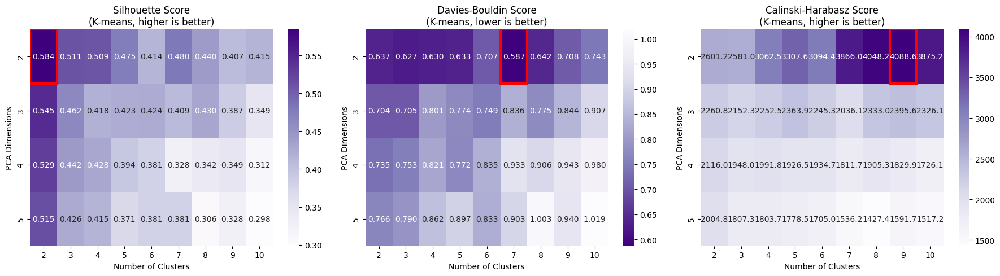

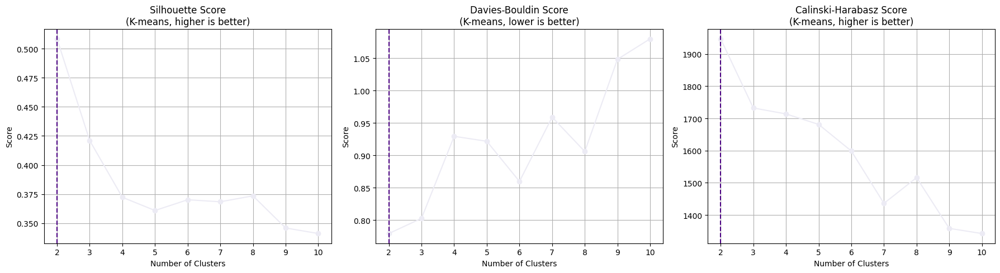

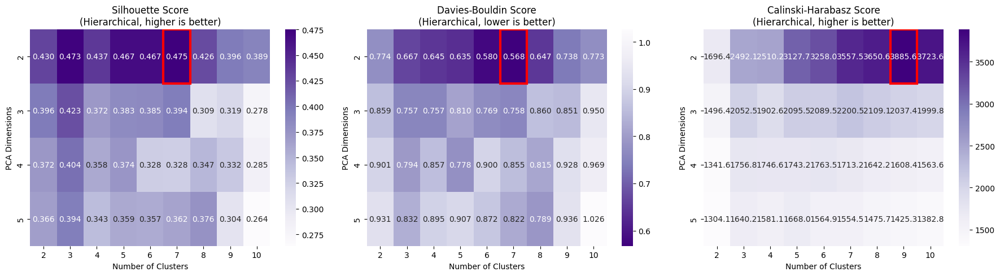

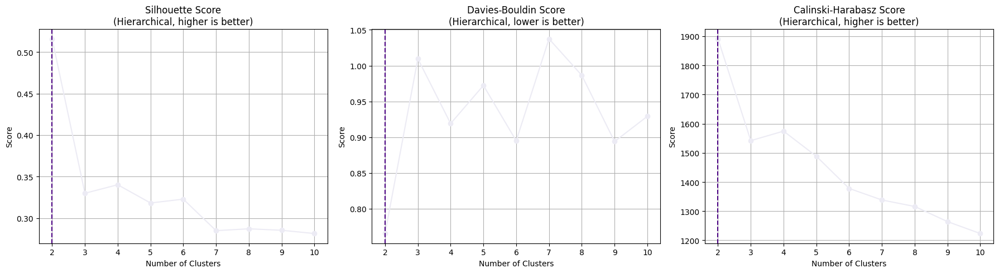

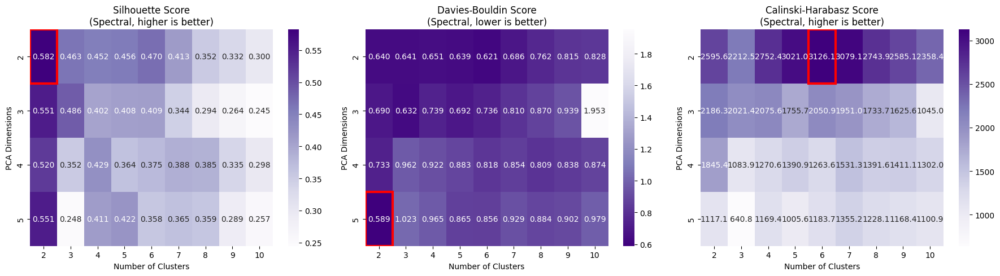

...

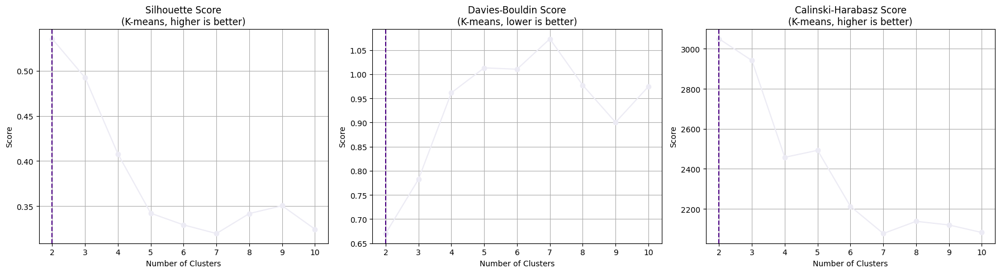

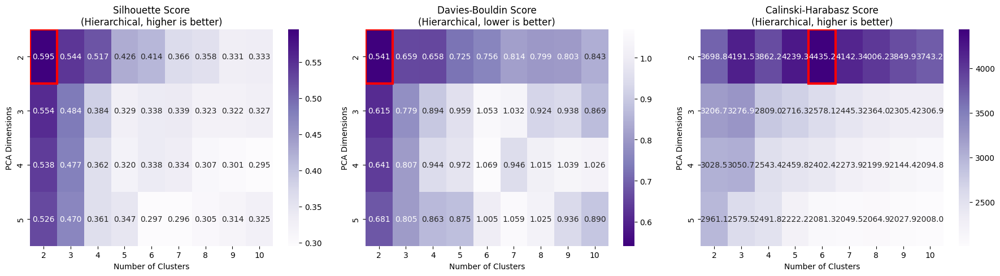

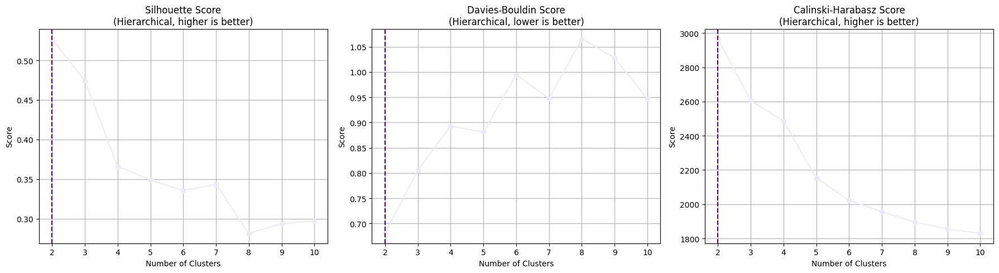

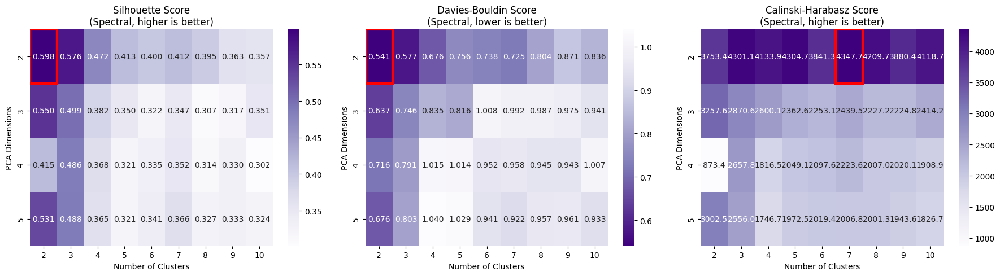

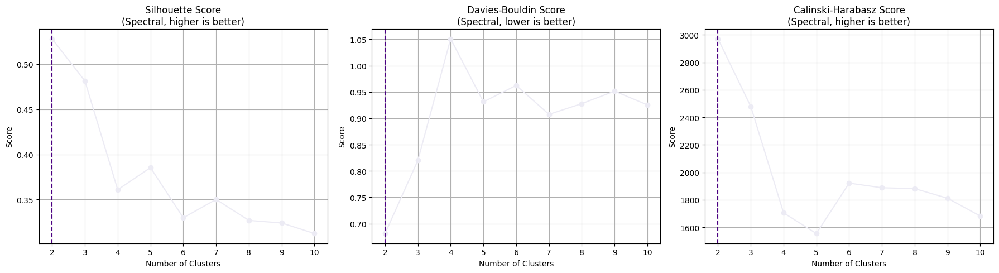

In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering, SpectralClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from matplotlib.backends.backend_pdf import PdfPages
import contextlib

def grid_search_clustering(data, numerical_columns=None, 
                          use_pca=True,
                          dim_range=range(2, 6), 
                          cluster_range=range(2, 8),
                          random_state=42,
                          clustering_method='kmeans'):
    """
    Perform a grid search to find the optimal number of PCA dimensions and clusters
    for numerical data.
    
    Parameters:
    -----------
    data : pandas.DataFrame
        The input dataset containing numerical features.
    numerical_columns : list, optional
        List of column names of numerical features. If None, all columns are treated as numerical.
    use_pca : bool, optional
        Whether to use PCA dimensionality reduction or not.
    dim_range : range, optional
        Range of dimensions to try if using PCA.
    cluster_range : range, optional
        Range of clusters to try.
    random_state : int, optional
        Random seed for reproducibility.
    clustering_method : str, optional
        Clustering method to use ('kmeans', 'hierarchical', or 'spectral').
        
    Returns:
    --------
    tuple
        Grid of silhouette scores, Davies-Bouldin scores, and Calinski-Harabasz scores.
    """
    # Process numerical data
    df = data.copy()
    
    if numerical_columns is None:
        numerical_columns = df.columns.tolist()
    
    valid_num_columns = [col for col in numerical_columns if col in df.columns]
    
    if not valid_num_columns:
        raise ValueError("No valid numerical columns found in the data.")
    
    # Extract and scale numerical features
    X = df[valid_num_columns].values
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    if use_pca:
        # Initialize result grids based on PCA dimensions
        silhouette_grid = np.zeros((len(dim_range), len(cluster_range)))
        db_grid = np.zeros((len(dim_range), len(cluster_range)))
        ch_grid = np.zeros((len(dim_range), len(cluster_range)))
        
        # Perform grid search with PCA
        for i, n_components in enumerate(dim_range):
            # Apply PCA with n_components
            pca = PCA(n_components=n_components, random_state=random_state)
            X_reduced = pca.fit_transform(X_scaled)
            
            for j, n_clusters in enumerate(cluster_range):
                # Apply clustering
                if clustering_method == 'kmeans':
                    model = KMeans(n_clusters=n_clusters, random_state=random_state)
                elif clustering_method == 'hierarchical':
                    model = AgglomerativeClustering(n_clusters=n_clusters)
                elif clustering_method == 'spectral':
                    model = SpectralClustering(n_clusters=n_clusters, random_state=random_state,
                                             affinity='nearest_neighbors')
                else:
                    raise ValueError("Invalid clustering method. Use 'kmeans', 'hierarchical', or 'spectral'.")
                    
                labels = model.fit_predict(X_reduced)
                
                # Calculate clustering quality metrics if there are at least 2 different clusters
                n_unique_labels = len(np.unique(labels))
                if n_unique_labels >= 2:
                    silhouette_grid[i, j] = silhouette_score(X_reduced, labels)
                    db_grid[i, j] = davies_bouldin_score(X_reduced, labels)
                    ch_grid[i, j] = calinski_harabasz_score(X_reduced, labels)
                else:
                    silhouette_grid[i, j] = float('nan')
                    db_grid[i, j] = float('nan')
                    ch_grid[i, j] = float('nan')
    else:
        # If not using PCA, we'll have a 1D grid (only varying cluster count)
        silhouette_grid = np.zeros(len(cluster_range))
        db_grid = np.zeros(len(cluster_range))
        ch_grid = np.zeros(len(cluster_range))
        
        # Perform grid search without PCA
        for j, n_clusters in enumerate(cluster_range):
            # Apply clustering
            if clustering_method == 'kmeans':
                model = KMeans(n_clusters=n_clusters, random_state=random_state)
            elif clustering_method == 'hierarchical':
                model = AgglomerativeClustering(n_clusters=n_clusters)
            elif clustering_method == 'spectral':
                model = SpectralClustering(n_clusters=n_clusters, random_state=random_state,
                                         affinity='nearest_neighbors')
            else:
                raise ValueError("Invalid clustering method. Use 'kmeans', 'hierarchical', or 'spectral'.")
                
            labels = model.fit_predict(X_scaled)
            
            # Calculate clustering quality metrics
            n_unique_labels = len(np.unique(labels))
            if n_unique_labels >= 2:
                silhouette_grid[j] = silhouette_score(X_scaled, labels)
                db_grid[j] = davies_bouldin_score(X_scaled, labels)
                ch_grid[j] = calinski_harabasz_score(X_scaled, labels)
            else:
                silhouette_grid[j] = float('nan')
                db_grid[j] = float('nan')
                ch_grid[j] = float('nan')
    
    return silhouette_grid, db_grid, ch_grid

def plot_grid_search_results(silhouette_grid, db_grid, ch_grid, dim_range=None, cluster_range=None, 
                             clustering_method=None, use_pca=True, pdf=None):
    """
    Plot results of the grid search.
    
    Parameters:
    -----------
    silhouette_grid : numpy.ndarray
        Grid of silhouette scores.
    db_grid : numpy.ndarray
        Grid of Davies-Bouldin scores.
    ch_grid : numpy.ndarray
        Grid of Calinski-Harabasz scores.
    dim_range : range, optional
        Range of dimensions tried.
    cluster_range : range
        Range of clusters tried.
    clustering_method : str
        Clustering method used ('kmeans', 'hierarchical', or 'spectral').
    use_pca : bool
        Whether PCA was used or not.
    """
    if use_pca:
        # Plot heatmaps for PCA-based results
        fig, axes = plt.subplots(1, 3, figsize=(18, 5))
        
        # Plot silhouette score (higher is better)
        sns.heatmap(silhouette_grid, annot=True, fmt=".3f", cmap="Purples", 
                    xticklabels=cluster_range, yticklabels=dim_range, ax=axes[0])
        axes[0].set_title(f'Silhouette Score\n({clustering_method}, higher is better)')
        axes[0].set_xlabel('Number of Clusters')
        axes[0].set_ylabel('PCA Dimensions')
        
        # Find and mark the best silhouette score
        best_silhouette_idx = np.unravel_index(np.nanargmax(silhouette_grid), silhouette_grid.shape)
        axes[0].add_patch(plt.Rectangle((best_silhouette_idx[1], best_silhouette_idx[0]), 1, 1, 
                                       fill=False, edgecolor='red', lw=3))
        
        # Plot Davies-Bouldin score (lower is better)
        sns.heatmap(db_grid, annot=True, fmt=".3f", cmap="Purples_r", 
                    xticklabels=cluster_range, yticklabels=dim_range, ax=axes[1])
        axes[1].set_title(f'Davies-Bouldin Score\n({clustering_method}, lower is better)')
        axes[1].set_xlabel('Number of Clusters')
        axes[1].set_ylabel('PCA Dimensions')
        
        # Find and mark the best Davies-Bouldin score
        best_db_idx = np.unravel_index(np.nanargmin(db_grid), db_grid.shape)
        axes[1].add_patch(plt.Rectangle((best_db_idx[1], best_db_idx[0]), 1, 1, 
                                       fill=False, edgecolor='red', lw=3))
        
        # Plot Calinski-Harabasz score (higher is better)
        sns.heatmap(ch_grid, annot=True, fmt=".1f", cmap="Purples", 
                    xticklabels=cluster_range, yticklabels=dim_range, ax=axes[2])
        axes[2].set_title(f'Calinski-Harabasz Score\n({clustering_method}, higher is better)')
        axes[2].set_xlabel('Number of Clusters')
        axes[2].set_ylabel('PCA Dimensions')
        
        # Find and mark the best Calinski-Harabasz score
        best_ch_idx = np.unravel_index(np.nanargmax(ch_grid), ch_grid.shape)
        axes[2].add_patch(plt.Rectangle((best_ch_idx[1], best_ch_idx[0]), 1, 1, 
                                       fill=False, edgecolor='red', lw=3))
        
        plt.tight_layout()
        if pdf is not None:
            pdf.savefig(plt.gcf()) 
        plt.show()
        
        # Print the best combinations
        best_dim_sil, best_clust_sil = dim_range[best_silhouette_idx[0]], cluster_range[best_silhouette_idx[1]]
        best_dim_db, best_clust_db = dim_range[best_db_idx[0]], cluster_range[best_db_idx[1]]
        best_dim_ch, best_clust_ch = dim_range[best_ch_idx[0]], cluster_range[best_ch_idx[1]]
        
        print(f"Best combination by Silhouette score: {best_dim_sil} dimensions, {best_clust_sil} clusters")
        print(f"Best combination by Davies-Bouldin score: {best_dim_db} dimensions, {best_clust_db} clusters")
        print(f"Best combination by Calinski-Harabasz score: {best_dim_ch} dimensions, {best_clust_ch} clusters")
    
    else:
        # Plot line charts for non-PCA results
        fig, axes = plt.subplots(1, 3, figsize=(18, 5))
        
        # Plot silhouette score (higher is better)
        axes[0].plot(cluster_range, silhouette_grid, marker='o', linestyle='-')
        axes[0].set_title(f'Silhouette Score\n({clustering_method}, higher is better)')
        axes[0].set_xlabel('Number of Clusters')
        axes[0].set_ylabel('Score')
        axes[0].grid(True)
        
        # Find and mark the best silhouette score
        best_silhouette_idx = np.nanargmax(silhouette_grid)
        axes[0].axvline(x=cluster_range[best_silhouette_idx], color='#4B0082', linestyle='--')
        
        # Plot Davies-Bouldin score (lower is better)
        axes[1].plot(cluster_range, db_grid, marker='o', linestyle='-')
        axes[1].set_title(f'Davies-Bouldin Score\n({clustering_method}, lower is better)')
        axes[1].set_xlabel('Number of Clusters')
        axes[1].set_ylabel('Score')
        axes[1].grid(True)
        
        # Find and mark the best Davies-Bouldin score
        best_db_idx = np.nanargmin(db_grid)
        axes[1].axvline(x=cluster_range[best_db_idx], color='#4B0082', linestyle='--')
        
        # Plot Calinski-Harabasz score (higher is better)
        axes[2].plot(cluster_range, ch_grid, marker='o', linestyle='-')
        axes[2].set_title(f'Calinski-Harabasz Score\n({clustering_method}, higher is better)')
        axes[2].set_xlabel('Number of Clusters')
        axes[2].set_ylabel('Score')
        axes[2].grid(True)
        
        # Find and mark the best Calinski-Harabasz score
        best_ch_idx = np.nanargmax(ch_grid)
        axes[2].axvline(x=cluster_range[best_ch_idx], color='#4B0082', linestyle='--')
        
        plt.tight_layout()
        if pdf is not None:
            pdf.savefig(plt.gcf()) 
        plt.show()
        
        # Print the best number of clusters
        best_clust_sil = cluster_range[best_silhouette_idx]
        best_clust_db = cluster_range[best_db_idx]
        best_clust_ch = cluster_range[best_ch_idx]
        
        print(f"Best number of clusters by Silhouette score: {best_clust_sil}")
        print(f"Best number of clusters by Davies-Bouldin score: {best_clust_db}")
        print(f"Best number of clusters by Calinski-Harabasz score: {best_clust_ch}")

def run_grid_search(X, numerical_columns=None, pdf_filename="grid_search_plots.pdf", log_filename="grid_search_output.txt"):
    dim_range = range(2, 6)
    cluster_range = range(2, 11)

    with PdfPages(pdf_filename) as pdf, open(log_filename, 'w') as log_file, contextlib.redirect_stdout(log_file):
        # K-means with PCA
        print("\n=== K-means Clustering Grid Search with PCA ===")
        sil, db, ch = grid_search_clustering(X, numerical_columns, True, dim_range, cluster_range, clustering_method='kmeans')
        plot_grid_search_results(sil, db, ch, dim_range, cluster_range, 'K-means', True, pdf)

        print("\n=== K-means Clustering Grid Search without PCA ===")
        sil, db, ch = grid_search_clustering(X, numerical_columns, False, cluster_range=cluster_range, clustering_method='kmeans')
        plot_grid_search_results(sil, db, ch, cluster_range=cluster_range, clustering_method='K-means', use_pca=False, pdf=pdf)

        # Hierarchical
        print("\n=== Hierarchical Clustering Grid Search with PCA ===")
        sil, db, ch = grid_search_clustering(X, numerical_columns, True, dim_range, cluster_range, clustering_method='hierarchical')
        plot_grid_search_results(sil, db, ch, dim_range, cluster_range, 'Hierarchical', True, pdf)

        print("\n=== Hierarchical Clustering Grid Search without PCA ===")
        sil, db, ch = grid_search_clustering(X, numerical_columns, False, cluster_range=cluster_range, clustering_method='hierarchical')
        plot_grid_search_results(sil, db, ch, cluster_range=cluster_range, clustering_method='Hierarchical', use_pca=False, pdf=pdf)

        # Spectral
        print("\n=== Spectral Clustering Grid Search with PCA ===")
        sil, db, ch = grid_search_clustering(X, numerical_columns, True, dim_range, cluster_range, clustering_method='spectral')
        plot_grid_search_results(sil, db, ch, dim_range, cluster_range, 'Spectral', True, pdf)

        print("\n=== Spectral Clustering Grid Search without PCA ===")
        sil, db, ch = grid_search_clustering(X, numerical_columns, False, cluster_range=cluster_range, clustering_method='spectral')
        plot_grid_search_results(sil, db, ch, cluster_range=cluster_range, clustering_method='Spectral', use_pca=False, pdf=pdf)

# Example usage:
# Assuming X is your numerical dataframe
run_grid_search(df_pct.drop("Spectral_Cluster",axis='columns'), pdf_filename="pct_grid_search_plots.pdf")
run_grid_search(df_totals.drop("Spectral_Cluster",axis='columns'), pdf_filename="totals_grid_search_plots.pdf")

run_grid_search(df_totals.drop("Spectral_Cluster",axis='columns'))


=== PCA Component Weights ===


,PC1,PC2
Subways: % of Comparable Pre-Pandemic Day,0.415533,-0.012568
Buses: % of Comparable Pre-Pandemic Day,0.352659,0.482100
LIRR: % of Comparable Pre-Pandemic Day,0.392748,-0.359426
Metro-North: % of Comparable Pre-Pandemic Day,0.397313,-0.294188
Access-A-Ride: % of Comparable Pre-Pandemic Day,0.371665,0.090261
Bridges and Tunnels: % of Comparable Pre-Pandemic Day,0.352085,0.602546
Staten Island Railway: % of Comparable Pre-Pandemic Day,0.358827,-0.424828


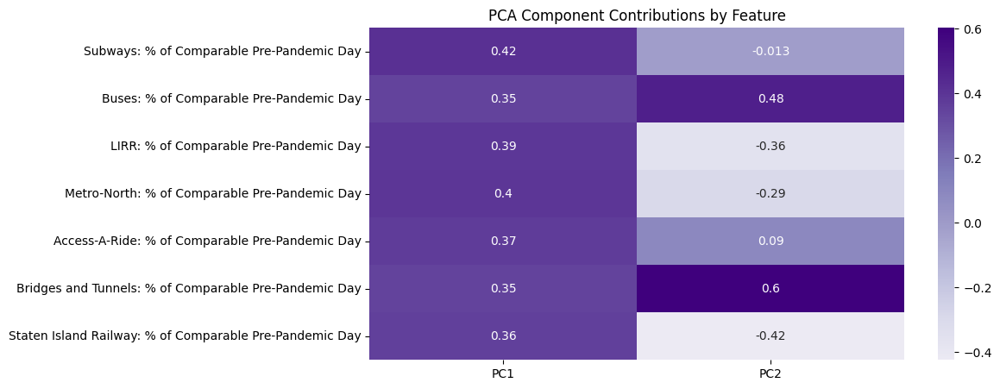

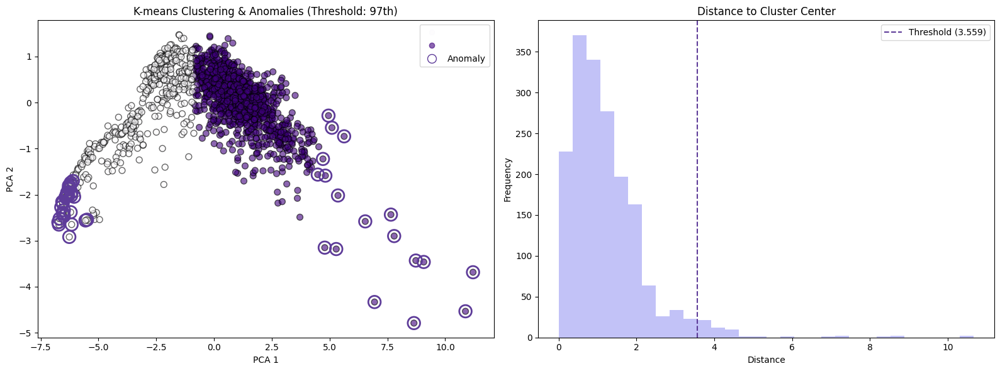

Total points: 1776
Anomalies detected: 54 (3.04%)
Distance threshold: 3.559

Anomalies per original cluster:
  Cluster 0: 36/523 (6.88%) anomalies
  Cluster 1: 18/1253 (1.44%) anomalies

=== Ranked Features (By Std. Difference) ===


,Feature,Anomaly Mean,Normal Mean,Mean Difference,Std. Diff
5,Bridges and Tunnels: % of Comparable Pre-Pande...,0.584259,0.948368,-0.364109,-2.512468
4,Access-A-Ride: % of Comparable Pre-Pandemic Day,0.547407,0.889239,-0.341832,-1.326412
1,Buses: % of Comparable Pre-Pandemic Day,0.326296,0.558711,-0.232415,-1.211231
0,Subways: % of Comparable Pre-Pandemic Day,0.409815,0.568438,-0.158623,-0.788876
6,Staten Island Railway: % of Comparable Pre-Pan...,0.467407,0.385441,0.081966,0.405621
3,Metro-North: % of Comparable Pre-Pandemic Day,0.516296,0.525923,-0.009627,-0.035381
2,LIRR: % of Comparable Pre-Pandemic Day,0.607407,0.607433,-0.000026,-0.000084


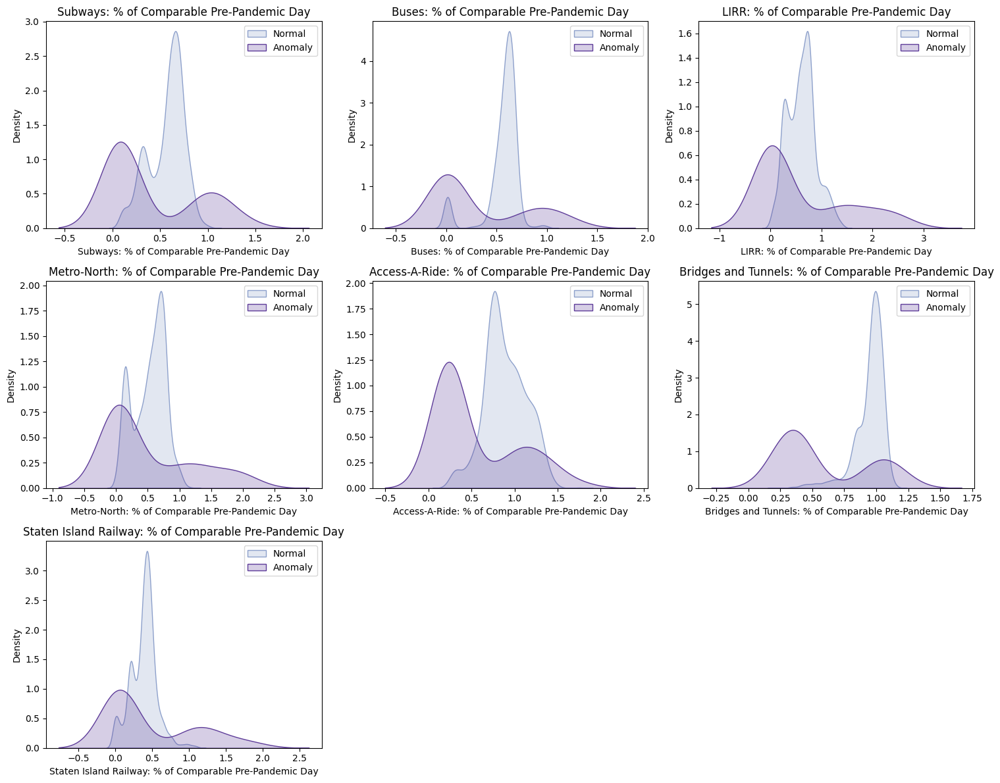

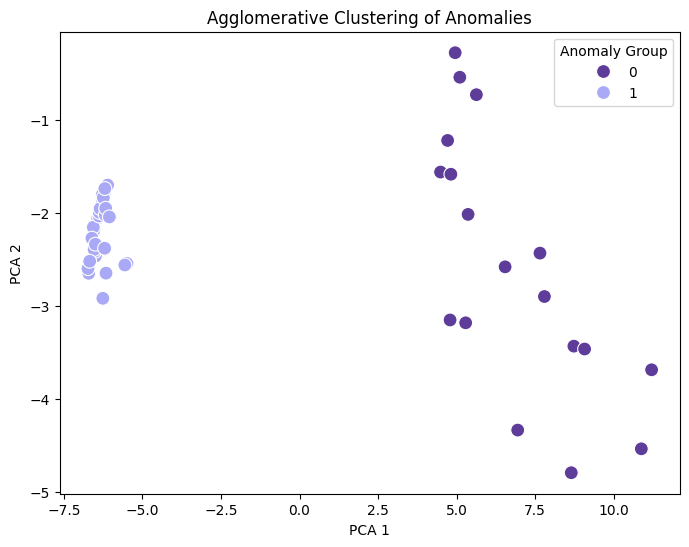


=== PCA Component Weights ===


,PC1,PC2
Subways: Total Estimated Ridership,0.404935,-0.051127
Buses: Total Estimated Ridership,0.365488,0.093623
LIRR: Total Estimated Ridership,0.399098,-0.138242
Metro-North: Total Estimated Ridership,0.385893,-0.181838
Access-A-Ride: Total Scheduled Trips,0.386408,-0.102718
Bridges and Tunnels: Total Traffic,0.316467,0.897128
Staten Island Railway: Total Estimated Ridership,0.380514,-0.347931


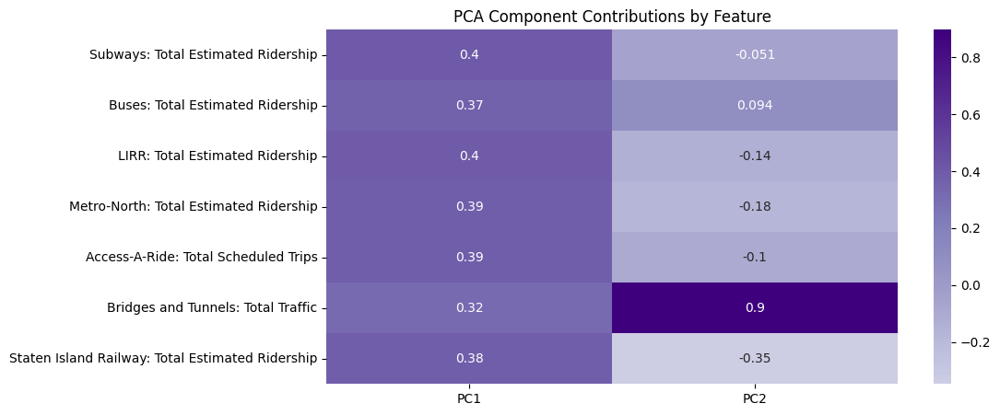

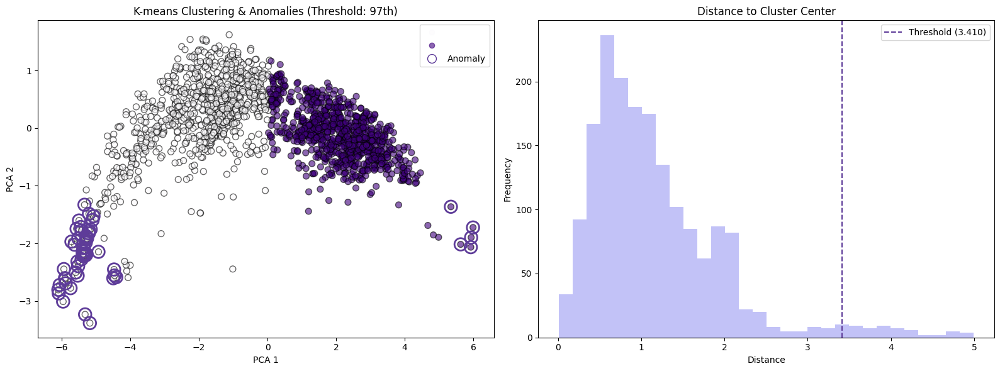

Total points: 1776
Anomalies detected: 54 (3.04%)
Distance threshold: 3.410

Anomalies per original cluster:
  Cluster 0: 49/893 (5.49%) anomalies
  Cluster 1: 5/883 (0.57%) anomalies

=== Ranked Features (By Std. Difference) ===


,Feature,Anomaly Mean,Normal Mean,Mean Difference,Std. Diff
5,Bridges and Tunnels: Total Traffic,385382.703704,8.720572e+05,-4.866744e+05,-3.446458
1,Buses: Total Estimated Ridership,253458.481481,1.035178e+06,-7.817192e+05,-1.788914
4,Access-A-Ride: Total Scheduled Trips,8507.777778,2.278354e+04,-1.427576e+04,-1.734098
0,Subways: Total Estimated Ridership,890935.722222,2.593600e+06,-1.702665e+06,-1.594792
2,LIRR: Total Estimated Ridership,36660.000000,1.419862e+05,-1.053262e+05,-1.457928
3,Metro-North: Total Estimated Ridership,31327.092593,1.202254e+05,-8.889830e+04,-1.322255
6,Staten Island Railway: Total Estimated Ridership,2174.981481,4.564621e+03,-2.389639e+03,-0.885015


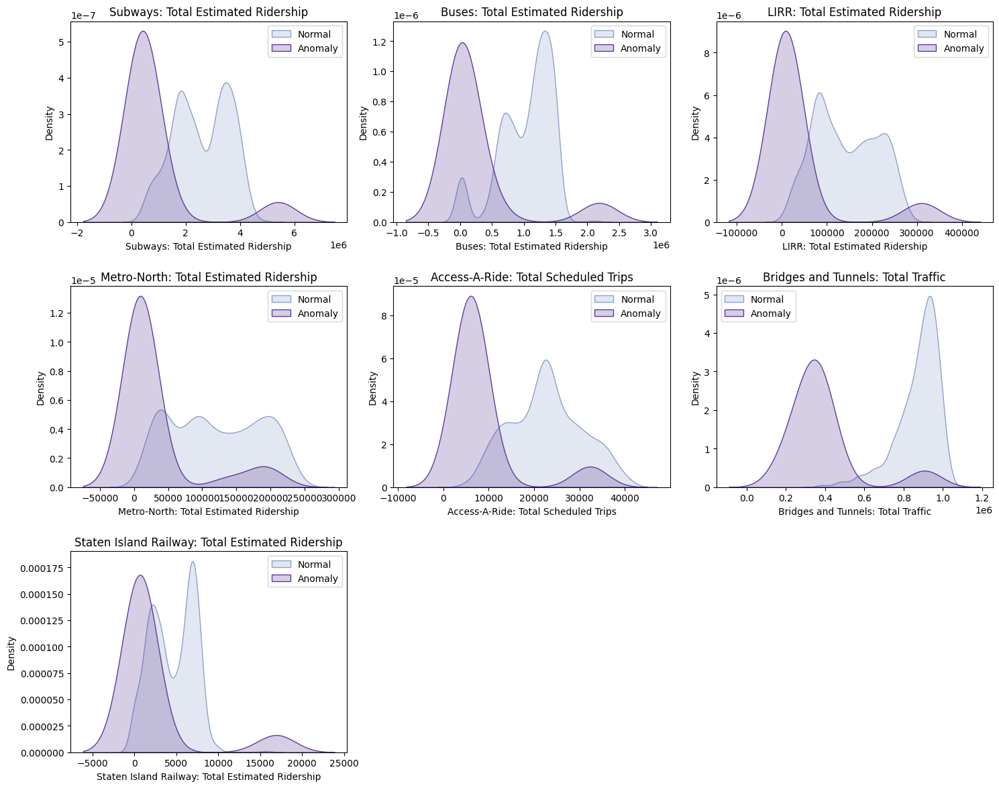

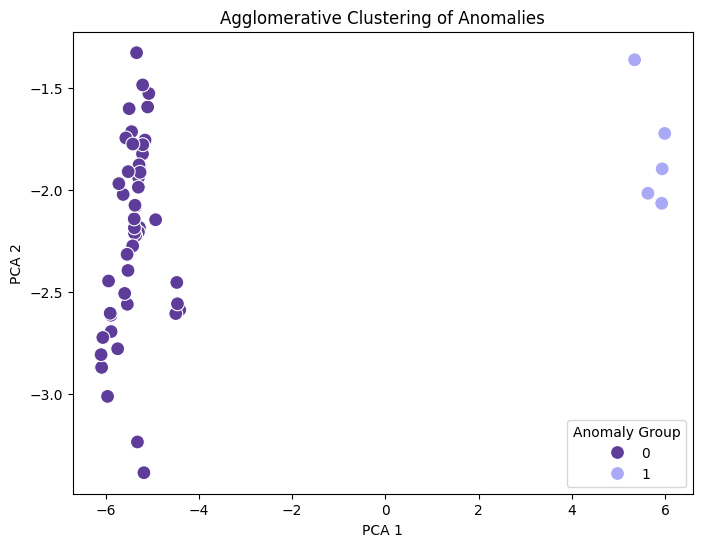

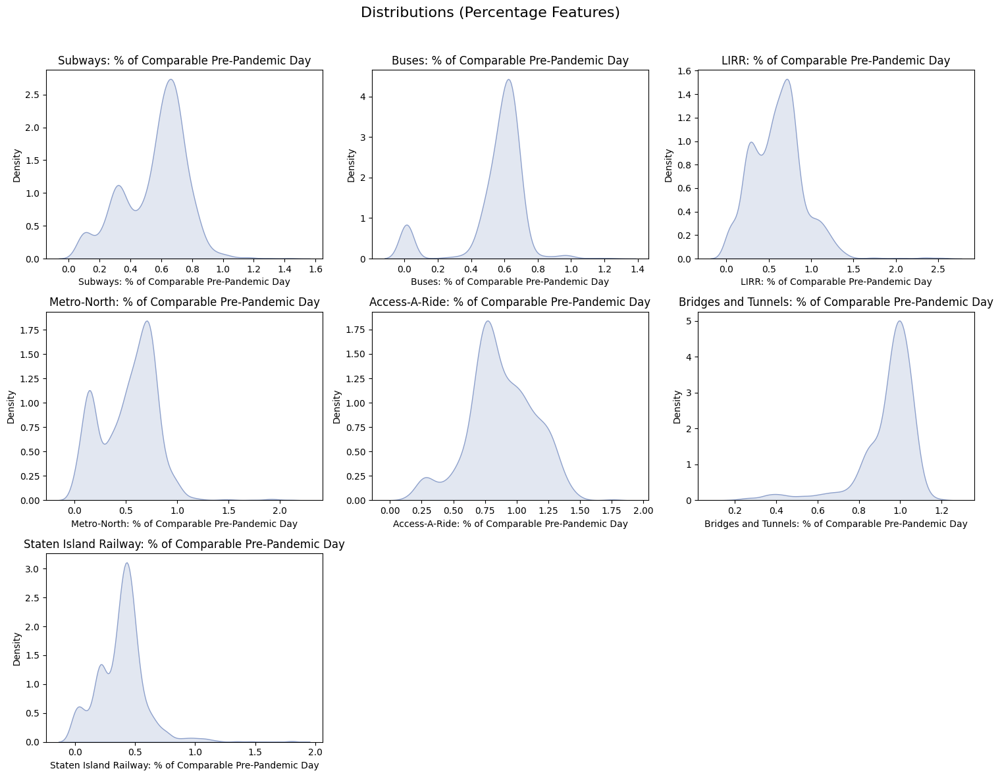

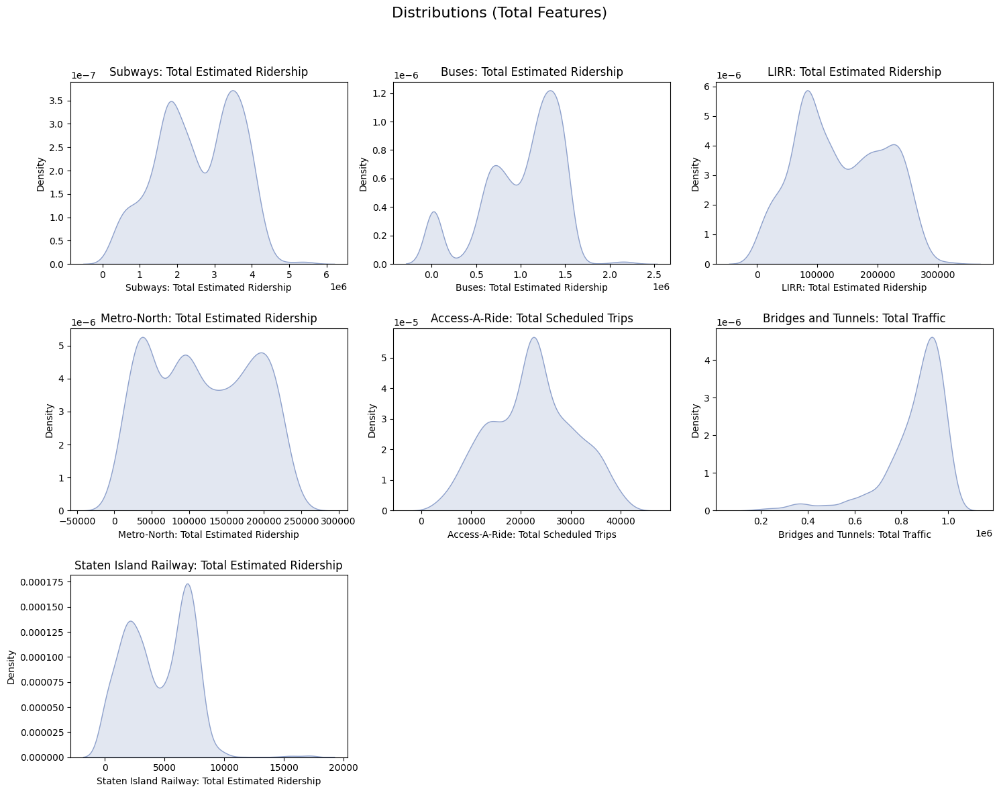

In [11]:
from scipy.spatial.distance import cdist
from matplotlib.lines import Line2D
from matplotlib.backends.backend_pdf import PdfPages


def kmeans_anomaly_detection_with_analysis(data, numerical_columns=None, n_components=2, n_clusters=2, 
                                           threshold_percentile=95, random_state=42, agglo_clusters=2, pdf_path=None):
    """
    K-means anomaly detection with feature ranking, hierarchical clustering, and PCA explanation.
    """
    df = data.copy()

    if numerical_columns is None:
        numerical_columns = df.select_dtypes(include=[np.number]).columns.tolist()

    valid_columns = [col for col in numerical_columns if col in df.columns]
    if not valid_columns:
        raise ValueError("No valid numerical columns found.")

    # Standardize
    X = df[valid_columns].values
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # PCA
    pca = PCA(n_components=n_components, random_state=random_state)
    X_reduced = pca.fit_transform(X_scaled)

    # KMeans
    kmeans = KMeans(n_clusters=n_clusters, random_state=random_state)
    cluster_labels = kmeans.fit_predict(X_reduced)

    # Distances and Anomalies
    distances = np.min(cdist(X_reduced, kmeans.cluster_centers_), axis=1)
    threshold = np.percentile(distances, threshold_percentile)
    anomalies = distances > threshold
    df['is_anomaly'] = anomalies

    # Agglomerative clustering on anomalies
    aglo_labels = np.full(len(df), fill_value=-1)  # default label for non-anomalies
    if anomalies.sum() > 1:
        agglo = AgglomerativeClustering(n_clusters=agglo_clusters)
        aglo_labels[anomalies] = agglo.fit_predict(X_reduced[anomalies])

    df['anomaly_group'] = aglo_labels

    # PCA Component Interpretation
    pca_components_df = pd.DataFrame(pca.components_, columns=valid_columns, index=[f'PC{i+1}' for i in range(n_components)])
    print("\n=== PCA Component Weights ===")
    display(pca_components_df.T)

    # Visualize PCA contributions
    plt.figure(figsize=(10, 5))
    sns.heatmap(pca_components_df.T, annot=True, cmap='Purples', center=0)
    plt.title("PCA Component Contributions by Feature")
    plt.show()

    # Create PDF if path provided
    if pdf_path:
        pdf = PdfPages(pdf_path)
    else:
        pdf = None

    # Clusters & Anomalies Plot
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    scatter = axes[0].scatter(X_reduced[:, 0], X_reduced[:, 1], c=cluster_labels, cmap='Purples', s=50, alpha=0.6, edgecolors='k')
    axes[0].scatter(X_reduced[anomalies, 0], X_reduced[anomalies, 1], s=200, facecolors='none', edgecolors='#5e3c99', linewidths=2)
    axes[0].set_title(f'K-means Clustering & Anomalies (Threshold: {threshold_percentile}th)')
    axes[0].legend(handles=[
        *scatter.legend_elements()[0],
        Line2D([0], [0], marker='o', color='w', label='Anomaly',
               markerfacecolor='none', markeredgecolor='#5e3c99', markersize=10)
    ])
    axes[0].set_xlabel('PCA 1')
    axes[0].set_ylabel('PCA 2')

    # Histogram of distances
    axes[1].hist(distances, bins=30, alpha=0.7, color='#a9a9f5') 
    axes[1].axvline(x=threshold, color='#5e3c99', linestyle='--', label=f'Threshold ({threshold:.3f})')
    axes[1].set_title('Distance to Cluster Center')
    axes[1].set_xlabel('Distance')
    axes[1].set_ylabel('Frequency')
    axes[1].legend()
    plt.tight_layout()
    plt.show()

    # === Summary Stats ===
    print(f"Total points: {len(df)}")
    print(f"Anomalies detected: {anomalies.sum()} ({anomalies.mean() * 100:.2f}%)")
    print(f"Distance threshold: {threshold:.3f}")

    print("\nAnomalies per original cluster:")
    for cluster in range(n_clusters):
        mask = cluster_labels == cluster
        anomaly_count = (anomalies & mask).sum()
        total = mask.sum()
        print(f"  Cluster {cluster}: {anomaly_count}/{total} ({(anomaly_count / total * 100) if total else 0:.2f}%) anomalies")

    # === Feature Ranking ===
    feature_ranking = []
    for col in valid_columns:
        anomaly_mean = df[df['is_anomaly']][col].mean()
        normal_mean = df[~df['is_anomaly']][col].mean()
        diff = anomaly_mean - normal_mean
        std = df[col].std()
        std_diff = diff / std if std else 0
        feature_ranking.append((col, anomaly_mean, normal_mean, diff, std_diff))

    feature_df = pd.DataFrame(feature_ranking, columns=['Feature', 'Anomaly Mean', 'Normal Mean', 'Mean Difference', 'Std. Diff'])
    feature_df = feature_df.sort_values(by='Std. Diff', key=abs, ascending=False)
    print("\n=== Ranked Features (By Std. Difference) ===")
    display(feature_df)

    # KDE Plots of Features
    n_cols = 3
    n_rows = (len(valid_columns) + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))
    axes = axes.flatten()
    
    for i, col in enumerate(valid_columns):
        sns.kdeplot(df[~df['is_anomaly']][col], label='Normal', ax=axes[i], fill=True, color='#8da0cb')
        sns.kdeplot(df[df['is_anomaly']][col], label='Anomaly', ax=axes[i], fill=True, color='#5e3c99')
        axes[i].set_title(col)
        axes[i].legend()
    
    for j in range(len(valid_columns), len(axes)):
        fig.delaxes(axes[j])
    
    plt.tight_layout()
    
    if pdf:
        pdf.savefig(fig)
    plt.show()
    
    # Grouped anomaly plots
    if agglo_clusters > 1 and anomalies.sum() > 0:
        fig_group = plt.figure(figsize=(8, 6))
        palette = ['#5e3c99', '#a9a9f5'] 
        sns.scatterplot(
                x=X_reduced[anomalies][:, 0],
                y=X_reduced[anomalies][:, 1],
                hue=df.loc[anomalies, 'anomaly_group'],
                palette=palette,
                s=100)
        plt.title("Agglomerative Clustering of Anomalies")
        plt.xlabel('PCA 1')
        plt.ylabel('PCA 2')
        plt.legend(title='Anomaly Group')
        
        if pdf:
            pdf.savefig(fig_group)
        plt.show()
    
    if pdf:
        pdf.close()
        
    return {
        'X_reduced': X_reduced,
        'cluster_labels': cluster_labels,
        'distances': distances,
        'anomalies': anomalies,
        'threshold': threshold,
        'feature_ranking': feature_df,
        'pca_components': pca_components_df,
        'agglomerative_labels': aglo_labels
    }
results_pct = kmeans_anomaly_detection_with_analysis(df_pct.drop("Spectral_Cluster",axis='columns'), threshold_percentile=97, pdf_path="pct_normal_vs_anomaly_plots.pdf")
results_totals = kmeans_anomaly_detection_with_analysis(df_totals.drop("Spectral_Cluster",axis='columns'), threshold_percentile=97, pdf_path="totals_normal_vs_anomaly_plots.pdf")


def plot_feature_distributions(df, results=None, title="Feature Distributions", 
                             n_cols=3, figsize=(15, 4), pdf_output=None):
    """
    Plot KDEs for each feature using ALL data (both normal and anomalous).
    
    Parameters:
    - df: Original DataFrame.
    - results: Optional dictionary (unused here, kept for backward compatibility).
    - title: Title for the figure.
    - n_cols: Number of columns in the subplot grid.
    - figsize: Figure size per row (width, height).
    - pdf_output: Path to save the plot as PDF (optional).
    """
    # Use all columns if 'results' is not provided, otherwise use ranked features
    if results is not None:
        valid_columns = results['feature_ranking']['Feature'].tolist()
    else:
        valid_columns = df.columns.tolist()
    
    n_rows = (len(valid_columns) + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(figsize[0], figsize[1] * n_rows))
    axes = axes.flatten()

    for i, col in enumerate(valid_columns):
        sns.kdeplot(df[col], fill=True, ax=axes[i], color='#8da0cb')  # Plot ALL data
        axes[i].set_title(col)
        axes[i].set_ylabel('Density')
        axes[i].set_xlabel(col)

    # Remove empty subplots
    for j in range(len(valid_columns), len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    
    if pdf_output:
        plt.savefig(pdf_output, format='pdf', bbox_inches='tight')
    plt.show()

plot_feature_distributions(df_pct.drop("Spectral_Cluster",axis='columns'), title="Distributions (Percentage Features)", pdf_output = "pct_distribution.pdf" )
plot_feature_distributions(df_totals.drop("Spectral_Cluster",axis='columns'), title="Distributions (Total Features)", pdf_output = "totals_distribution.pdf")

=== Data Breakdown ===
       Count
Group       
-1      1722
 1        36
 0        18 

=== Mean Feature Values (Grouped by Anomaly Group + Normal) ===


anomaly_group,-1,0,1
Bridges and Tunnels: % of Comparable Pre-Pandemic Day,0.9484,1.0617,0.3456
Access-A-Ride: % of Comparable Pre-Pandemic Day,0.8892,1.1678,0.2372
Buses: % of Comparable Pre-Pandemic Day,0.5587,0.9500,0.0144
Subways: % of Comparable Pre-Pandemic Day,0.5684,1.0561,0.0867
Staten Island Railway: % of Comparable Pre-Pandemic Day,0.3854,1.2733,0.0644
Metro-North: % of Comparable Pre-Pandemic Day,0.5259,1.4172,0.0658
LIRR: % of Comparable Pre-Pandemic Day,0.6074,1.7583,0.0319



=== Difference from Normal Behavior ===


anomaly_group,0,1
Bridges and Tunnels: % of Comparable Pre-Pandemic Day,0.1133,-0.6028
Access-A-Ride: % of Comparable Pre-Pandemic Day,0.2786,-0.6520
Buses: % of Comparable Pre-Pandemic Day,0.3913,-0.5443
Subways: % of Comparable Pre-Pandemic Day,0.4877,-0.4817
Staten Island Railway: % of Comparable Pre-Pandemic Day,0.8879,-0.3210
Metro-North: % of Comparable Pre-Pandemic Day,0.8913,-0.4601
LIRR: % of Comparable Pre-Pandemic Day,1.1509,-0.5755


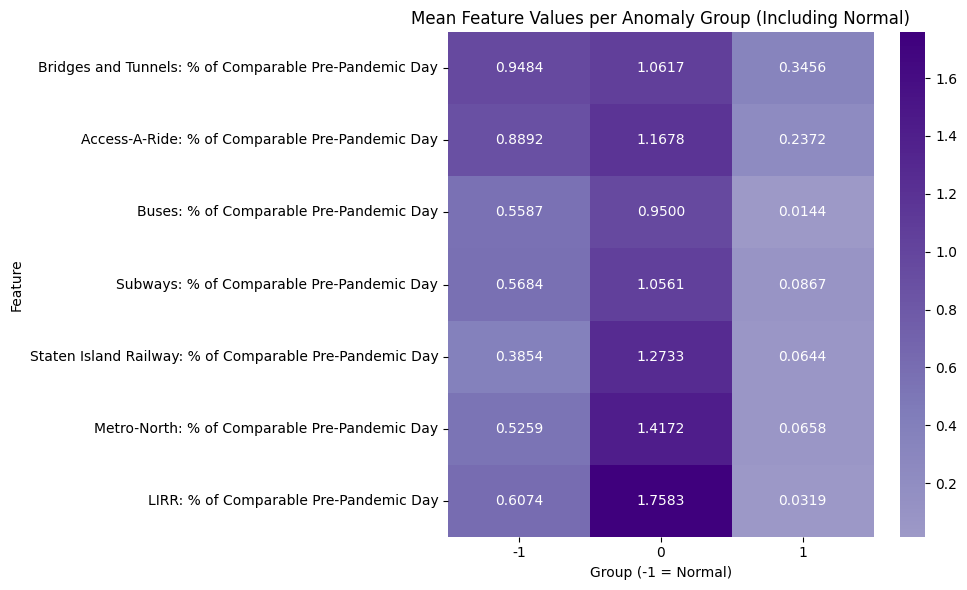

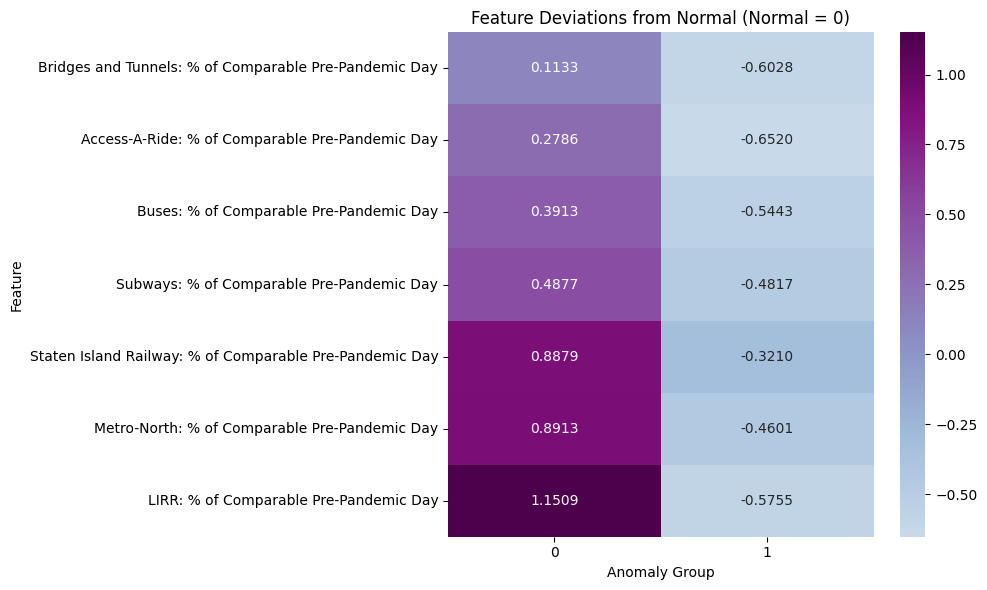


=== Feature Distribution per Group (with Normal) ===


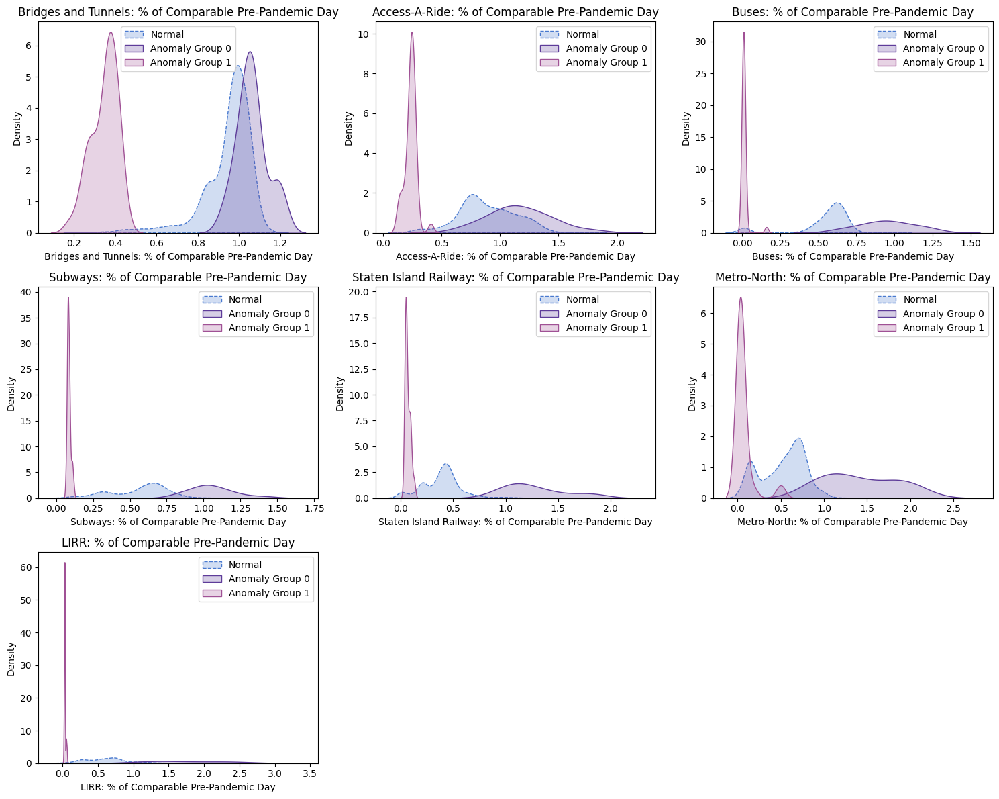

=== Data Breakdown ===
       Count
Group       
-1      1722
 0        49
 1         5 

=== Mean Feature Values (Grouped by Anomaly Group + Normal) ===


anomaly_group,-1,0,1
Bridges and Tunnels: Total Traffic,872057.1516,332114.4490,907411.6000
Buses: Total Estimated Ridership,1035177.6702,56340.0204,2185219.4000
Access-A-Ride: Total Scheduled Trips,22783.5424,6078.3469,32316.2000
Subways: Total Estimated Ridership,2593600.4768,430914.3265,5399145.4000
LIRR: Total Estimated Ridership,141986.1533,8773.7551,309945.2000
Metro-North: Total Estimated Ridership,120225.3891,14860.8776,192696.0000
Staten Island Railway: Total Estimated Ridership,4564.6208,678.2041,16843.4000



=== Difference from Normal Behavior ===


anomaly_group,0,1
Bridges and Tunnels: Total Traffic,-539942.7026,35354.4484
Buses: Total Estimated Ridership,-978837.6498,1150041.7298
Access-A-Ride: Total Scheduled Trips,-16705.1955,9532.6576
Subways: Total Estimated Ridership,-2162686.1503,2805544.9232
LIRR: Total Estimated Ridership,-133212.3982,167959.0467
Metro-North: Total Estimated Ridership,-105364.5115,72470.6109
Staten Island Railway: Total Estimated Ridership,-3886.4167,12278.7792


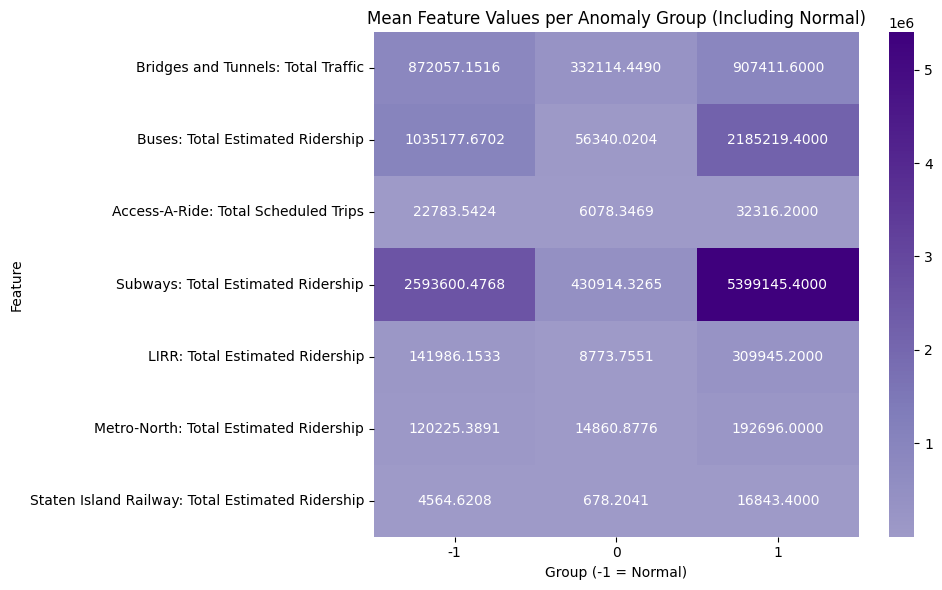

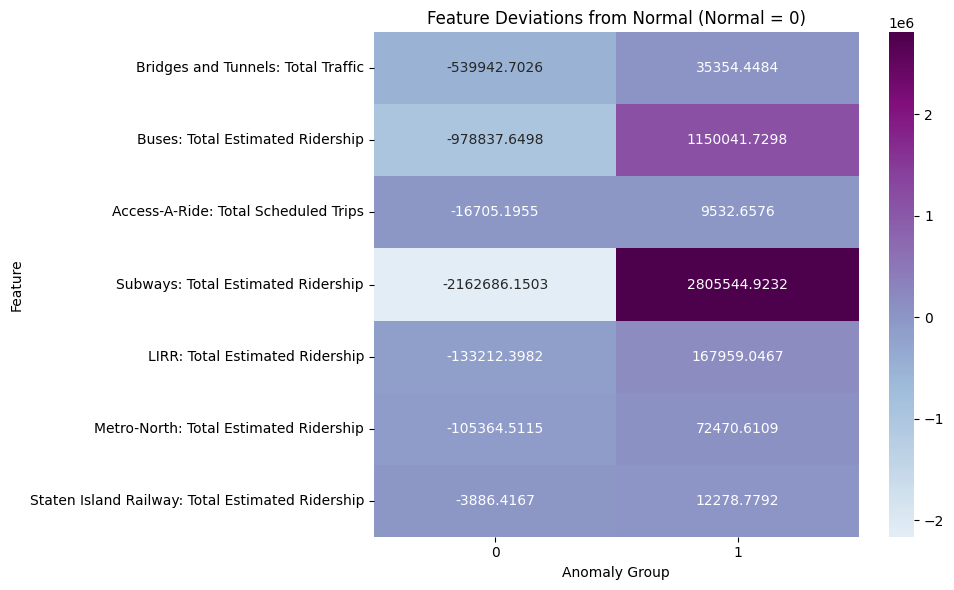


=== Feature Distribution per Group (with Normal) ===


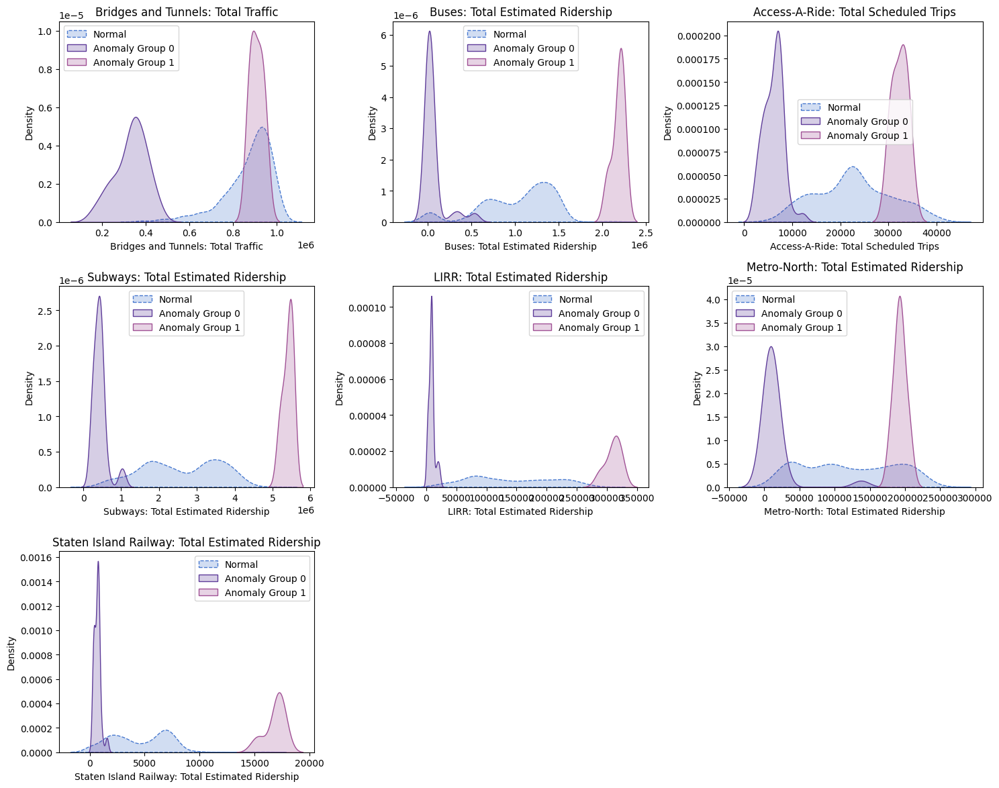

In [12]:
def analyze_anomaly_clusters_with_normals(results, data, pdf_path=None):
    """
    Analyze anomaly clusters identified by Agglomerative Clustering,
    including comparison to normal (non-anomalous) behavior.
    Parameters:
    -----------
    results : dict
        Output dictionary from kmeans_anomaly_detection_with_analysis function.
    data : pandas.DataFrame
        Original input DataFrame before PCA or clustering.
    pdf_path : str, optional
        Path to save plots as PDF. If None, plots are only displayed.
    """
    import pandas as pd
    import matplotlib.pyplot as plt
    import seaborn as sns
    import numpy as np
    from matplotlib.backends.backend_pdf import PdfPages

    # === Custom Colors ===
    normal_color = '#4879cf'  # Light blue
    purple_palette = ['#5e3c99', '#a05195', '#9e9ac8', '#dadaeb', '#c2a5cf']

    # Initialize PDF if path is provided
    if pdf_path:
        pdf = PdfPages(pdf_path)
    else:
        pdf = None

    pd.set_option('display.float_format', lambda x: f'{x:.4f}')

    # Prepare dataframe with anomaly info
    df_all = data.copy()
    df_all['is_anomaly'] = results['anomalies']
    df_all['anomaly_group'] = results['agglomerative_labels']
    df_all['anomaly_group'] = df_all['anomaly_group'].where(df_all['is_anomaly'], -1)
    anomalies_df = df_all[df_all['is_anomaly']]
    normal_df = df_all[~df_all['is_anomaly']]

    print("=== Data Breakdown ===")
    print(df_all['anomaly_group'].value_counts().rename_axis("Group").to_frame("Count"), "\n")

    # Ranked features
    numerical_columns = results['feature_ranking']['Feature'].tolist()

    # Mean comparison: group-wise + normal
    group_summary = df_all.groupby('anomaly_group')[numerical_columns].mean().T.round(4)
    group_diff = group_summary.sub(group_summary[-1], axis=0).drop(columns=-1).round(4)

    print("=== Mean Feature Values (Grouped by Anomaly Group + Normal) ===")
    display(group_summary)

    print("\n=== Difference from Normal Behavior ===")
    display(group_diff)

    # Heatmap of means
    fig1 = plt.figure(figsize=(10, 6))
    sns.heatmap(group_summary, annot=True, cmap='Purples', center=0, fmt=".4f")
    plt.title("Mean Feature Values per Anomaly Group (Including Normal)")
    plt.ylabel("Feature")
    plt.xlabel("Group (-1 = Normal)")
    plt.tight_layout()
    if pdf:
        pdf.savefig(fig1)
    plt.show()

    # Heatmap of differences
    fig2 = plt.figure(figsize=(10, 6))
    sns.heatmap(group_diff, annot=True, cmap='BuPu', center=0, fmt=".4f")
    plt.title("Feature Deviations from Normal (Normal = 0)")
    plt.ylabel("Feature")
    plt.xlabel("Anomaly Group")
    plt.tight_layout()
    if pdf:
        pdf.savefig(fig2)
    plt.show()

    # KDE plots comparing groups with normal
    print("\n=== Feature Distribution per Group (with Normal) ===")
    n_cols = 3
    n_rows = (len(numerical_columns) + n_cols - 1) // n_cols
    fig3, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))
    axes = axes.flatten()

    unique_groups = sorted(anomalies_df['anomaly_group'].unique())
    palette = {group: purple_palette[i % len(purple_palette)] for i, group in enumerate(unique_groups)}

    for i, col in enumerate(numerical_columns):
        sns.kdeplot(normal_df[col], label='Normal', ax=axes[i], color=normal_color, linestyle='--', fill=True)
        for group in unique_groups:
            sns.kdeplot(anomalies_df[anomalies_df['anomaly_group'] == group][col],
                        label=f'Anomaly Group {group}',
                        ax=axes[i],
                        color=palette[group],
                        fill=True)
        axes[i].set_title(col)
        axes[i].legend()

    for j in range(len(numerical_columns), len(axes)):
        fig3.delaxes(axes[j])

    plt.tight_layout()
    if pdf:
        pdf.savefig(fig3)
    plt.show()

    if pdf:
        pdf.close()
        
# Example usage:
analyze_anomaly_clusters_with_normals(
    results_pct, 
    data=df_pct.drop("Spectral_Cluster", axis='columns'),
    pdf_path="pct_anomaly_clusters_analysis.pdf"
)

analyze_anomaly_clusters_with_normals(
    results_totals, 
    data=df_totals.drop("Spectral_Cluster", axis='columns'),
    pdf_path="totals_anomaly_clusters_analysis.pdf"
)

run_grid_search(df_totals.drop("Spectral_Cluster",axis='columns'))


X_reduced_totals, labels_totals, kmeans_totals, metrics_totals = plot_kmeans_clusters(df_totals, n_components=2, n_clusters=2)
analyze_clusters(df_totals.drop("Spectral_Cluster",axis='columns'), labels)

results_totals = kmeans_anomaly_detection_with_analysis(df_totals.drop("Spectral_Cluster",axis='columns'), threshold_percentile=99)

analyze_anomaly_clusters_with_normals(results_totals, data=df_totals.drop("Spectral_Cluster",axis='columns'))

C:\Users\Amit L\PycharmProjects\Analysis\.venv\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cset = contour_func(
C:\Users\Amit L\PycharmProjects\Analysis\.venv\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cset = contour_func(


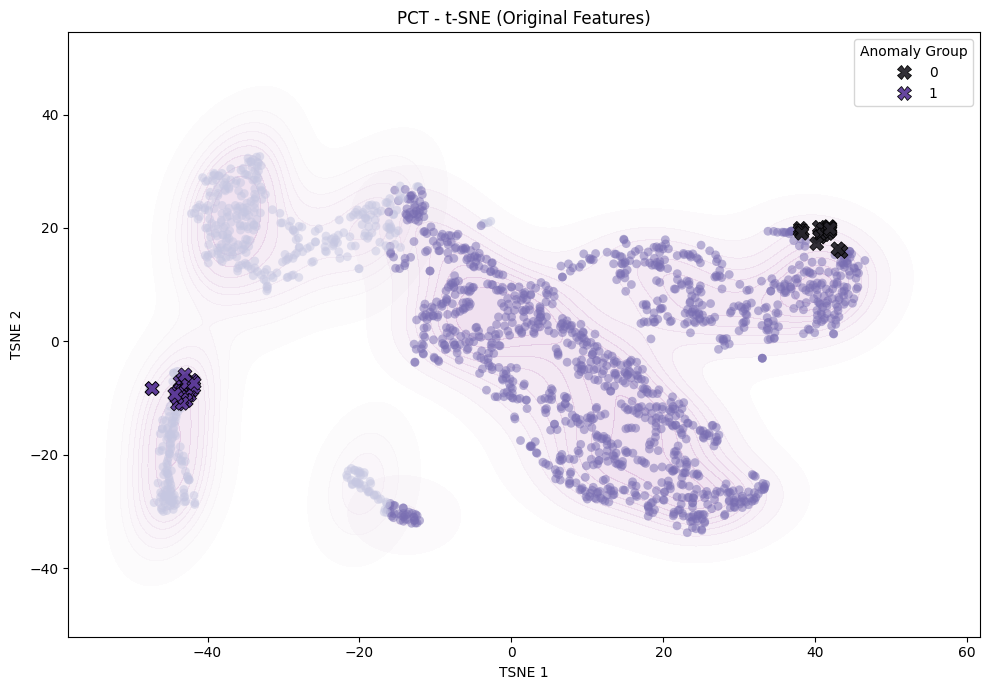

C:\Users\Amit L\PycharmProjects\Analysis\.venv\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cset = contour_func(
C:\Users\Amit L\PycharmProjects\Analysis\.venv\Lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cset = contour_func(


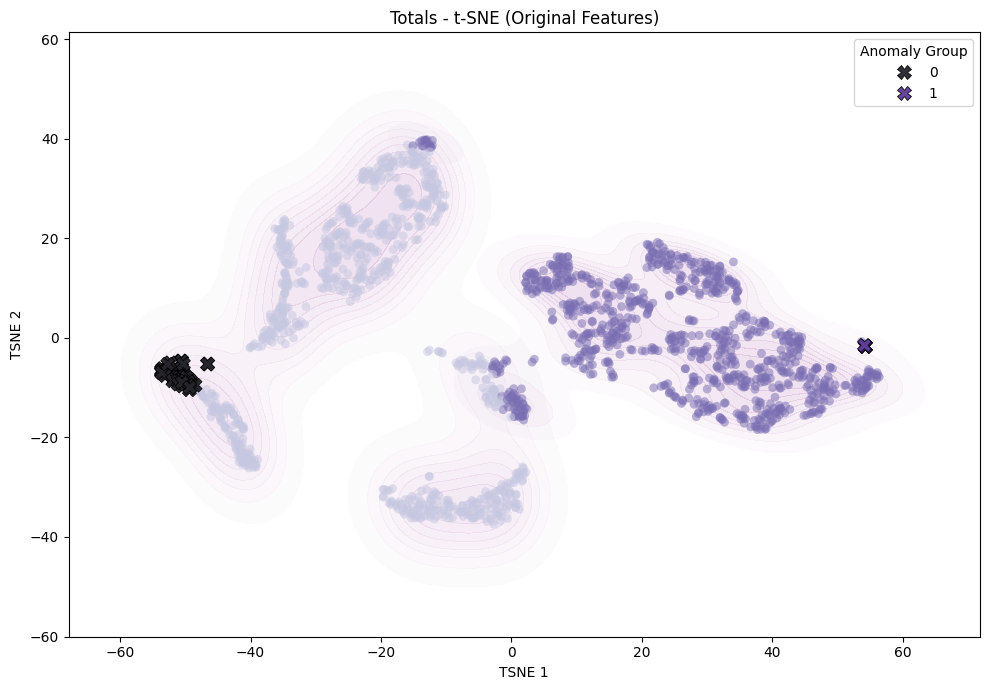

In [13]:
from matplotlib.backends.backend_pdf import PdfPages

def plot_tsne_with_clusters_and_anomalies(data, results, numerical_columns=None, perplexity=40, random_state=42,
                                          figsize=(10, 7), title="t-SNE on Original Data with Clusters & Anomalies",
                                          pdf_path=None):
    """
    Plot t-SNE with cluster boundaries and anomalies overlaid. Optionally save to PDF.
    """
    df = data.copy()

    if numerical_columns is None:
        numerical_columns = df.select_dtypes(include=[np.number]).columns.tolist()

    # Standardize original data
    X = df[numerical_columns].values
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Run t-SNE on standardized original data
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=random_state)
    X_tsne = tsne.fit_transform(X_scaled)

    # Combine with results
    anomalies = results['anomalies']
    groups = results['agglomerative_labels']
    clusters = results['cluster_labels']

    tsne_df = pd.DataFrame(X_tsne, columns=["TSNE 1", "TSNE 2"])
    tsne_df["Anomaly"] = anomalies
    tsne_df["Anomaly Group"] = groups
    tsne_df["Cluster"] = clusters

    # Plotting
    fig = plt.figure(figsize=figsize)

    # Plot background cluster areas using KDE
    for clust in np.unique(clusters):
        sns.kdeplot(
            data=tsne_df[tsne_df["Cluster"] == clust],
            x="TSNE 1", y="TSNE 2",
            fill=True, alpha=0.12, linewidth=0,
            cmap=sns.light_palette("purple", as_cmap=True)
        )

    # Plot normal points
    sns.scatterplot(
        data=tsne_df[~tsne_df["Anomaly"]],
        x="TSNE 1", y="TSNE 2",
        hue="Cluster",
        palette="Purples",
        style=None,
        s=40,
        alpha=0.5,
        edgecolor='none',
        legend=False
    )

    # Plot anomaly points overlaid
    palette_anom = sns.color_palette("dark:#5e3c99", n_colors=len(set(groups)) - (1 if -1 in groups else 0))
    sns.scatterplot(
        data=tsne_df[tsne_df["Anomaly"]],
        x="TSNE 1", y="TSNE 2",
        hue="Anomaly Group",
        palette=palette_anom,
        s=100,
        edgecolor='black',
        linewidth=0.6,
        alpha=0.95,
        marker='X',
        legend=True
    )

    plt.title(title)
    plt.legend(title="Anomaly Group", loc="best")
    plt.tight_layout()

    # Save to PDF if path provided
    if pdf_path:
        with PdfPages(pdf_path) as pdf:
            pdf.savefig(fig)
        print(f"t-SNE plot saved to: {pdf_path}")

    plt.show()

plot_tsne_with_clusters_and_anomalies(df_pct.drop("Spectral_Cluster", axis=1), results_pct, title="PCT - t-SNE (Original Features)")
plot_tsne_with_clusters_and_anomalies(df_totals.drop("Spectral_Cluster", axis=1), results_totals, title="Totals - t-SNE (Original Features)")


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import ruptures as rpt
import matplotlib.dates as mdates
import seaborn as sns

def detect_changepoints(df, date_col, value_cols, n_bkps=3, model="l2"):
    """
    Perform changepoint detection on specified columns with a fixed number of breakpoints.
    
    Parameters:
    df (pd.DataFrame): DataFrame containing the data
    date_col (str): Name of the date column
    value_cols (list): List of column names to analyze
    n_bkps (int): Number of breakpoints to detect
    model (str): Cost model for ruptures (l1, l2, rbf, etc.)
    
    Returns:
    dict: Dictionary mapping column names to lists of changepoints (indices)
    """
    results = {}
    
    for col in value_cols:
        print(f"Processing column: {col}")
        # Extract the series and handle missing values
        series = df[col].fillna(method='ffill').values
        
        # Use Dynp algorithm which allows explicit control of number of changepoints
        algo = rpt.Dynp(model=model, min_size=10).fit(series)
        changepoints = algo.predict(n_bkps=n_bkps)
        
        # Make sure the result doesn't include the last index (which is just the length)
        if changepoints and changepoints[-1] == len(series):
            changepoints = changepoints[:-1]
            
        # Make sure we have valid changepoints before proceeding
        if not changepoints:
            print(f"No valid changepoints found for {col}")
            results[col] = {'indices': [], 'dates': [], 'values': []}
            continue
            
        # Convert indices to dates
        changepoint_dates = df[date_col].iloc[changepoints].tolist()
        
        results[col] = {
            'indices': changepoints,
            'dates': changepoint_dates,
            'values': [df[col].iloc[idx] for idx in changepoints]
        }
        
        print(f"Found {len(changepoints)} changepoints for {col}")
        
    return results

def visualize_changepoints_fixed(df, date_col, columns, changepoints_dict, title, cmap='Purples'):
    """
    Improved visualization function with robust error handling.
    """
    # Check if we have data before plotting
    has_data = False
    for col in columns:
        if len(df[col].dropna()) > 0:
            has_data = True
            break
    
    if not has_data:
        print(f"No data available for plotting in {title}")
        return None
        
    # Get colormap with enough colors
    max_colors = max(3, len(columns))
    colors = sns.color_palette(cmap, max_colors)
    
    plt.figure(figsize=(15, 8))
    
    # Ensure dates are in the correct format and range
    print(f"Date range: {df[date_col].min()} to {df[date_col].max()}")
    
    if df[date_col].min().year < 2000:
        print("WARNING: Dates appear to be incorrect (before 2000)")
        print(f"First few date values: {df[date_col].head().tolist()}")
        
        # If dates are strings, try to parse them
        if isinstance(df[date_col].iloc[0], str):
            print("Converting string dates to datetime...")
            df[date_col] = pd.to_datetime(df[date_col], format='%m/%d/%Y')
    
    # Plot each column
    for i, col in enumerate(columns):
        if i >= len(colors):
            color_idx = i % len(colors)
        else:
            color_idx = i
            
        if len(df[col].dropna()) > 0:
            plt.plot(df[date_col], df[col], color=colors[color_idx], label=col, linewidth=2)
            
            # Add vertical lines for changepoints if they exist
            if col in changepoints_dict and changepoints_dict[col]['indices']:
                for cp_idx in changepoints_dict[col]['indices']:
                    if 0 <= cp_idx < len(df):  # Ensure index is valid
                        date_val = df[date_col].iloc[cp_idx]
                        plt.axvline(x=date_val, color=colors[color_idx], 
                                   linestyle='--', alpha=0.7)
                        # Add annotation with date
                        plt.annotate(date_val.strftime('%Y-%m-%d'), 
                                    xy=(date_val, df[col].iloc[cp_idx]),
                                    xytext=(10, 0), textcoords='offset points',
                                    rotation=45, ha='left', va='bottom',
                                    color=colors[color_idx])
    
    # Format the plot
    plt.title(title, fontsize=16)
    plt.xlabel('Date', fontsize=12)
    plt.ylabel('Value', fontsize=12)
    plt.legend(loc='best')
    
    # Format x-axis to show dates properly
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    return plt

def compare_changepoints_fixed(df1, df2, date_col, col1, col2, cp_dict1, cp_dict2, title, cmap='Purples'):
    """
    Compare changepoints between two different metrics with better error handling.
    """
    # Check if columns exist
    if col1 not in df1.columns:
        print(f"Error: Column '{col1}' not found in first dataframe")
        return None
    if col2 not in df2.columns:
        print(f"Error: Column '{col2}' not found in second dataframe")
        return None
        
    # Get colors from palette
    colors = sns.color_palette(cmap, 4)
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10), sharex=True)
    
    # First subplot - first metric
    ax1.plot(df1[date_col], df1[col1], color=colors[0], label=col1)
    
    if col1 in cp_dict1 and cp_dict1[col1]['indices']:
        for cp_idx in cp_dict1[col1]['indices']:
            if 0 <= cp_idx < len(df1):
                date_val = df1[date_col].iloc[cp_idx]
                ax1.axvline(x=date_val, color=colors[0], linestyle='--', alpha=0.7)
                # Add annotation
                ax1.annotate(date_val.strftime('%Y-%m-%d'), 
                          xy=(date_val, df1[col1].iloc[cp_idx]),
                          xytext=(10, 0), textcoords='offset points',
                          rotation=45, ha='left', color=colors[0])
                
    ax1.set_title(f"{col1}", fontsize=14)
    ax1.legend(loc='best')
    
    # Second subplot - second metric
    ax2.plot(df2[date_col], df2[col2], color=colors[2], label=col2)
    
    if col2 in cp_dict2 and cp_dict2[col2]['indices']:
        for cp_idx in cp_dict2[col2]['indices']:
            if 0 <= cp_idx < len(df2):
                date_val = df2[date_col].iloc[cp_idx]
                ax2.axvline(x=date_val, color=colors[2], linestyle='--', alpha=0.7)
                # Add annotation
                ax2.annotate(date_val.strftime('%Y-%m-%d'), 
                          xy=(date_val, df2[col2].iloc[cp_idx]),
                          xytext=(10, 0), textcoords='offset points',
                          rotation=45, ha='left', color=colors[2])
                
    ax2.set_title(f"{col2}", fontsize=14)
    ax2.legend(loc='best')
    
    # Format x-axis
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    ax2.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
    plt.xticks(rotation=45)
    
    # Main title
    fig.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust to make room for suptitle
    
    return plt

def summarize_changepoints(df, date_col, changepoints_dict):
    """
    Print a summary of detected changepoints with dates and values.
    """
    for col, cp_info in changepoints_dict.items():
        if not cp_info['indices']:
            print(f"\nNo changepoints detected for {col}")
            continue
            
        print(f"\nChangepoints for {col}:")
        print("-" * 60)
        
        for i, (idx, date, value) in enumerate(zip(cp_info['indices'], 
                                                  cp_info['dates'], 
                                                  cp_info['values'])):
            # Calculate percent change
            if i == 0:
                start_idx = 0
            else:
                start_idx = cp_info['indices'][i-1]
                
            end_idx = idx
            next_idx = cp_info['indices'][i+1] if i+1 < len(cp_info['indices']) else len(df)
            
            segment_before = df[col].iloc[start_idx:end_idx].mean()
            segment_after = df[col].iloc[end_idx:next_idx].mean()
            
            pct_change = ((segment_after - segment_before) / segment_before) * 100
            
            print(f"Changepoint {i+1}: {date.strftime('%Y-%m-%d')}")
            print(f"  Value: {value:.2f}")
            print(f"  Avg before: {segment_before:.2f}, Avg after: {segment_after:.2f}")
            print(f"  Percent change: {pct_change:.2f}%")

def run_sequential_analysis(X_with_dates, date_col, n_bkps=3):
    """
    Run a complete sequential analysis of both total and percentage data.
    """
    print("\n" + "="*80)
    print("STARTING SEQUENTIAL ANALYSIS")
    print("="*80)
    
    # Ensure dates are in datetime format
    if not pd.api.types.is_datetime64_any_dtype(X_with_dates[date_col]):
        print(f"Converting dates from {type(X_with_dates[date_col].iloc[0])} to datetime")
        X_with_dates[date_col] = pd.to_datetime(X_with_dates[date_col])
    
    # 1. Split the data
    print("\nStep 1: Splitting data into totals and percentages")
    
    # Identify total columns and percentage columns based on naming patterns
    total_cols = [col for col in X_with_dates.columns if ('total' in col.lower() or 
                                                         'ridership' in col.lower()) and 
                                                         'percent' not in col.lower()]
    pct_cols = [col for col in X_with_dates.columns if 'percent' in col.lower() or 'pct' in col.lower()]
    
    # If no percentage columns are found, they might have a different naming convention
    if not pct_cols:
        print("No columns with 'percent' in name found. Using remaining numeric columns.")
        numeric_cols = X_with_dates.select_dtypes(include=[np.number]).columns.tolist()
        pct_cols = [col for col in numeric_cols if col not in total_cols and col != date_col]
    
    # Create the two dataframes
    totals_with_dates = X_with_dates[[date_col] + total_cols].copy()
    pct_with_dates = X_with_dates[[date_col] + pct_cols].copy()
    
    print(f"Totals dataframe: {totals_with_dates.shape[0]} rows, {totals_with_dates.shape[1]} columns")
    print(f"Percentage dataframe: {pct_with_dates.shape[0]} rows, {pct_with_dates.shape[1]} columns")
    
    # ===========================================================================
    # ANALYSIS OF TOTAL RIDERSHIP
    # ===========================================================================
    print("\n" + "="*80)
    print("ANALYSIS OF TOTAL RIDERSHIP")
    print("="*80)
    
    print("\nStep 2: Selecting columns for total ridership analysis")
    total_cols_to_analyze = [col for col in totals_with_dates.columns if col != date_col]
    print(f"Columns to analyze: {total_cols_to_analyze}")
    
    print("\nStep 3: Running changepoint detection on total ridership")
    total_changepoints = detect_changepoints(totals_with_dates, date_col, total_cols_to_analyze, n_bkps=n_bkps)
    
    print("\nStep 4: Visualizing total ridership changepoints")
    # Limit to first 3 columns for clearer visualization
    cols_to_visualize = total_cols_to_analyze[:3] if len(total_cols_to_analyze) > 3 else total_cols_to_analyze
    visualize_changepoints_fixed(totals_with_dates, date_col, cols_to_visualize, 
                               total_changepoints, "Changepoints in Total Ridership", cmap='Purples')
    plt.show()
    
    print("\nStep 5: Summarizing total ridership changepoints")
    summarize_changepoints(totals_with_dates, date_col, total_changepoints)
    
    # ===========================================================================
    # ANALYSIS OF PERCENTAGE RIDERSHIP
    # ===========================================================================
    print("\n" + "="*80)
    print("ANALYSIS OF PERCENTAGE RIDERSHIP")
    print("="*80)
    
    print("\nStep 6: Selecting columns for percentage ridership analysis")
    pct_cols_to_analyze = [col for col in pct_with_dates.columns if col != date_col]
    print(f"Columns to analyze: {pct_cols_to_analyze}")
    
    print("\nStep 7: Running changepoint detection on percentage ridership")
    pct_changepoints = detect_changepoints(pct_with_dates, date_col, pct_cols_to_analyze, n_bkps=n_bkps)
    
    print("\nStep 8: Visualizing percentage ridership changepoints")
    # Limit to first 3 columns for clearer visualization
    cols_to_visualize = pct_cols_to_analyze[:3] if len(pct_cols_to_analyze) > 3 else pct_cols_to_analyze
    visualize_changepoints_fixed(pct_with_dates, date_col, cols_to_visualize, 
                               pct_changepoints, "Changepoints in Percent of Pre-COVID Ridership", cmap='Purples')
    plt.show()
    
    print("\nStep 9: Summarizing percentage ridership changepoints")
    summarize_changepoints(pct_with_dates, date_col, pct_changepoints)
    
    # ===========================================================================
    # COMPARISON BETWEEN DATASETS
    # ===========================================================================
    print("\n" + "="*80)
    print("COMPARISON BETWEEN DATASETS")
    print("="*80)
    
    print("\nStep 10: Finding matching columns for comparison")
    # Try to find matching columns for comparison
    comparison_pairs = []
    
    # First try to match using common transit terms
    transit_terms = ['subway', 'bus', 'lirr', 'rail', 'metro', 'transit', 'bridge', 'tunnel']
    
    for term in transit_terms:
        total_matches = [col for col in total_cols_to_analyze if term in col.lower()]
        pct_matches = [col for col in pct_cols_to_analyze if term in col.lower()]
        
        if total_matches and pct_matches:
            comparison_pairs.append((total_matches[0], pct_matches[0], term.title()))
    
    # If no matches found, use the first column from each
    if not comparison_pairs and total_cols_to_analyze and pct_cols_to_analyze:
        comparison_pairs.append((total_cols_to_analyze[0], pct_cols_to_analyze[0], "First Available"))
    
    # Perform comparisons
    print("\nStep 11: Comparing changepoints between total and percentage datasets")
    for total_col, pct_col, label in comparison_pairs:
        print(f"\nComparing {total_col} vs {pct_col}")
        compare_changepoints_fixed(totals_with_dates, pct_with_dates, 
                                 date_col, total_col, pct_col,
                                 total_changepoints, pct_changepoints,
                                 f"Comparison: {label} - Total vs Percentage", cmap='Purples')
        plt.show()
    
    print("\nAnalysis complete!")
    return {
        'totals_df': totals_with_dates,
        'pct_df': pct_with_dates,
        'total_changepoints': total_changepoints,
        'pct_changepoints': pct_changepoints
    }

# Example usage:
change_results = run_sequential_analysis(X_with_dates, 'Date', n_bkps=4)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import ruptures as rpt
import matplotlib.dates as mdates
import seaborn as sns
from sklearn.preprocessing import StandardScaler

def multivariate_changepoint_detection(df, date_col, feature_cols, n_bkps=3, model="l2"):
    """
    Perform multivariate changepoint detection on multiple columns together.
    
    Parameters:
    df (pd.DataFrame): DataFrame containing the data
    date_col (str): Name of the date column
    feature_cols (list): List of column names to analyze together
    n_bkps (int): Number of breakpoints to detect
    model (str): Cost model for ruptures (l1, l2, rbf, etc.)
    
    Returns:
    dict: Dictionary containing changepoint information
    """
    print(f"Running multivariate changepoint detection on {len(feature_cols)} features")
    
    # Check that we have at least one feature
    if not feature_cols:
        print("Error: No features provided for multivariate analysis")
        return {'indices': [], 'dates': [], 'values': {}}
    
    # Extract features and handle missing values
    X = df[feature_cols].copy()
    
    # Fill missing values
    X = X.fillna(method='ffill').fillna(method='bfill')
    
    # Standardize the features so they have equal weight
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Apply changepoint detection to multivariate data
    print("Applying changepoint detection algorithm...")
    algo = rpt.Dynp(model=model, min_size=10).fit(X_scaled)
    changepoints = algo.predict(n_bkps=n_bkps)
    
    # Remove the last index if it's just the length of the series
    if changepoints and changepoints[-1] == len(X_scaled):
        changepoints = changepoints[:-1]
    
    # Make sure we have valid changepoints
    if not changepoints:
        print("No valid changepoints found in multivariate analysis")
        return {'indices': [], 'dates': [], 'values': {}}
    
    # Convert indices to dates
    changepoint_dates = df[date_col].iloc[changepoints].tolist()
    
    # Create a dictionary of values at changepoints for each feature
    values_dict = {}
    for col in feature_cols:
        values_dict[col] = [df[col].iloc[idx] for idx in changepoints]
    
    result = {
        'indices': changepoints,
        'dates': changepoint_dates,
        'values': values_dict
    }
    
    print(f"Found {len(changepoints)} multivariate changepoints")
    return result

def visualize_multivariate_changepoints(df, date_col, feature_cols, changepoints, title, cmap='Purples', max_features=5):
    """
    Visualize multivariate changepoints across multiple features.
    """
    # Limit the number of features to display if there are too many
    if len(feature_cols) > max_features:
        print(f"Limiting visualization to first {max_features} features (out of {len(feature_cols)})")
        feature_cols = feature_cols[:max_features]
    
    # Get colormap with enough colors
    colors = sns.color_palette(cmap, len(feature_cols))
    
    # Create plot with subplots for each feature
    fig, axes = plt.subplots(len(feature_cols), 1, figsize=(15, 3*len(feature_cols)), sharex=True)
    
    # Handle case of single feature
    if len(feature_cols) == 1:
        axes = [axes]
    
    # Plot each feature in its own subplot
    for i, col in enumerate(feature_cols):
        ax = axes[i]
        ax.plot(df[date_col], df[col], color=colors[i], label=col, linewidth=2)
        ax.set_title(col, fontsize=12)
        ax.legend(loc='upper right')
        
        # Add vertical lines for changepoints
        for idx in changepoints['indices']:
            if 0 <= idx < len(df):
                date_val = df[date_col].iloc[idx]
                ax.axvline(x=date_val, color='red', linestyle='--', alpha=0.7)
                
                # Add annotation with date on the first subplot only to avoid clutter
                if i == 0:
                    ax.annotate(date_val.strftime('%Y-%m-%d'),
                              xy=(date_val, df[col].iloc[idx]),
                              xytext=(10, 0), textcoords='offset points',
                              rotation=45, ha='left', va='bottom',
                              color='red', fontsize=10)
    
    # Format x-axis dates on the bottom subplot
    axes[-1].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    axes[-1].xaxis.set_major_locator(mdates.MonthLocator(interval=3))
    axes[-1].set_xlabel('Date', fontsize=12)
    
    # Rotate x-axis labels for readability
    plt.xticks(rotation=45)
    
    # Add overall title
    fig.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.97])  # Make room for suptitle
    
    return plt

def summarize_multivariate_changepoints(df, date_col, feature_cols, changepoints):
    """
    Print a summary of detected multivariate changepoints with dates and values.
    """
    if not changepoints['indices']:
        print("\nNo multivariate changepoints detected")
        return
    
    print("\nMultivariate Changepoints:")
    print("=" * 60)
    
    for i, (idx, date) in enumerate(zip(changepoints['indices'], changepoints['dates'])):
        print(f"\nChangepoint {i+1}: {date.strftime('%Y-%m-%d')}")
        
        # Calculate the segment ranges for before and after
        if i == 0:
            start_idx = 0
        else:
            start_idx = changepoints['indices'][i-1]
            
        end_idx = idx
        next_idx = changepoints['indices'][i+1] if i+1 < len(changepoints['indices']) else len(df)
        
        print("-" * 40)
        print("Feature | Value | Avg Before | Avg After | % Change")
        print("-" * 40)
        
        # Show the impact on each feature
        for col in feature_cols:
            segment_before = df[col].iloc[start_idx:end_idx].mean()
            segment_after = df[col].iloc[end_idx:next_idx].mean()
            
            # Calculate percent change if possible
            if segment_before != 0:
                pct_change = ((segment_after - segment_before) / abs(segment_before)) * 100
                pct_change_str = f"{pct_change:.2f}%"
            else:
                pct_change_str = "N/A"
            
            # Get value at the changepoint
            value = df[col].iloc[idx]
            
            # Print the summary for this feature
            print(f"{col[:15]:15} | {value:.2f} | {segment_before:.2f} | {segment_after:.2f} | {pct_change_str}")

def run_multivariate_analysis(X_with_dates, date_col, n_bkps=3):
    """
    Run multivariate changepoint detection on both total and percentage datasets.
    """
    print("\n" + "="*80)
    print("STARTING MULTIVARIATE CHANGEPOINT ANALYSIS")
    print("="*80)
    
    # Ensure dates are in datetime format
    if not pd.api.types.is_datetime64_any_dtype(X_with_dates[date_col]):
        print(f"Converting dates from {type(X_with_dates[date_col].iloc[0])} to datetime")
        X_with_dates[date_col] = pd.to_datetime(X_with_dates[date_col])
    
    # 1. Split the data
    print("\nStep 1: Splitting data into totals and percentages")
    
    # Identify total columns and percentage columns based on naming patterns
    total_cols = [col for col in X_with_dates.columns if ('total' in col.lower() or 
                                                         'ridership' in col.lower()) and 
                                                         'percent' not in col.lower()]
    pct_cols = [col for col in X_with_dates.columns if 'percent' in col.lower() or 'pct' in col.lower()]
    
    # If no percentage columns are found, they might have a different naming convention
    if not pct_cols:
        print("No columns with 'percent' in name found. Using remaining numeric columns.")
        numeric_cols = X_with_dates.select_dtypes(include=[np.number]).columns.tolist()
        pct_cols = [col for col in numeric_cols if col not in total_cols and col != date_col]
    
    # Create the two dataframes
    totals_with_dates = X_with_dates[[date_col] + total_cols].copy()
    pct_with_dates = X_with_dates[[date_col] + pct_cols].copy()
    
    print(f"Totals dataframe: {totals_with_dates.shape[0]} rows, {totals_with_dates.shape[1]} columns")
    print(f"Percentage dataframe: {pct_with_dates.shape[0]} rows, {pct_with_dates.shape[1]} columns")
    
    # ===========================================================================
    # MULTIVARIATE ANALYSIS OF TOTAL RIDERSHIP
    # ===========================================================================
    print("\n" + "="*80)
    print("MULTIVARIATE ANALYSIS OF TOTAL RIDERSHIP")
    print("="*80)
    
    print("\nStep 2: Selecting columns for total ridership analysis")
    total_cols_to_analyze = [col for col in totals_with_dates.columns if col != date_col]
    print(f"Columns to analyze: {total_cols_to_analyze}")
    
    print("\nStep 3: Running multivariate changepoint detection on total ridership")
    total_changepoints = multivariate_changepoint_detection(totals_with_dates, date_col, total_cols_to_analyze, n_bkps=n_bkps)
    
    print("\nStep 4: Visualizing total ridership multivariate changepoints")
    # Limit to first 5 columns for clearer visualization
    cols_to_visualize = total_cols_to_analyze[:5] if len(total_cols_to_analyze) > 5 else total_cols_to_analyze
    visualize_multivariate_changepoints(totals_with_dates, date_col, cols_to_visualize, 
                               total_changepoints, "Multivariate Changepoints in Total Ridership", cmap='Purples')
    plt.show()
    
    print("\nStep 5: Summarizing total ridership multivariate changepoints")
    summarize_multivariate_changepoints(totals_with_dates, date_col, total_cols_to_analyze, total_changepoints)
    
    # ===========================================================================
    # MULTIVARIATE ANALYSIS OF PERCENTAGE RIDERSHIP
    # ===========================================================================
    print("\n" + "="*80)
    print("MULTIVARIATE ANALYSIS OF PERCENTAGE RIDERSHIP")
    print("="*80)
    
    print("\nStep 6: Selecting columns for percentage ridership analysis")
    pct_cols_to_analyze = [col for col in pct_with_dates.columns if col != date_col]
    print(f"Columns to analyze: {pct_cols_to_analyze}")
    
    print("\nStep 7: Running multivariate changepoint detection on percentage ridership")
    pct_changepoints = multivariate_changepoint_detection(pct_with_dates, date_col, pct_cols_to_analyze, n_bkps=n_bkps)
    
    print("\nStep 8: Visualizing percentage ridership multivariate changepoints")
    # Limit to first 5 columns for clearer visualization
    cols_to_visualize = pct_cols_to_analyze[:5] if len(pct_cols_to_analyze) > 5 else pct_cols_to_analyze
    visualize_multivariate_changepoints(pct_with_dates, date_col, cols_to_visualize, 
                               pct_changepoints, "Multivariate Changepoints in Percent of Pre-COVID Ridership", cmap='Purples')
    plt.show()
    
    print("\nStep 9: Summarizing percentage ridership multivariate changepoints")
    summarize_multivariate_changepoints(pct_with_dates, date_col, pct_cols_to_analyze, pct_changepoints)
    
    # Create a combined visualization to compare the two datasets' changepoints
    print("\nStep 10: Creating combined visualization of multivariate changepoints")
    
    # Select a few representative columns from each dataset
    total_rep_cols = total_cols_to_analyze[:2] if len(total_cols_to_analyze) > 2 else total_cols_to_analyze
    pct_rep_cols = pct_cols_to_analyze[:2] if len(pct_cols_to_analyze) > 2 else pct_cols_to_analyze
    
    # Create the combined plot
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10), sharex=True)
    
    # Plot total ridership
    for i, col in enumerate(total_rep_cols):
        color = sns.color_palette("Purples", len(total_rep_cols))[i]
        ax1.plot(totals_with_dates[date_col], totals_with_dates[col], color=color, label=col)
    
    # Add changepoints for total ridership
    for idx in total_changepoints['indices']:
        if 0 <= idx < len(totals_with_dates):
            date_val = totals_with_dates[date_col].iloc[idx]
            ax1.axvline(x=date_val, color='red', linestyle='--', alpha=0.7)
            ax1.annotate(date_val.strftime('%Y-%m-%d'),
                      xy=(date_val, ax1.get_ylim()[1] * 0.9),
                      rotation=45, ha='left', color='red')
    
    ax1.set_title("Total Ridership Multivariate Changepoints", fontsize=14)
    ax1.legend(loc='best')
    
    # Plot percentage ridership
    for i, col in enumerate(pct_rep_cols):
        color = sns.color_palette("Purples", len(pct_rep_cols))[i]
        ax2.plot(pct_with_dates[date_col], pct_with_dates[col], color=color, label=col)
    
    # Add changepoints for percentage ridership
    for idx in pct_changepoints['indices']:
        if 0 <= idx < len(pct_with_dates):
            date_val = pct_with_dates[date_col].iloc[idx]
            ax2.axvline(x=date_val, color='red', linestyle='--', alpha=0.7)
            ax2.annotate(date_val.strftime('%Y-%m-%d'),
                      xy=(date_val, ax2.get_ylim()[1] * 0.9),
                      rotation=45, ha='left', color='red')
    
    ax2.set_title("Percentage Ridership Multivariate Changepoints", fontsize=14)
    ax2.legend(loc='best')
    
    # Format x-axis
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    ax2.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
    plt.xticks(rotation=45)
    
    # Main title
    fig.suptitle("Comparison of Multivariate Changepoints: Total vs. Percentage Ridership", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
    
    print("\nMultivariate analysis complete!")
    return {
        'totals_df': totals_with_dates,
        'pct_df': pct_with_dates,
        'total_changepoints': total_changepoints,
        'pct_changepoints': pct_changepoints
    }


m_change_results = run_multivariate_analysis(X_with_dates, 'Date', n_bkps=4)

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import ruptures as rpt
import matplotlib.dates as mdates
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from matplotlib.backends.backend_pdf import PdfPages
import os
from datetime import datetime

def multivariate_changepoint_detection(df, date_col, feature_cols, n_bkps=3, model="l2"):
    """
    Perform multivariate changepoint detection on multiple columns together.
    
    Parameters:
    df (pd.DataFrame): DataFrame containing the data
    date_col (str): Name of the date column
    feature_cols (list): List of column names to analyze together
    n_bkps (int): Number of breakpoints to detect
    model (str): Cost model for ruptures (l1, l2, rbf, etc.)
    
    Returns:
    dict: Dictionary containing changepoint information
    """
    print(f"Running multivariate changepoint detection on {len(feature_cols)} features")
    
    # Check that we have at least one feature
    if not feature_cols:
        print("Error: No features provided for multivariate analysis")
        return {'indices': [], 'dates': [], 'values': {}}
    
    # Extract features and handle missing values
    X = df[feature_cols].copy()
    
    # Fill missing values
    X = X.fillna(method='ffill').fillna(method='bfill')
    
    # Standardize the features so they have equal weight
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Apply changepoint detection to multivariate data
    print("Applying changepoint detection algorithm...")
    algo = rpt.Dynp(model=model, min_size=10).fit(X_scaled)
    changepoints = algo.predict(n_bkps=n_bkps)
    
    # Remove the last index if it's just the length of the series
    if changepoints and changepoints[-1] == len(X_scaled):
        changepoints = changepoints[:-1]
    
    # Make sure we have valid changepoints
    if not changepoints:
        print("No valid changepoints found in multivariate analysis")
        return {'indices': [], 'dates': [], 'values': {}}
    
    # Convert indices to dates
    changepoint_dates = df[date_col].iloc[changepoints].tolist()
    
    # Create a dictionary of values at changepoints for each feature
    values_dict = {}
    for col in feature_cols:
        values_dict[col] = [df[col].iloc[idx] for idx in changepoints]
    
    result = {
        'indices': changepoints,
        'dates': changepoint_dates,
        'values': values_dict
    }
    
    print(f"Found {len(changepoints)} multivariate changepoints")
    return result

def visualize_multivariate_changepoints(df, date_col, feature_cols, changepoints, title, cmap='Purples', max_features=None):
    """
    Visualize multivariate changepoints across multiple features.
    
    Parameters:
    df (pd.DataFrame): DataFrame with date column and features
    date_col (str): Name of the date column
    feature_cols (list): List of column names to analyze together
    changepoints (dict): Dictionary with changepoint indices and dates
    title (str): Title for the plot
    cmap (str): Colormap to use
    max_features (int): Maximum number of features to display (None = all features)
    """
    # If max_features is set, limit the number of features to display
    if max_features and len(feature_cols) > max_features:
        print(f"Limiting visualization to first {max_features} features (out of {len(feature_cols)})")
        feature_cols = feature_cols[:max_features]
    else:
        print(f"Visualizing all {len(feature_cols)} features")
    
    # Get colormap with enough colors
    colors = sns.color_palette(cmap, len(feature_cols))
    
    # Create plot with subplots for each feature
    fig, axes = plt.subplots(len(feature_cols), 1, figsize=(15, 3*len(feature_cols)), sharex=True)
    
    # Handle case of single feature
    if len(feature_cols) == 1:
        axes = [axes]
    
    # Plot each feature in its own subplot
    for i, col in enumerate(feature_cols):
        ax = axes[i]
        ax.plot(df[date_col], df[col], color=colors[i], label=col, linewidth=2)
        ax.set_title(col, fontsize=12)
        ax.legend(loc='upper right')
        
        # Add vertical lines for changepoints
        for idx in changepoints['indices']:
            if 0 <= idx < len(df):
                date_val = df[date_col].iloc[idx]
                ax.axvline(x=date_val, color='red', linestyle='--', alpha=0.7)
                
                # Add annotation with date on the first subplot only to avoid clutter
                if i == 0:
                    ax.annotate(date_val.strftime('%Y-%m-%d'),
                              xy=(date_val, df[col].iloc[idx]),
                              xytext=(10, 0), textcoords='offset points',
                              rotation=45, ha='left', va='bottom',
                              color='red', fontsize=10)
    
    # Format x-axis dates on the bottom subplot
    axes[-1].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    axes[-1].xaxis.set_major_locator(mdates.MonthLocator(interval=3))
    axes[-1].set_xlabel('Date', fontsize=12)
    
    # Rotate x-axis labels for readability
    plt.xticks(rotation=45)
    
    # Add overall title
    fig.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.97])  # Make room for suptitle
    
    return fig

def summarize_multivariate_changepoints(df, date_col, feature_cols, changepoints):
    """
    Print a summary of detected multivariate changepoints with dates and values.
    """
    summary_text = []
    
    if not changepoints['indices']:
        print("\nNo multivariate changepoints detected")
        summary_text.append("No multivariate changepoints detected")
        return summary_text
    
    summary_text.append("\nMultivariate Changepoints:")
    summary_text.append("=" * 60)
    
    print("\nMultivariate Changepoints:")
    print("=" * 60)
    
    for i, (idx, date) in enumerate(zip(changepoints['indices'], changepoints['dates'])):
        print(f"\nChangepoint {i+1}: {date.strftime('%Y-%m-%d')}")
        summary_text.append(f"\nChangepoint {i+1}: {date.strftime('%Y-%m-%d')}")
        
        # Calculate the segment ranges for before and after
        if i == 0:
            start_idx = 0
        else:
            start_idx = changepoints['indices'][i-1]
            
        end_idx = idx
        next_idx = changepoints['indices'][i+1] if i+1 < len(changepoints['indices']) else len(df)
        
        print("-" * 40)
        print("Feature | Value | Avg Before | Avg After | % Change")
        print("-" * 40)
        
        summary_text.append("-" * 40)
        summary_text.append("Feature | Value | Avg Before | Avg After | % Change")
        summary_text.append("-" * 40)
        
        # Show the impact on each feature
        for col in feature_cols:
            segment_before = df[col].iloc[start_idx:end_idx].mean()
            segment_after = df[col].iloc[end_idx:next_idx].mean()
            
            # Calculate percent change if possible
            if segment_before != 0:
                pct_change = ((segment_after - segment_before) / abs(segment_before)) * 100
                pct_change_str = f"{pct_change:.2f}%"
            else:
                pct_change_str = "N/A"
            
            # Get value at the changepoint
            value = df[col].iloc[idx]
            
            # Print the summary for this feature
            feature_summary = f"{col[:15]:15} | {value:.2f} | {segment_before:.2f} | {segment_after:.2f} | {pct_change_str}"
            print(feature_summary)
            summary_text.append(feature_summary)
    
    return summary_text

def create_summary_figure(summary_text, title):
    """
    Create a figure with text summary for inclusion in PDF
    """
    fig = plt.figure(figsize=(15, len(summary_text) * 0.4))
    plt.axis('off')
    plt.title(title, fontsize=16)
    
    summary_str = '\n'.join(summary_text)
    plt.text(0.05, 0.95, summary_str, transform=fig.transFigure, 
             fontsize=10, va='top', family='monospace')
    
    return fig

def run_multivariate_analysis_with_pdf(X_with_dates, date_col, n_bkps=3, output_dir='.'):
    """
    Run multivariate changepoint detection with 7-day rolling average and save plots to PDF.
    """
    print("\n" + "="*80)
    print("STARTING MULTIVARIATE CHANGEPOINT ANALYSIS")
    print("="*80)

    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    pdf_filename = os.path.join(output_dir, f"mta_changepoint_analysis_{timestamp}.pdf")
    pdf = PdfPages(pdf_filename)

    # Ensure date column is datetime
    if not pd.api.types.is_datetime64_any_dtype(X_with_dates[date_col]):
        print(f"Converting dates from {type(X_with_dates[date_col].iloc[0])} to datetime")
        X_with_dates[date_col] = pd.to_datetime(X_with_dates[date_col])

    # Sort and apply 7-day rolling average (exclude date column)
    print("\nApplying 7-day rolling average to numeric columns")
    X_sorted = X_with_dates.sort_values(by=date_col).reset_index(drop=True)
    X_smoothed = X_sorted.copy()
    numeric_cols = X_smoothed.select_dtypes(include=[np.number]).columns.tolist()

    X_smoothed[numeric_cols] = X_smoothed[numeric_cols].rolling(window=7, center=True).mean()

    # Drop rows with NaNs from rolling window
    X_smoothed.dropna(inplace=True)
    print(f"Remaining rows after rolling average: {X_smoothed.shape[0]}")

    # ========== Splitting data ==========
    print("\nStep 1: Splitting data into totals and percentages")
    total_cols = [col for col in X_smoothed.columns if ('total' in col.lower() or 'ridership' in col.lower()) and 'percent' not in col.lower()]
    pct_cols = [col for col in X_smoothed.columns if 'percent' in col.lower() or 'pct' in col.lower()]
    
    if not pct_cols:
        print("No 'percent' columns found. Using remaining numeric columns.")
        pct_cols = [col for col in numeric_cols if col not in total_cols and col != date_col]

    totals_with_dates = X_smoothed[[date_col] + total_cols].copy()
    pct_with_dates = X_smoothed[[date_col] + pct_cols].copy()
    
    print(f"Totals dataframe: {totals_with_dates.shape[0]} rows, {totals_with_dates.shape[1]} columns")
    print(f"Percentage dataframe: {pct_with_dates.shape[0]} rows, {pct_with_dates.shape[1]} columns")
    
    # Add title page to PDF
    fig_title = plt.figure(figsize=(8.5, 11))
    plt.axis('off')
    plt.text(0.5, 0.7, "MTA Ridership Changepoint Analysis", 
             ha='center', fontsize=24, fontweight='bold')
    plt.text(0.5, 0.6, f"Analysis Date: {datetime.now().strftime('%Y-%m-%d')}", 
             ha='center', fontsize=16)
    plt.text(0.5, 0.5, f"Data Period: {X_with_dates[date_col].min().strftime('%Y-%m-%d')} to {X_with_dates[date_col].max().strftime('%Y-%m-%d')}", 
             ha='center', fontsize=16)
    plt.text(0.5, 0.4, f"Total Features: {len(total_cols)}", ha='center', fontsize=16)
    plt.text(0.5, 0.35, f"Percentage Features: {len(pct_cols)}", ha='center', fontsize=16)
    plt.text(0.5, 0.25, f"Number of Changepoints Detected: {n_bkps}", ha='center', fontsize=16)
    pdf.savefig(fig_title)
    plt.close(fig_title)
    
    # ===========================================================================
    # MULTIVARIATE ANALYSIS OF TOTAL RIDERSHIP
    # ===========================================================================
    print("\n" + "="*80)
    print("MULTIVARIATE ANALYSIS OF TOTAL RIDERSHIP")
    print("="*80)
    
    print("\nStep 2: Selecting columns for total ridership analysis")
    total_cols_to_analyze = [col for col in totals_with_dates.columns if col != date_col]
    print(f"Columns to analyze: {total_cols_to_analyze}")
    
    print("\nStep 3: Running multivariate changepoint detection on total ridership")
    total_changepoints = multivariate_changepoint_detection(totals_with_dates, date_col, total_cols_to_analyze, n_bkps=n_bkps)
    
    print("\nStep 4: Visualizing total ridership multivariate changepoints")
    # Use all columns for the multivariate plot - NO LIMIT
    fig_total = visualize_multivariate_changepoints(totals_with_dates, date_col, total_cols_to_analyze, 
                                                  total_changepoints, 
                                                  "Multivariate Changepoints in Total Ridership", 
                                                  cmap='Purples', 
                                                  max_features=None)  # Explicitly set to None to plot all features
    pdf.savefig(fig_total)
    plt.close(fig_total)
    
    print("\nStep 5: Summarizing total ridership multivariate changepoints")
    total_summary = summarize_multivariate_changepoints(totals_with_dates, date_col, total_cols_to_analyze, total_changepoints)
    
    # Add summary to PDF
    fig_total_summary = create_summary_figure(total_summary, "Total Ridership Changepoint Summary")
    pdf.savefig(fig_total_summary)
    plt.close(fig_total_summary)
    
    # ===========================================================================
    # MULTIVARIATE ANALYSIS OF PERCENTAGE RIDERSHIP
    # ===========================================================================
    print("\n" + "="*80)
    print("MULTIVARIATE ANALYSIS OF PERCENTAGE RIDERSHIP")
    print("="*80)
    
    print("\nStep 6: Selecting columns for percentage ridership analysis")
    pct_cols_to_analyze = [col for col in pct_with_dates.columns if col != date_col]
    print(f"Columns to analyze: {pct_cols_to_analyze}")
    
    print("\nStep 7: Running multivariate changepoint detection on percentage ridership")
    pct_changepoints = multivariate_changepoint_detection(pct_with_dates, date_col, pct_cols_to_analyze, n_bkps=n_bkps)
    
    print("\nStep 8: Visualizing percentage ridership multivariate changepoints")
    # Use all columns for the multivariate plot - NO LIMIT
    fig_pct = visualize_multivariate_changepoints(pct_with_dates, date_col, pct_cols_to_analyze, 
                                                pct_changepoints, 
                                                "Multivariate Changepoints in Percent of Pre-COVID Ridership", 
                                                cmap='Purples',
                                                max_features=None)  # Explicitly set to None to plot all features
    pdf.savefig(fig_pct)
    plt.close(fig_pct)
    
    print("\nStep 9: Summarizing percentage ridership multivariate changepoints")
    pct_summary = summarize_multivariate_changepoints(pct_with_dates, date_col, pct_cols_to_analyze, pct_changepoints)
    
    # Add summary to PDF
    fig_pct_summary = create_summary_figure(pct_summary, "Percentage Ridership Changepoint Summary")
    pdf.savefig(fig_pct_summary)
    plt.close(fig_pct_summary)
    
    # Create a combined visualization to compare the two datasets' changepoints
    print("\nStep 10: Creating combined visualization of multivariate changepoints")
    
    # Select a few representative columns from each dataset
    # For combined plot, we'll still limit to avoid overcrowding
    total_rep_cols = total_cols_to_analyze[:3] if len(total_cols_to_analyze) > 3 else total_cols_to_analyze
    pct_rep_cols = pct_cols_to_analyze[:3] if len(pct_cols_to_analyze) > 3 else pct_cols_to_analyze
    
    # Create the combined plot
    fig_combined = plt.figure(figsize=(15, 10))
    gs = fig_combined.add_gridspec(2, 1)
    ax1 = fig_combined.add_subplot(gs[0, 0])
    ax2 = fig_combined.add_subplot(gs[1, 0], sharex=ax1)
    
    # Plot total ridership
    for i, col in enumerate(total_rep_cols):
        color = sns.color_palette("Purples", len(total_rep_cols))[i]
        ax1.plot(totals_with_dates[date_col], totals_with_dates[col], color=color, label=col)
    
    # Add changepoints for total ridership
    for idx in total_changepoints['indices']:
        if 0 <= idx < len(totals_with_dates):
            date_val = totals_with_dates[date_col].iloc[idx]
            ax1.axvline(x=date_val, color='red', linestyle='--', alpha=0.7)
            ax1.annotate(date_val.strftime('%Y-%m-%d'),
                      xy=(date_val, ax1.get_ylim()[1] * 0.9),
                      rotation=45, ha='left', color='red')
    
    ax1.set_title("Total Ridership Multivariate Changepoints", fontsize=14)
    ax1.legend(loc='best')
    
    # Plot percentage ridership
    for i, col in enumerate(pct_rep_cols):
        color = sns.color_palette("Purples", len(pct_rep_cols))[i]
        ax2.plot(pct_with_dates[date_col], pct_with_dates[col], color=color, label=col)
    
    # Add changepoints for percentage ridership
    for idx in pct_changepoints['indices']:
        if 0 <= idx < len(pct_with_dates):
            date_val = pct_with_dates[date_col].iloc[idx]
            ax2.axvline(x=date_val, color='red', linestyle='--', alpha=0.7)
            ax2.annotate(date_val.strftime('%Y-%m-%d'),
                      xy=(date_val, ax2.get_ylim()[1] * 0.9),
                      rotation=45, ha='left', color='red')
    
    ax2.set_title("Percentage Ridership Multivariate Changepoints", fontsize=14)
    ax2.legend(loc='best')
    
    # Format x-axis
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    ax2.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
    plt.xticks(rotation=45)
    
    # Main title
    fig_combined.suptitle("Comparison of Multivariate Changepoints: Total vs. Percentage Ridership", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    
    # Save to PDF
    pdf.savefig(fig_combined)
    plt.close(fig_combined)
    
    # Add individual feature plots with changepoints to PDF
    print("\nAdding individual feature plots to PDF...")
    
    # Total ridership individual features - plot all features
    for col in total_cols_to_analyze:
        fig_ind = plt.figure(figsize=(15, 6))
        plt.scatter(totals_with_dates[date_col], totals_with_dates[col], color='purple', s=20)
        plt.title(f"Total Ridership - {col}", fontsize=16)
        
        # Add changepoints
        for idx in total_changepoints['indices']:
            if 0 <= idx < len(totals_with_dates):
                date_val = totals_with_dates[date_col].iloc[idx]
                plt.axvline(x=date_val, color='red', linestyle='--', alpha=0.7)
                plt.annotate(date_val.strftime('%Y-%m-%d'),
                          xy=(date_val, totals_with_dates[col].iloc[idx]),
                          xytext=(10, 0), textcoords='offset points',
                          rotation=45, ha='left', color='red')
        
        plt.xlabel('Date', fontsize=12)
        plt.ylabel('Value', fontsize=12)
        plt.grid(True, alpha=0.3)
        
        # Format x-axis
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))
        plt.xticks(rotation=45)
        plt.tight_layout()
        
        pdf.savefig(fig_ind)
        plt.close(fig_ind)
    
    # Percentage ridership individual features - plot all features
    for col in pct_cols_to_analyze:
        fig_ind = plt.figure(figsize=(15, 6))
        plt.scatter(pct_with_dates[date_col], pct_with_dates[col], color='purple', s=20)
        plt.title(f"Percentage Ridership - {col}", fontsize=16)
        
        # Add changepoints
        for idx in pct_changepoints['indices']:
            if 0 <= idx < len(pct_with_dates):
                date_val = pct_with_dates[date_col].iloc[idx]
                plt.axvline(x=date_val, color='red', linestyle='--', alpha=0.7)
                plt.annotate(date_val.strftime('%Y-%m-%d'),
                          xy=(date_val, pct_with_dates[col].iloc[idx]),
                          xytext=(10, 0), textcoords='offset points',
                          rotation=45, ha='left', color='red')
        
        plt.xlabel('Date', fontsize=12)
        plt.ylabel('Value', fontsize=12)
        plt.grid(True, alpha=0.3)
        
        # Format x-axis
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))
        plt.xticks(rotation=45)
        plt.tight_layout()
        
        pdf.savefig(fig_ind)
        plt.close(fig_ind)
    
    # Close the PDF file
    pdf.close()
    print(f"\nPDF saved to: {pdf_filename}")
    
    print("\nMultivariate analysis complete!")
    return {
        'totals_df': totals_with_dates,
        'pct_df': pct_with_dates,
        'total_changepoints': total_changepoints,
        'pct_changepoints': pct_changepoints
    }, pdf_filename


mresults, mpdf_path = run_multivariate_analysis_with_pdf(X_with_dates, 'Date', n_bkps=4)


STARTING MULTIVARIATE CHANGEPOINT ANALYSIS
Converting dates from <class 'str'> to datetime

Applying 7-day rolling average to numeric columns
Remaining rows after rolling average: 1770

Step 1: Splitting data into totals and percentages
No 'percent' columns found. Using remaining numeric columns.
Totals dataframe: 1770 rows, 8 columns
Percentage dataframe: 1770 rows, 8 columns

MULTIVARIATE ANALYSIS OF TOTAL RIDERSHIP

Step 2: Selecting columns for total ridership analysis
Columns to analyze: ['Subways: Total Estimated Ridership', 'Buses: Total Estimated Ridership', 'LIRR: Total Estimated Ridership', 'Metro-North: Total Estimated Ridership', 'Access-A-Ride: Total Scheduled Trips', 'Bridges and Tunnels: Total Traffic', 'Staten Island Railway: Total Estimated Ridership']

Step 3: Running multivariate changepoint detection on total ridership
Running multivariate changepoint detection on 7 features
Applying changepoint detection algorithm...


C:\Users\Amit L\AppData\Local\Temp\ipykernel_13280\3498537053.py:37: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  X = X.fillna(method='ffill').fillna(method='bfill')


Found 4 multivariate changepoints

Step 4: Visualizing total ridership multivariate changepoints
Visualizing all 7 features

Step 5: Summarizing total ridership multivariate changepoints

Multivariate Changepoints:

Changepoint 1: 2020-03-14
----------------------------------------
Feature | Value | Avg Before | Avg After | % Change
----------------------------------------
Subways: Total  | 2732477.14 | 4082040.97 | 806092.24 | -80.25%
Buses: Total Es | 1400604.00 | 1777067.94 | 73282.68 | -95.88%
LIRR: Total Est | 126108.71 | 209888.74 | 37098.50 | -82.32%
Metro-North: To | 126398.86 | 148060.14 | 29378.33 | -80.16%
Access-A-Ride:  | 22120.57 | 27109.76 | 11081.24 | -59.12%
Bridges and Tun | 733530.57 | 842948.96 | 595937.75 | -29.30%
Staten Island R | 7870.71 | 11595.64 | 1527.44 | -86.83%

Changepoint 2: 2020-08-31
----------------------------------------
Feature | Value | Avg Before | Avg After | % Change
----------------------------------------
Subways: Total  | 1256286.14 | 80609

C:\Users\Amit L\AppData\Local\Temp\ipykernel_13280\3498537053.py:37: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  X = X.fillna(method='ffill').fillna(method='bfill')


Found 4 multivariate changepoints

Step 8: Visualizing percentage ridership multivariate changepoints
Visualizing all 7 features

Step 9: Summarizing percentage ridership multivariate changepoints

Multivariate Changepoints:

Changepoint 1: 2020-03-19
----------------------------------------
Feature | Value | Avg Before | Avg After | % Change
----------------------------------------
Subways: % of C | 0.27 | 0.71 | 0.17 | -76.08%
Buses: % of Com | 0.39 | 0.81 | 0.02 | -97.21%
LIRR: % of Comp | 0.21 | 0.67 | 0.15 | -77.53%
Metro-North: %  | 0.44 | 0.58 | 0.12 | -79.98%
Access-A-Ride:  | 0.49 | 0.92 | 0.43 | -53.51%
Bridges and Tun | 0.60 | 0.87 | 0.62 | -28.03%
Staten Island R | 0.25 | 0.69 | 0.12 | -82.09%

Changepoint 2: 2020-08-31
----------------------------------------
Feature | Value | Avg Before | Avg After | % Change
----------------------------------------
Subways: % of C | 0.27 | 0.17 | 0.34 | 101.33%
Buses: % of Com | 0.24 | 0.02 | 0.51 | 2143.50%
LIRR: % of Comp | 0.27 | 0.15

In [15]:
dmresults, dmpdf_path = run_multivariate_analysis_with_pdf(X_with_dates.drop(['Buses: Total Estimated Ridership', 'Buses: % of Comparable Pre-Pandemic Day'], axis='columns'), 'Date', n_bkps=4)


STARTING MULTIVARIATE CHANGEPOINT ANALYSIS

Applying 7-day rolling average to numeric columns
Remaining rows after rolling average: 1770

Step 1: Splitting data into totals and percentages
No 'percent' columns found. Using remaining numeric columns.
Totals dataframe: 1770 rows, 7 columns
Percentage dataframe: 1770 rows, 7 columns

MULTIVARIATE ANALYSIS OF TOTAL RIDERSHIP

Step 2: Selecting columns for total ridership analysis
Columns to analyze: ['Subways: Total Estimated Ridership', 'LIRR: Total Estimated Ridership', 'Metro-North: Total Estimated Ridership', 'Access-A-Ride: Total Scheduled Trips', 'Bridges and Tunnels: Total Traffic', 'Staten Island Railway: Total Estimated Ridership']

Step 3: Running multivariate changepoint detection on total ridership
Running multivariate changepoint detection on 6 features
Applying changepoint detection algorithm...


C:\Users\Amit L\AppData\Local\Temp\ipykernel_13280\3498537053.py:37: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  X = X.fillna(method='ffill').fillna(method='bfill')


Found 4 multivariate changepoints

Step 4: Visualizing total ridership multivariate changepoints
Visualizing all 6 features

Step 5: Summarizing total ridership multivariate changepoints

Multivariate Changepoints:

Changepoint 1: 2020-03-14
----------------------------------------
Feature | Value | Avg Before | Avg After | % Change
----------------------------------------
Subways: Total  | 2732477.14 | 4082040.97 | 598329.93 | -85.34%
LIRR: Total Est | 126108.71 | 209888.74 | 20637.83 | -90.17%
Metro-North: To | 126398.86 | 148060.14 | 30262.65 | -79.56%
Access-A-Ride:  | 22120.57 | 27109.76 | 8189.21 | -69.79%
Bridges and Tun | 733530.57 | 842948.96 | 446236.20 | -47.06%
Staten Island R | 7870.71 | 11595.64 | 1138.84 | -90.18%

Changepoint 2: 2020-06-12
----------------------------------------
Feature | Value | Avg Before | Avg After | % Change
----------------------------------------
Subways: Total  | 755306.14 | 598329.93 | 1429094.92 | 138.85%
LIRR: Total Est | 37878.43 | 20637.83

C:\Users\Amit L\AppData\Local\Temp\ipykernel_13280\3498537053.py:37: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  X = X.fillna(method='ffill').fillna(method='bfill')


Found 4 multivariate changepoints

Step 8: Visualizing percentage ridership multivariate changepoints
Visualizing all 6 features

Step 9: Summarizing percentage ridership multivariate changepoints

Multivariate Changepoints:

Changepoint 1: 2020-03-19
----------------------------------------
Feature | Value | Avg Before | Avg After | % Change
----------------------------------------
Subways: % of C | 0.27 | 0.71 | 0.11 | -84.24%
LIRR: % of Comp | 0.21 | 0.67 | 0.07 | -89.06%
Metro-North: %  | 0.44 | 0.58 | 0.10 | -82.48%
Access-A-Ride:  | 0.49 | 0.92 | 0.30 | -67.32%
Bridges and Tun | 0.60 | 0.87 | 0.47 | -45.36%
Staten Island R | 0.25 | 0.69 | 0.08 | -89.05%

Changepoint 2: 2020-06-17
----------------------------------------
Feature | Value | Avg Before | Avg After | % Change
----------------------------------------
Subways: % of C | 0.20 | 0.11 | 0.32 | 186.41%
LIRR: % of Comp | 0.22 | 0.07 | 0.30 | 305.34%
Metro-North: %  | 0.12 | 0.10 | 0.17 | 71.46%
Access-A-Ride:  | 0.48 | 0.30 |

In [16]:
def filter_sundays(df, date_column='Date'):
    """
    Filters a dataframe to include only rows where the date falls on a Sunday.
    
    Parameters:
    df (pd.DataFrame): Input dataframe containing a date column
    date_column (str): Name of the column containing dates (default 'date')
    
    Returns:
    pd.DataFrame: A new dataframe containing only Sunday data
    """
    # Make sure the date column is in datetime format
    df[date_column] = pd.to_datetime(df[date_column])
    
    # Filter for Sundays (dayofweek = 6 in pandas)
    sundays_df = df[df[date_column].dt.dayofweek == 2].copy()
    
    return sundays_df

# Assume df_raw is your full raw dataset
df_raw = X_with_dates.copy()

# Ensure the Date column is datetime
df_raw["Date"] = pd.to_datetime(df_raw["Date"], errors='coerce')

# Extract column names
all_cols = df_raw.columns.tolist()

# Identify totals (contain 'Total' or 'Scheduled', and do NOT contain '%')
totals_cols_d = [col for col in all_cols if 
              ("Total" in col or "Scheduled" in col) and "%" not in col]

# Identify percentage columns (contain '%')
pct_cols_d = [col for col in all_cols if "%" in col]

# Optionally print them out
print("🟢 Total columns:")
print(total_cols)
print("\n🔵 Percentage columns:")
print(pct_cols)

# Now create separate DataFrames
totals_df_d = df_raw[["Date"] + totals_cols_d].copy()
pct_df_d = df_raw[["Date"] + pct_cols_d].copy()
    

# For totals_df_d
sundays_totals_d = filter_sundays(totals_df_d)
sundays_totals = filter_sundays(totals_df_d).drop('Date', axis = 'columns')

# For pct_df_d
sundays_pct_d = filter_sundays(pct_df_d)
sundays_pct = filter_sundays(pct_df_d).drop('Date', axis = 'columns')

sundays_X_d = filter_sundays(X_with_dates)

🟢 Total columns:
['Subways: Total Estimated Ridership', 'Buses: Total Estimated Ridership', 'LIRR: Total Estimated Ridership', 'Metro-North: Total Estimated Ridership', 'Access-A-Ride: Total Scheduled Trips', 'Bridges and Tunnels: Total Traffic', 'Staten Island Railway: Total Estimated Ridership']

🔵 Percentage columns:
['Subways: % of Comparable Pre-Pandemic Day', 'Buses: % of Comparable Pre-Pandemic Day', 'LIRR: % of Comparable Pre-Pandemic Day', 'Metro-North: % of Comparable Pre-Pandemic Day', 'Access-A-Ride: % of Comparable Pre-Pandemic Day', 'Bridges and Tunnels: % of Comparable Pre-Pandemic Day', 'Staten Island Railway: % of Comparable Pre-Pandemic Day']


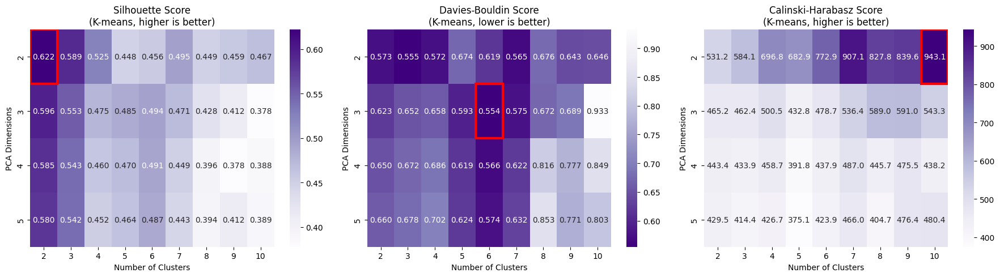

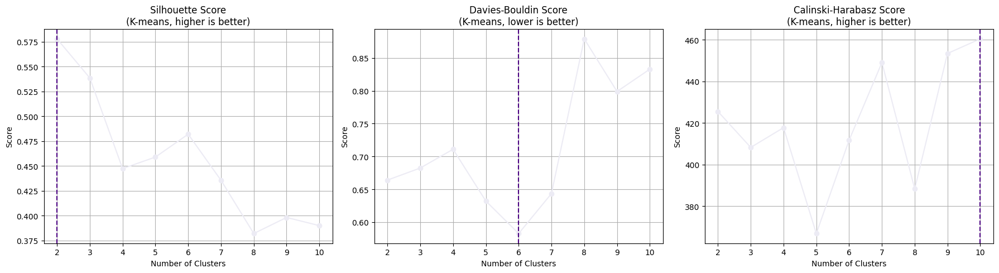

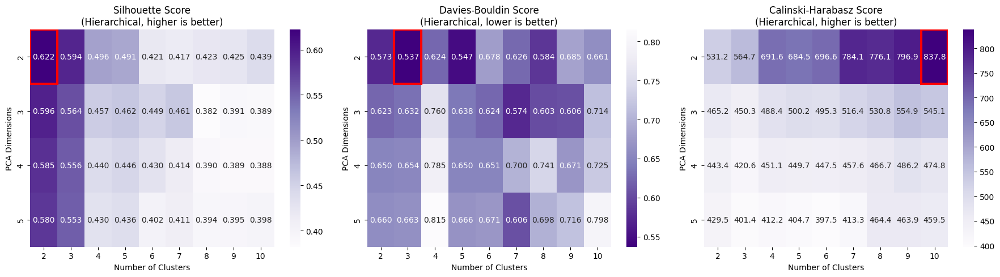

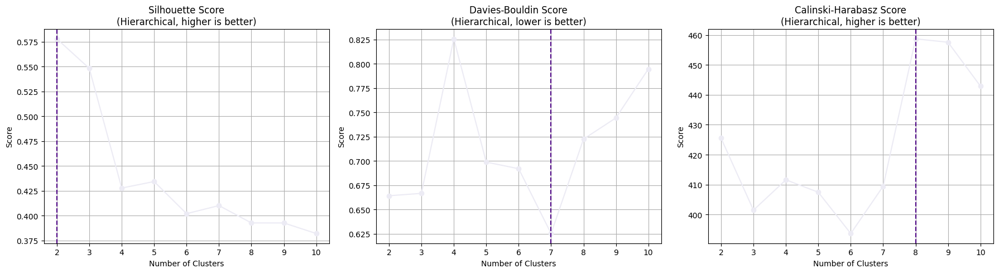

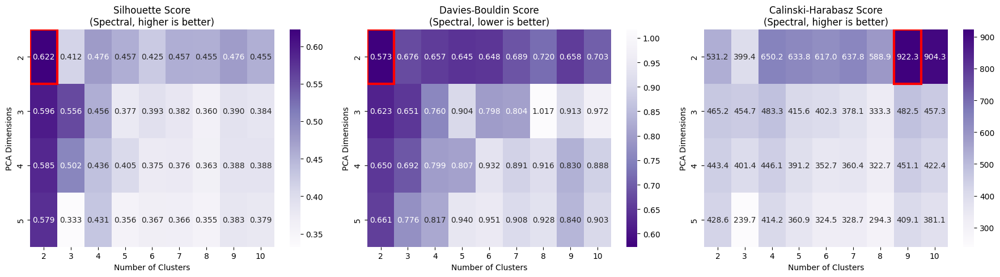

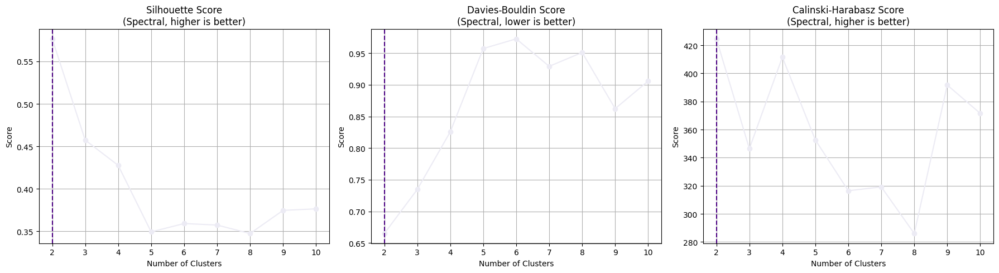

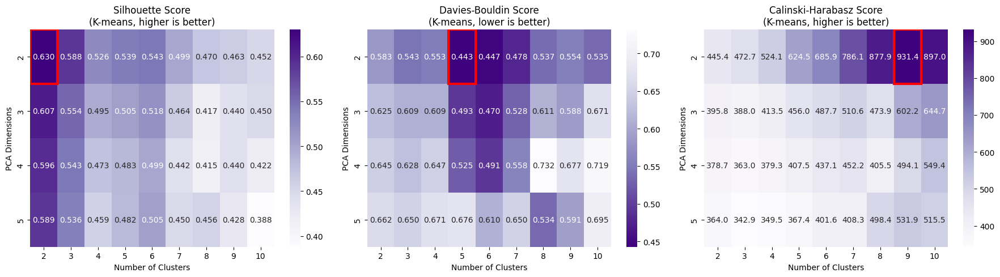

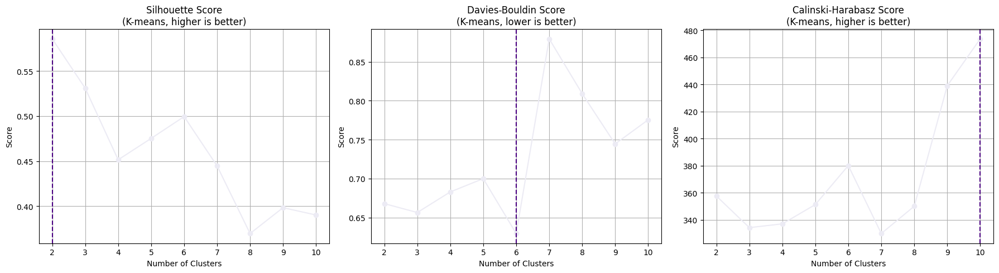

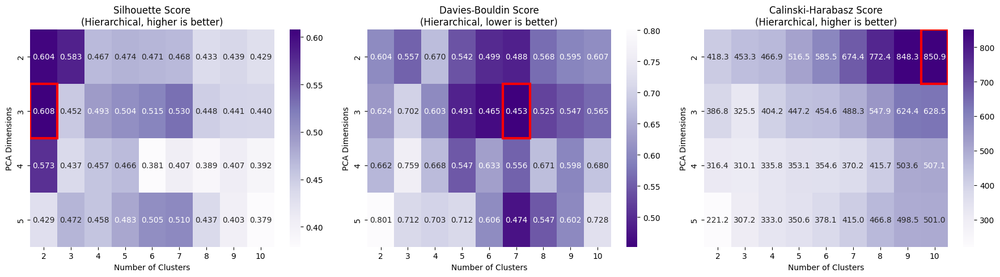

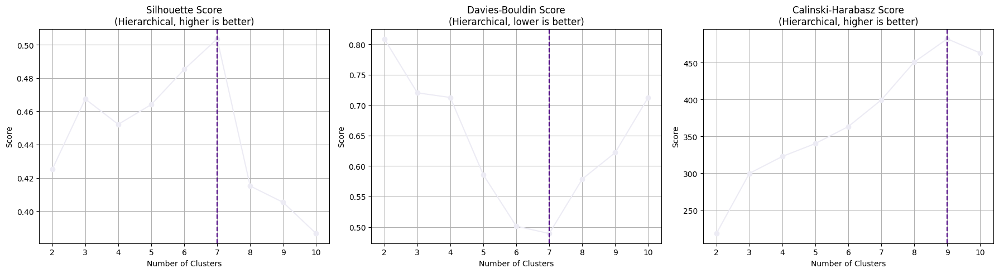

C:\Users\Amit L\PycharmProjects\Analysis\.venv\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
C:\Users\Amit L\PycharmProjects\Analysis\.venv\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
C:\Users\Amit L\PycharmProjects\Analysis\.venv\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
C:\Users\Amit L\PycharmProjects\Analysis\.venv\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
C:\Users\Amit L\PycharmProjects\Analysis\.venv\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:329: UserWarning: Graph is not full

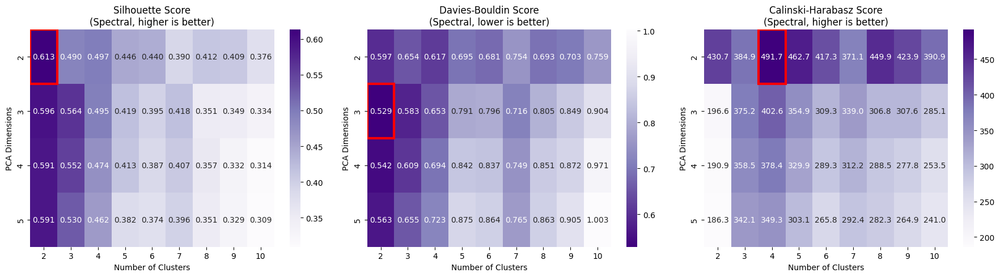

C:\Users\Amit L\PycharmProjects\Analysis\.venv\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
C:\Users\Amit L\PycharmProjects\Analysis\.venv\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
C:\Users\Amit L\PycharmProjects\Analysis\.venv\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
C:\Users\Amit L\PycharmProjects\Analysis\.venv\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
C:\Users\Amit L\PycharmProjects\Analysis\.venv\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:329: UserWarning: Graph is not full

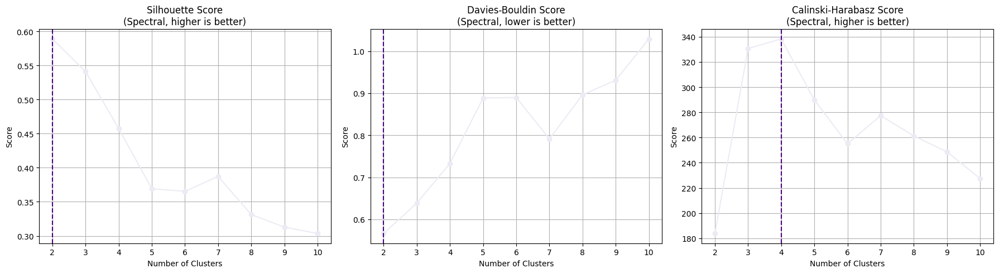

In [17]:
run_grid_search(sundays_totals, pdf_filename="sundays_totals_grid_search_plots.pdf")
run_grid_search(sundays_pct, pdf_filename="sundays_pct_grid_search_plots.pdf")


=== PCA Component Weights ===


,PC1,PC2
Subways: Total Estimated Ridership,0.4039,-0.0558
Buses: Total Estimated Ridership,0.3468,0.6529
LIRR: Total Estimated Ridership,0.3966,-0.3126
Metro-North: Total Estimated Ridership,0.3834,-0.4093
Access-A-Ride: Total Scheduled Trips,0.3777,-0.2613
Bridges and Tunnels: Total Traffic,0.3454,0.4864
Staten Island Railway: Total Estimated Ridership,0.3878,0.0198


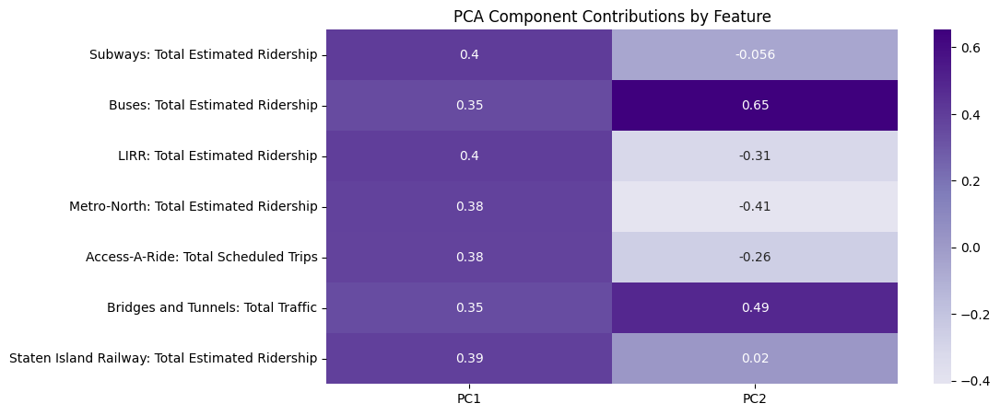

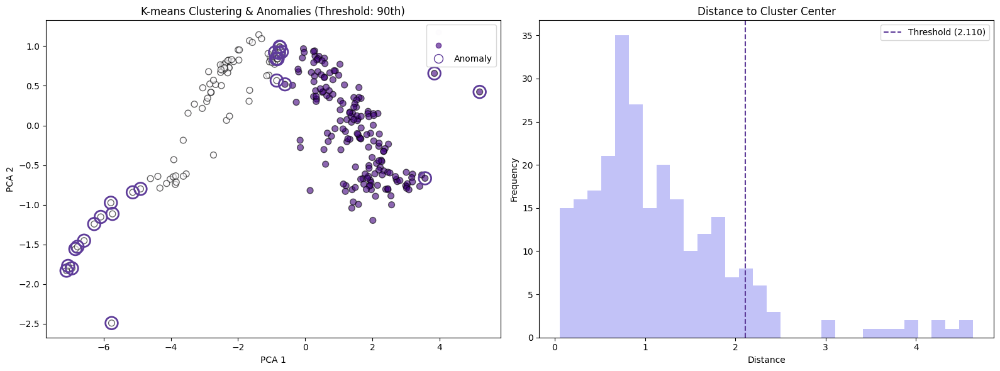

Total points: 254
Anomalies detected: 26 (10.24%)
Distance threshold: 2.110

Anomalies per original cluster:
  Cluster 0: 22/86 (25.58%) anomalies
  Cluster 1: 4/168 (2.38%) anomalies

=== Ranked Features (By Std. Difference) ===


,Feature,Anomaly Mean,Normal Mean,Mean Difference,Std. Diff
5,Bridges and Tunnels: Total Traffic,701040.0385,895447.2325,-194407.1940,-1.6239
4,Access-A-Ride: Total Scheduled Trips,18005.1538,27874.5175,-9869.3637,-1.3648
1,Buses: Total Estimated Ridership,718668.5769,1255805.6404,-537137.0634,-1.2902
0,Subways: Total Estimated Ridership,1845746.0000,3142616.2149,-1296870.2149,-1.2334
2,LIRR: Total Estimated Ridership,90744.9615,176027.2807,-85282.3192,-1.1907
3,Metro-North: Total Estimated Ridership,73705.5000,149093.2895,-75387.7895,-1.0595
6,Staten Island Railway: Total Estimated Ridership,4143.8462,6275.2719,-2131.4258,-0.9244


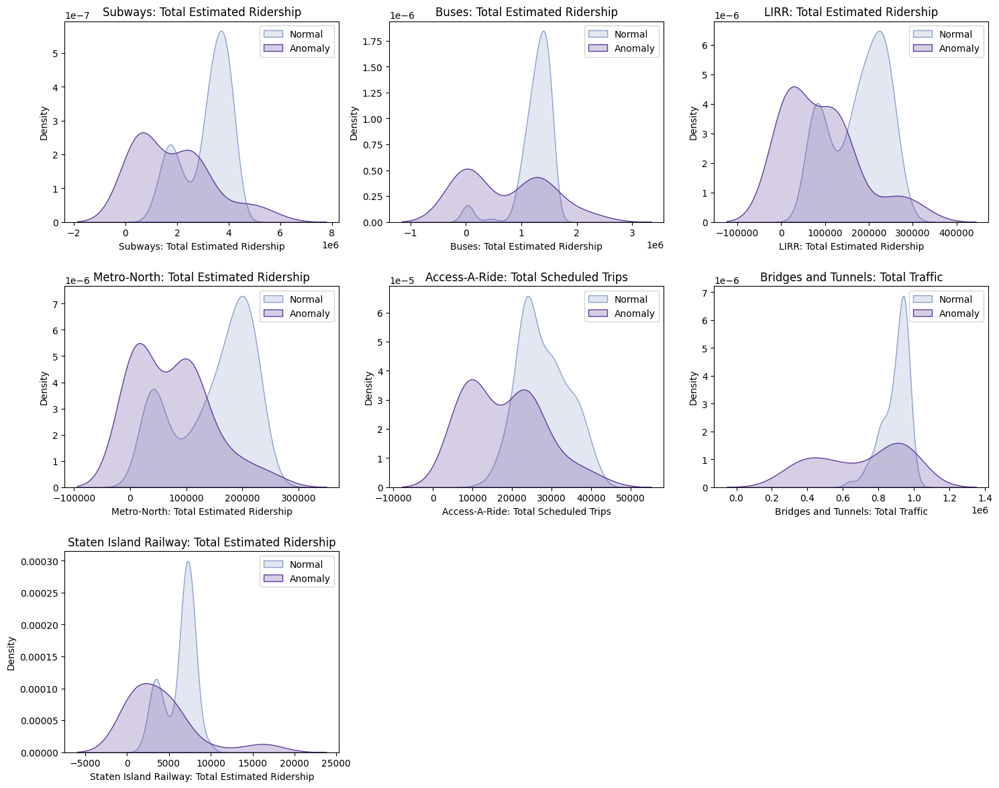

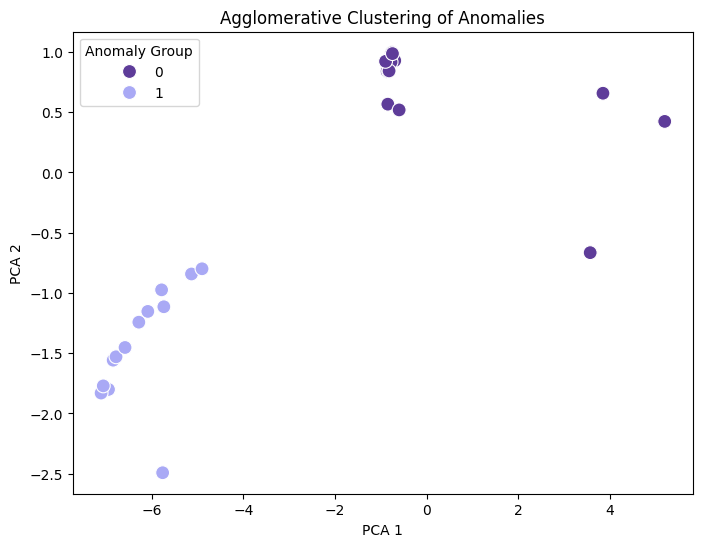


=== PCA Component Weights ===


,PC1,PC2
Subways: % of Comparable Pre-Pandemic Day,0.4068,-0.0417
Buses: % of Comparable Pre-Pandemic Day,0.3485,0.6027
LIRR: % of Comparable Pre-Pandemic Day,0.3916,-0.3624
Metro-North: % of Comparable Pre-Pandemic Day,0.3852,-0.3908
Access-A-Ride: % of Comparable Pre-Pandemic Day,0.3762,-0.1530
Bridges and Tunnels: % of Comparable Pre-Pandemic Day,0.3499,0.5628
Staten Island Railway: % of Comparable Pre-Pandemic Day,0.3839,-0.1042


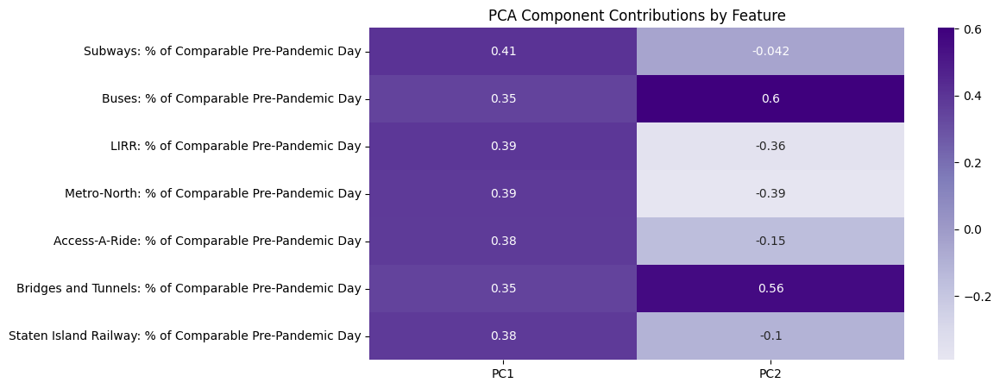

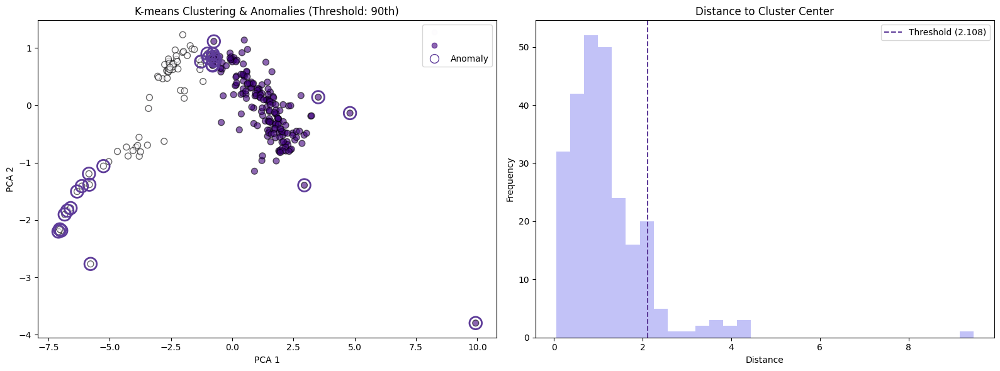

Total points: 254
Anomalies detected: 26 (10.24%)
Distance threshold: 2.108

Anomalies per original cluster:
  Cluster 0: 14/71 (19.72%) anomalies
  Cluster 1: 12/183 (6.56%) anomalies

=== Ranked Features (By Std. Difference) ===


,Feature,Anomaly Mean,Normal Mean,Mean Difference,Std. Diff
5,Bridges and Tunnels: % of Comparable Pre-Pande...,0.7427,0.9602,-0.2175,-1.7506
4,Access-A-Ride: % of Comparable Pre-Pandemic Day,0.6331,0.9582,-0.3251,-1.3253
1,Buses: % of Comparable Pre-Pandemic Day,0.3696,0.5836,-0.2139,-1.1190
0,Subways: % of Comparable Pre-Pandemic Day,0.3773,0.5741,-0.1968,-1.0262
3,Metro-North: % of Comparable Pre-Pandemic Day,0.3254,0.5311,-0.2058,-0.7791
2,LIRR: % of Comparable Pre-Pandemic Day,0.3727,0.5616,-0.1889,-0.7415
6,Staten Island Railway: % of Comparable Pre-Pan...,0.3092,0.3975,-0.0882,-0.5725


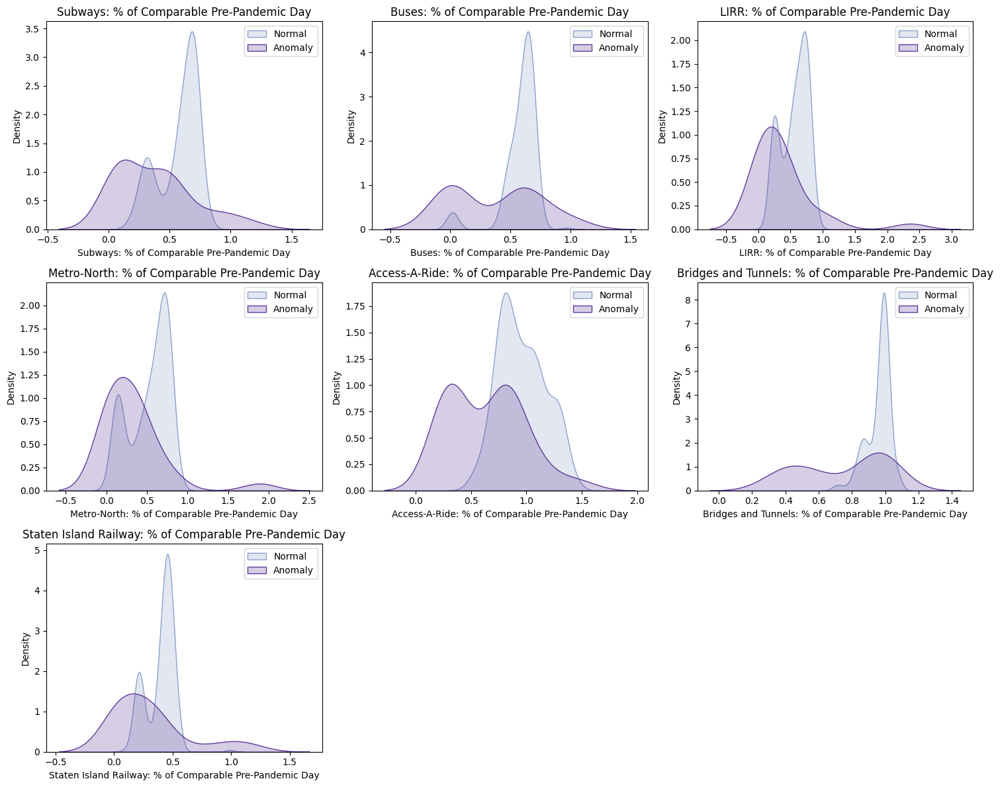

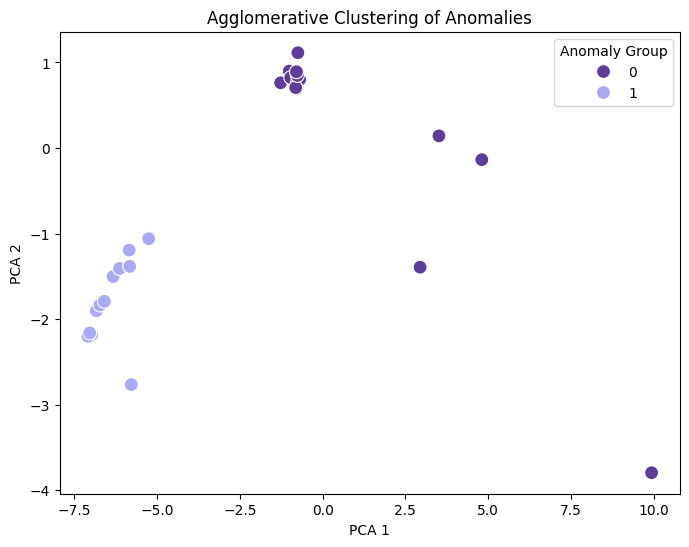

In [18]:
sundays_results_totals = kmeans_anomaly_detection_with_analysis(sundays_totals, threshold_percentile=90, pdf_path="sundays_totals_normal_vs_anomaly_plots.pdf")
sundays_results_pct = kmeans_anomaly_detection_with_analysis(sundays_pct, threshold_percentile=90, pdf_path="sundays_pct_normal_vs_anomaly_plots.pdf")

=== Data Breakdown ===
       Count
Group       
-1       228
 0        14
 1        12 

=== Mean Feature Values (Grouped by Anomaly Group + Normal) ===


anomaly_group,-1,0,1
Bridges and Tunnels: % of Comparable Pre-Pandemic Day,0.9602,0.9657,0.4825
Access-A-Ride: % of Comparable Pre-Pandemic Day,0.9582,0.9021,0.3192
Buses: % of Comparable Pre-Pandemic Day,0.5836,0.6771,0.0108
Subways: % of Comparable Pre-Pandemic Day,0.5741,0.6129,0.1025
Metro-North: % of Comparable Pre-Pandemic Day,0.5311,0.5364,0.0792
LIRR: % of Comparable Pre-Pandemic Day,0.5616,0.6407,0.0600
Staten Island Railway: % of Comparable Pre-Pandemic Day,0.3975,0.5207,0.0625



=== Difference from Normal Behavior ===


anomaly_group,0,1
Bridges and Tunnels: % of Comparable Pre-Pandemic Day,0.0055,-0.4777
Access-A-Ride: % of Comparable Pre-Pandemic Day,-0.0561,-0.6390
Buses: % of Comparable Pre-Pandemic Day,0.0935,-0.5728
Subways: % of Comparable Pre-Pandemic Day,0.0388,-0.4716
Metro-North: % of Comparable Pre-Pandemic Day,0.0053,-0.4519
LIRR: % of Comparable Pre-Pandemic Day,0.0791,-0.5016
Staten Island Railway: % of Comparable Pre-Pandemic Day,0.1232,-0.3350


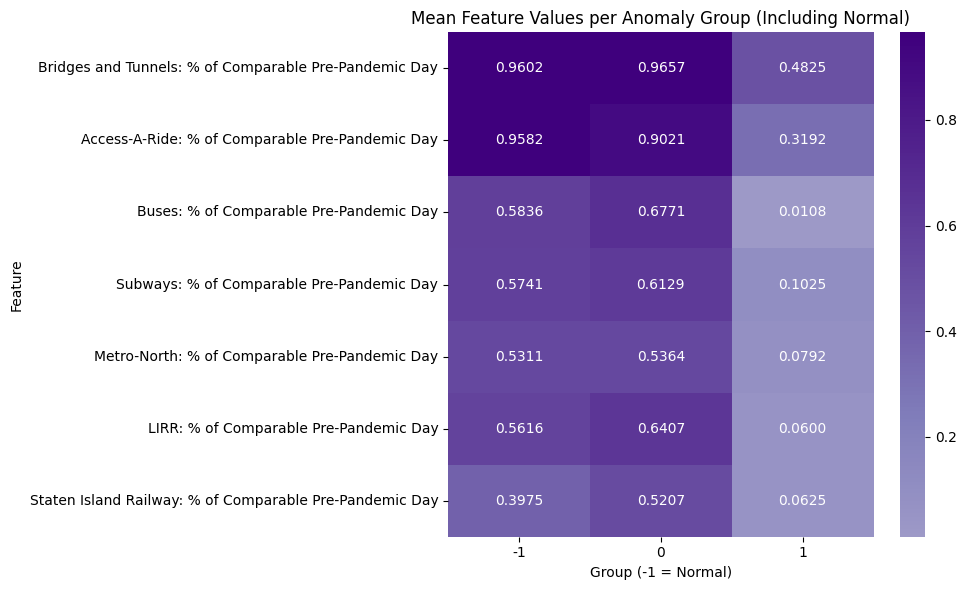

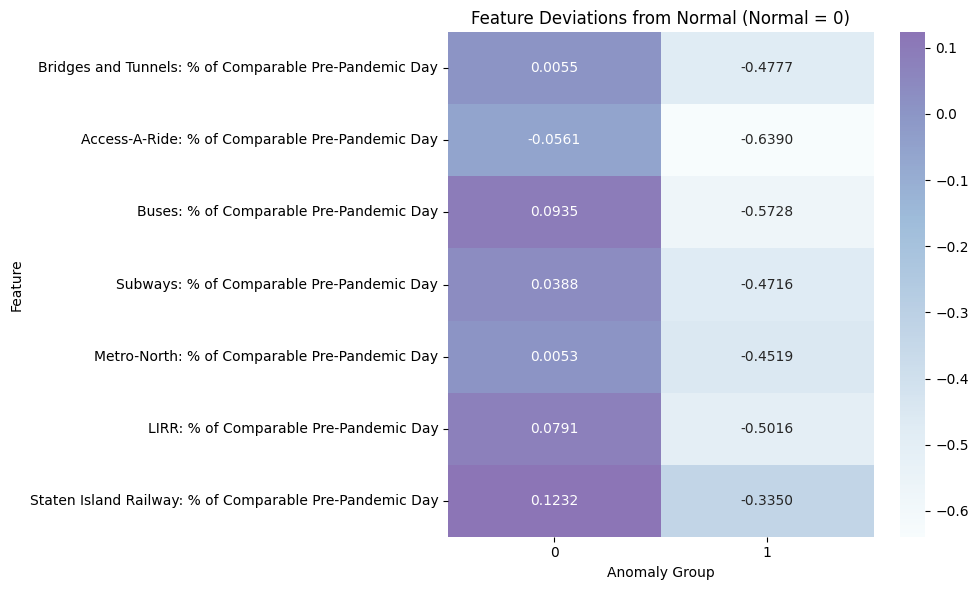


=== Feature Distribution per Group (with Normal) ===


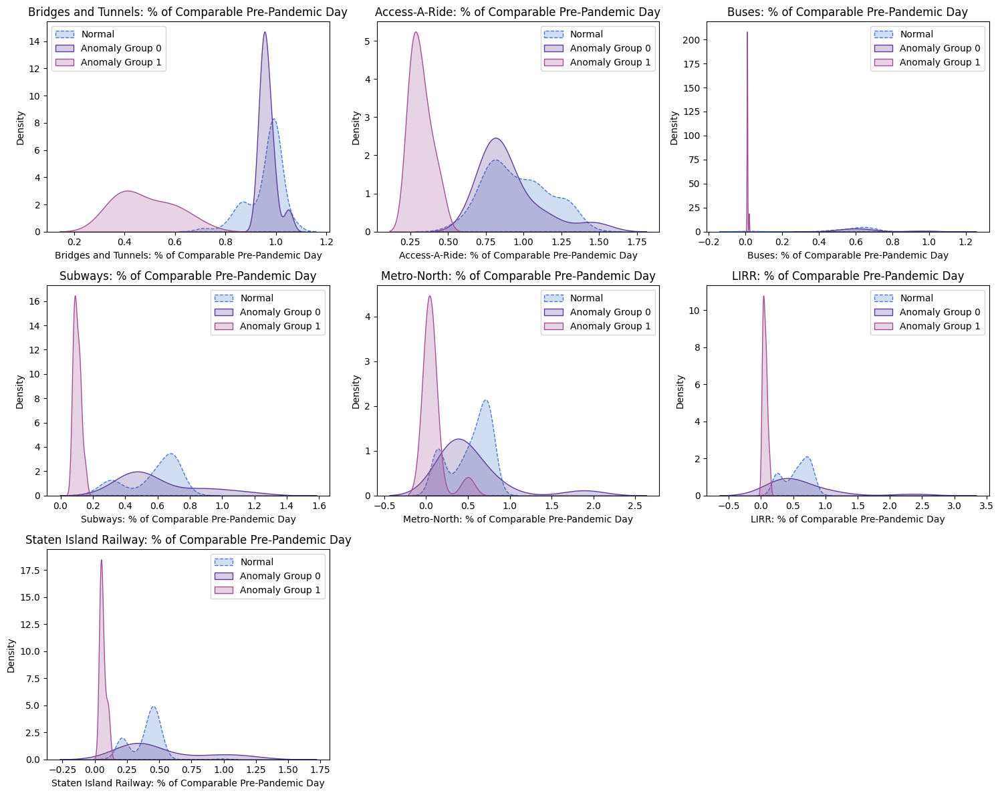

=== Data Breakdown ===
       Count
Group       
-1       228
 0        13
 1        13 

=== Mean Feature Values (Grouped by Anomaly Group + Normal) ===


anomaly_group,-1,0,1
Bridges and Tunnels: Total Traffic,895447.2325,920400.8462,481679.2308
Access-A-Ride: Total Scheduled Trips,27874.5175,26269.1538,9741.1538
Buses: Total Estimated Ridership,1255805.6404,1415013.1538,22324.0000
Subways: Total Estimated Ridership,3142616.2149,3087934.9231,603557.0769
LIRR: Total Estimated Ridership,176027.2807,160149.6154,21340.3077
Metro-North: Total Estimated Ridership,149093.2895,124661.9231,22749.0769
Staten Island Railway: Total Estimated Ridership,6275.2719,7180.2308,1107.4615



=== Difference from Normal Behavior ===


anomaly_group,0,1
Bridges and Tunnels: Total Traffic,24953.6137,-413768.0017
Access-A-Ride: Total Scheduled Trips,-1605.3637,-18133.3637
Buses: Total Estimated Ridership,159207.5134,-1233481.6404
Subways: Total Estimated Ridership,-54681.2918,-2539059.1380
LIRR: Total Estimated Ridership,-15877.6653,-154686.9730
Metro-North: Total Estimated Ridership,-24431.3664,-126344.2126
Staten Island Railway: Total Estimated Ridership,904.9589,-5167.8104


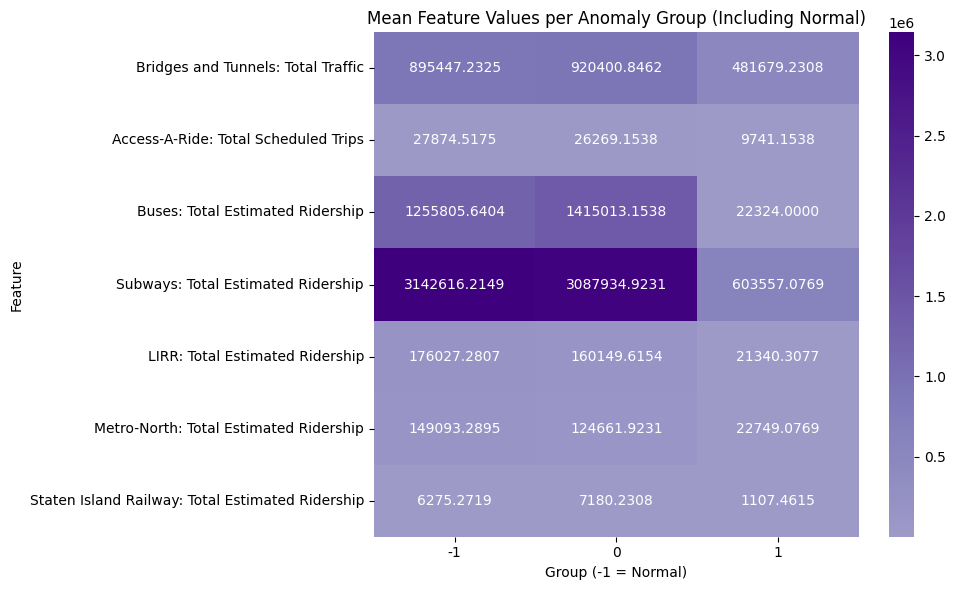

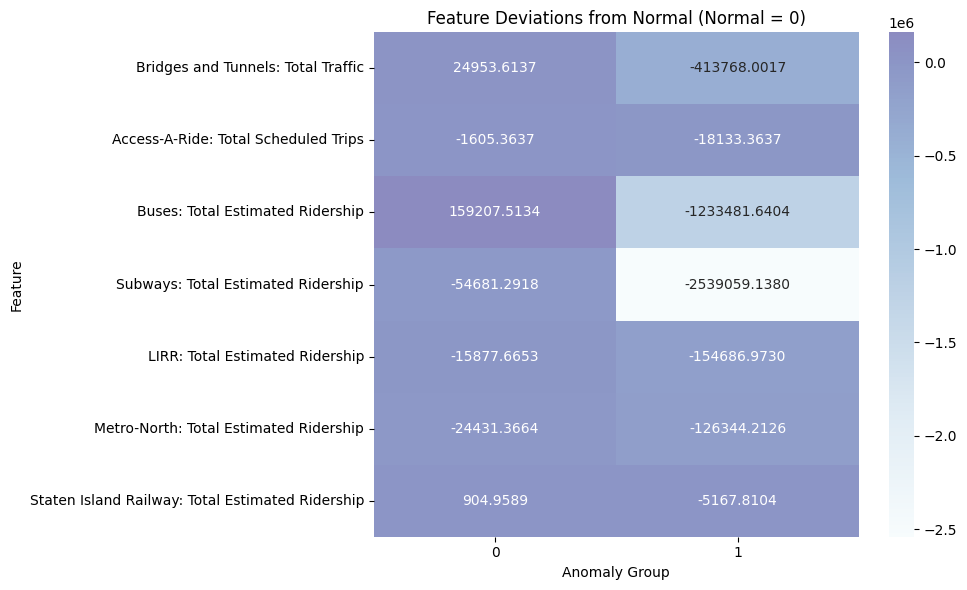


=== Feature Distribution per Group (with Normal) ===


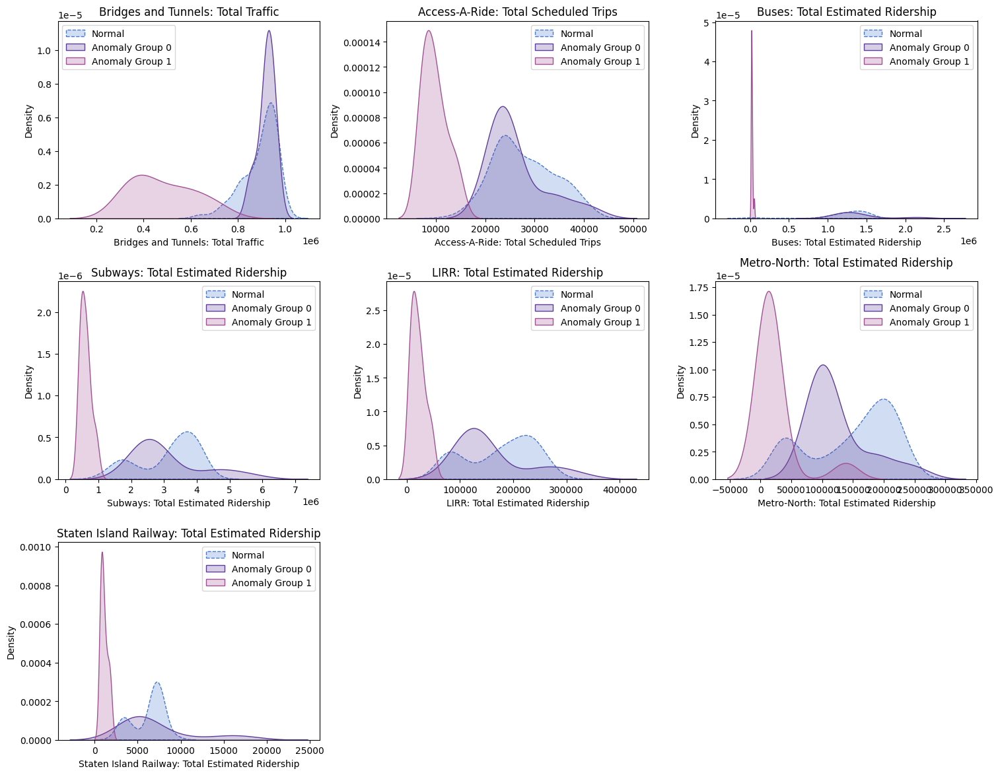

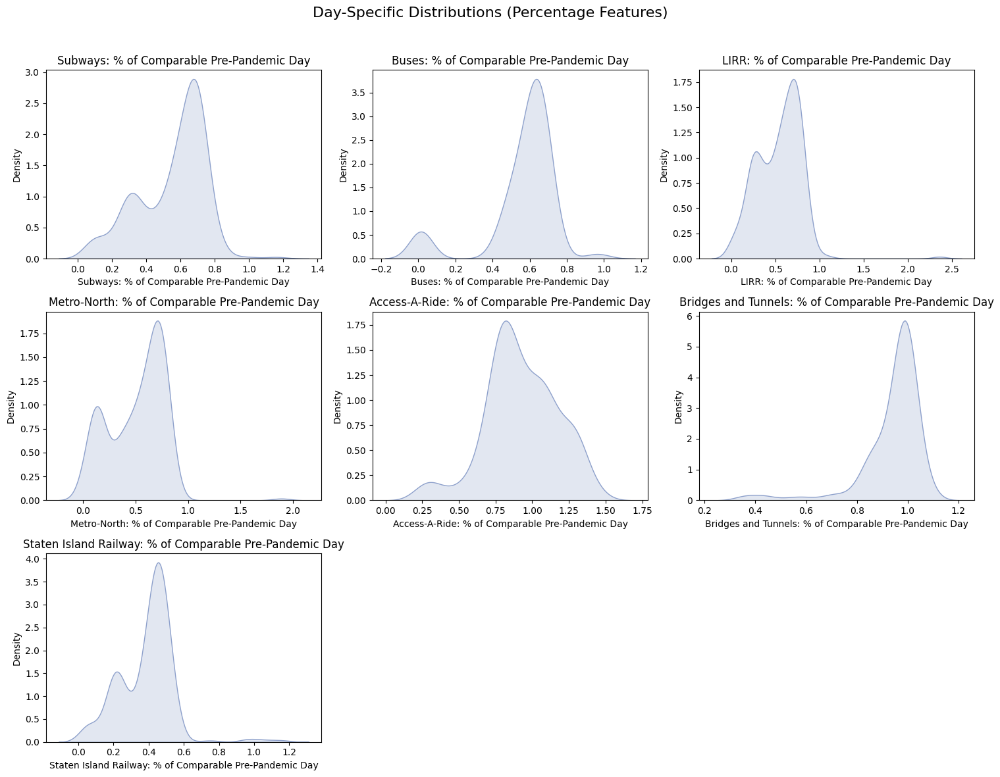

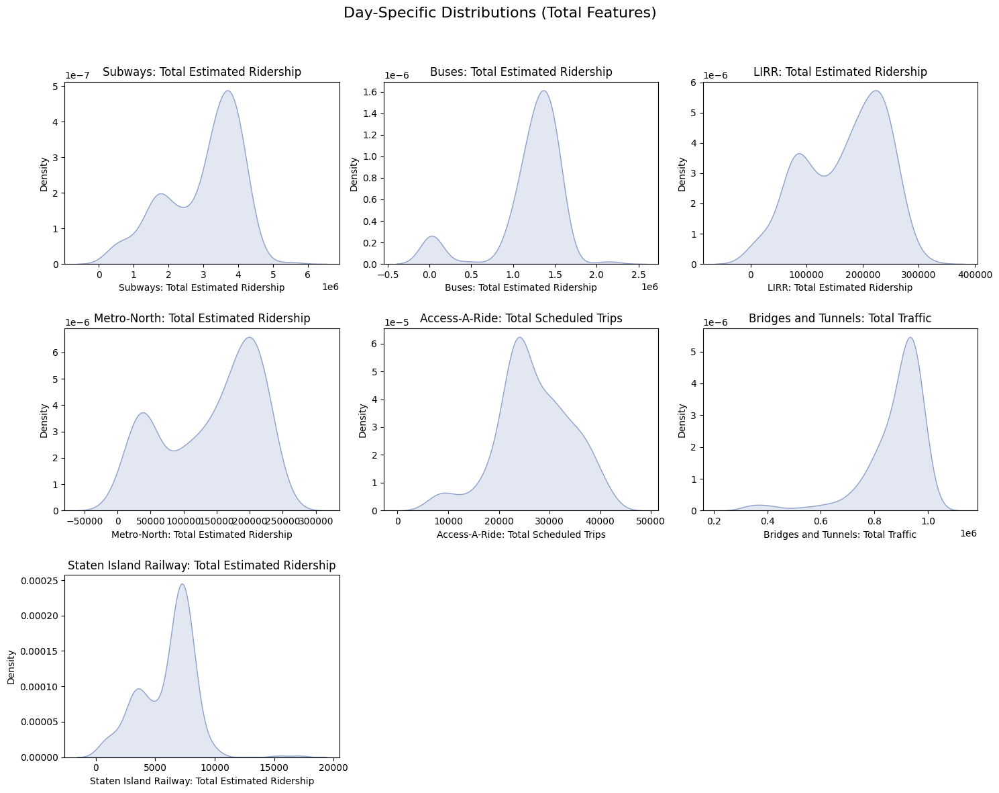

In [19]:
analyze_anomaly_clusters_with_normals(
    sundays_results_pct, 
    data=sundays_pct,
    pdf_path="sundays_pct_anomaly_clusters_analysis.pdf"
)

analyze_anomaly_clusters_with_normals(
    sundays_results_totals, 
    data=sundays_totals,
    pdf_path="sundays_totals_anomaly_clusters_analysis.pdf"
)

plot_feature_distributions(sundays_pct, title="Day-Specific Distributions (Percentage Features)", pdf_output = "day_pct_distribution.pdf" )
plot_feature_distributions(sundays_totals, title="Day-Specific Distributions (Total Features)", pdf_output = "day_totals_distribution.pdf")


=== PCA Component Weights ===


,PC1,PC2
Subways: % of Comparable Pre-Pandemic Day,0.4396,0.0164
LIRR: % of Comparable Pre-Pandemic Day,0.4253,-0.2821
Metro-North: % of Comparable Pre-Pandemic Day,0.4293,-0.1945
Access-A-Ride: % of Comparable Pre-Pandemic Day,0.3998,0.3336
Bridges and Tunnels: % of Comparable Pre-Pandemic Day,0.3653,0.7127
Staten Island Railway: % of Comparable Pre-Pandemic Day,0.3850,-0.5129


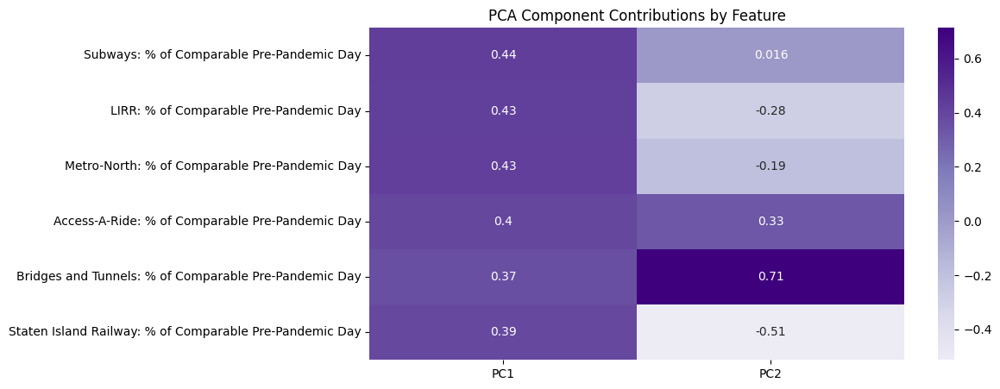

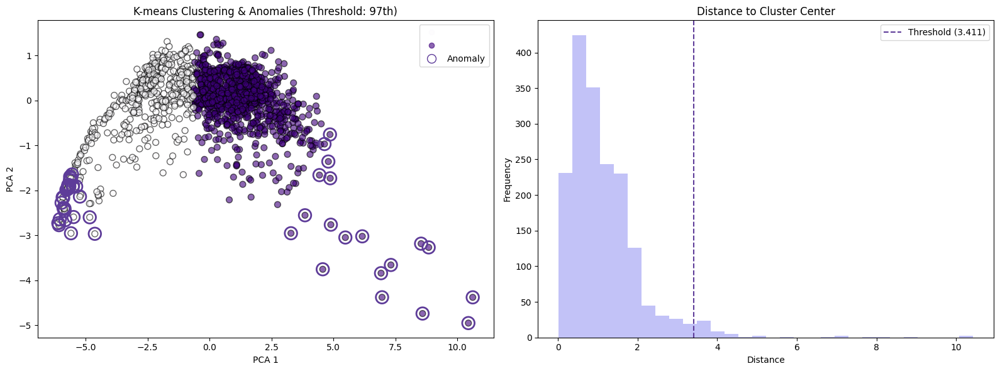

Total points: 1776
Anomalies detected: 54 (3.04%)
Distance threshold: 3.411

Anomalies per original cluster:
  Cluster 0: 35/590 (5.93%) anomalies
  Cluster 1: 19/1186 (1.60%) anomalies

=== Ranked Features (By Std. Difference) ===


,Feature,Anomaly Mean,Normal Mean,Mean Difference,Std. Diff
4,Bridges and Tunnels: % of Comparable Pre-Pande...,0.5850,0.9483,-0.3633,-2.5072
3,Access-A-Ride: % of Comparable Pre-Pandemic Day,0.5526,0.8891,-0.3365,-1.3057
0,Subways: % of Comparable Pre-Pandemic Day,0.4300,0.5678,-0.1378,-0.6853
5,Staten Island Railway: % of Comparable Pre-Pan...,0.4907,0.3847,0.1060,0.5247
1,LIRR: % of Comparable Pre-Pandemic Day,0.6372,0.6065,0.0307,0.0997
2,Metro-North: % of Comparable Pre-Pandemic Day,0.5285,0.5255,0.0030,0.0109


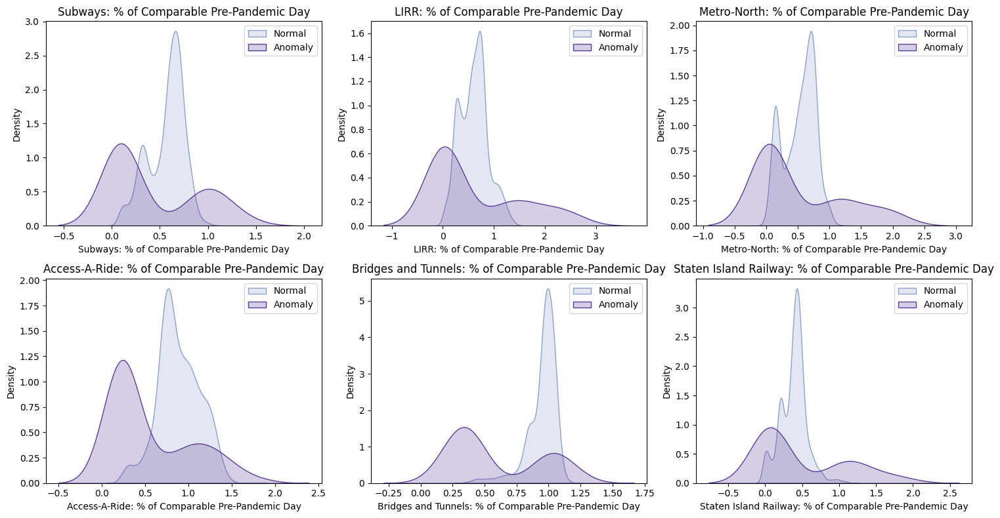

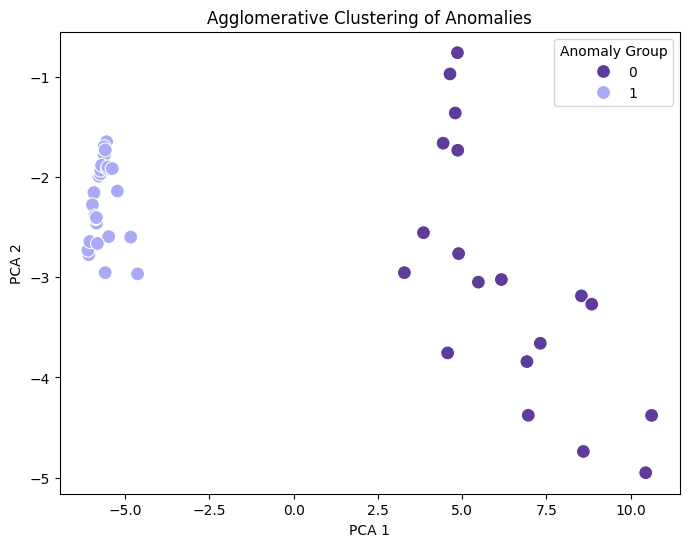

=== Data Breakdown ===
       Count
Group       
-1      1722
 1        35
 0        19 

=== Mean Feature Values (Grouped by Anomaly Group + Normal) ===


anomaly_group,-1,0,1
Bridges and Tunnels: % of Comparable Pre-Pandemic Day,0.9483,1.0442,0.3357
Access-A-Ride: % of Comparable Pre-Pandemic Day,0.8891,1.1279,0.2403
Subways: % of Comparable Pre-Pandemic Day,0.5678,1.0379,0.1000
Staten Island Railway: % of Comparable Pre-Pandemic Day,0.3847,1.2589,0.0737
LIRR: % of Comparable Pre-Pandemic Day,0.6065,1.7458,0.0354
Metro-North: % of Comparable Pre-Pandemic Day,0.5255,1.4089,0.0506



=== Difference from Normal Behavior ===


anomaly_group,0,1
Bridges and Tunnels: % of Comparable Pre-Pandemic Day,0.0959,-0.6126
Access-A-Ride: % of Comparable Pre-Pandemic Day,0.2388,-0.6488
Subways: % of Comparable Pre-Pandemic Day,0.4701,-0.4678
Staten Island Railway: % of Comparable Pre-Pandemic Day,0.8742,-0.3110
LIRR: % of Comparable Pre-Pandemic Day,1.1393,-0.5711
Metro-North: % of Comparable Pre-Pandemic Day,0.8834,-0.4749


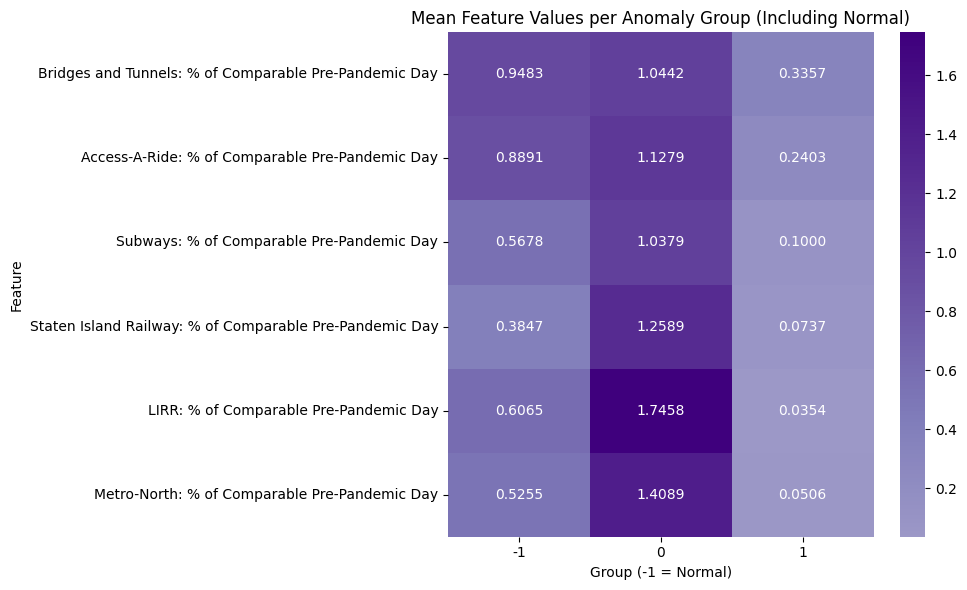

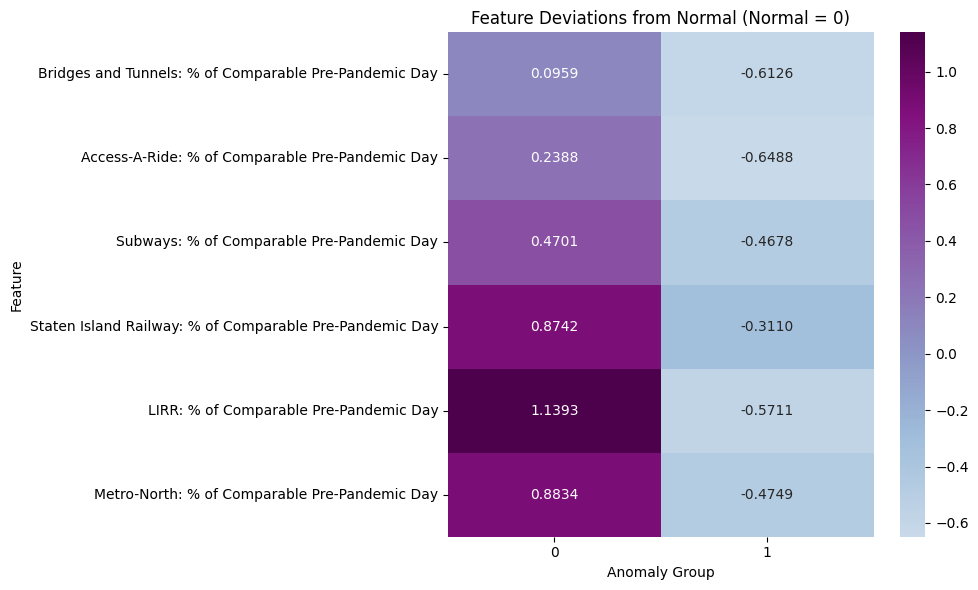


=== Feature Distribution per Group (with Normal) ===


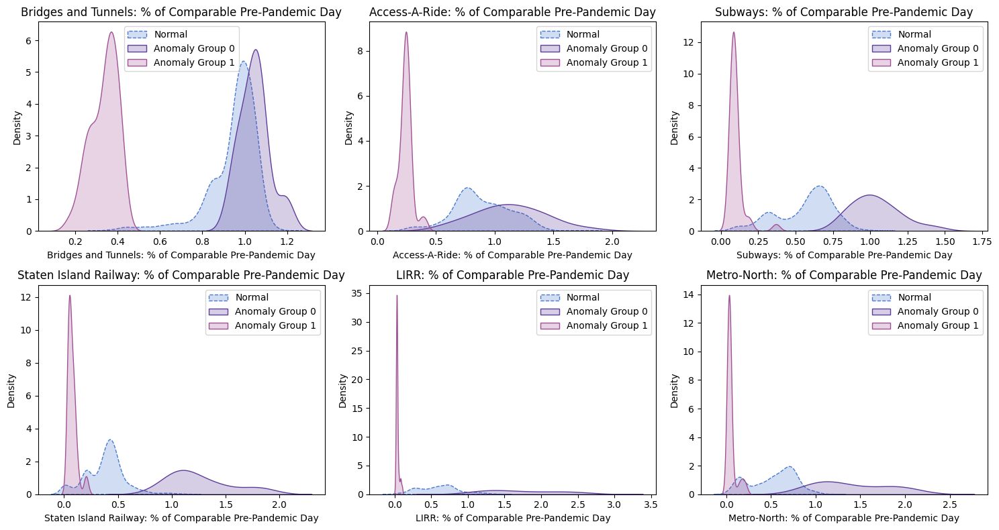


=== PCA Component Weights ===


,PC1,PC2
Subways: Total Estimated Ridership,0.4322,-0.0450
LIRR: Total Estimated Ridership,0.4319,-0.1106
Metro-North: Total Estimated Ridership,0.4193,-0.1477
Access-A-Ride: Total Scheduled Trips,0.4171,-0.0801
Bridges and Tunnels: Total Traffic,0.3374,0.9106
Staten Island Railway: Total Estimated Ridership,0.4038,-0.3583


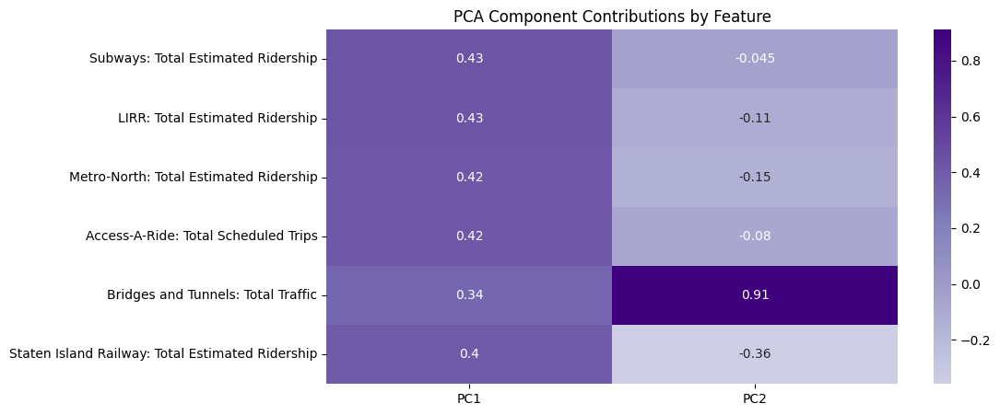

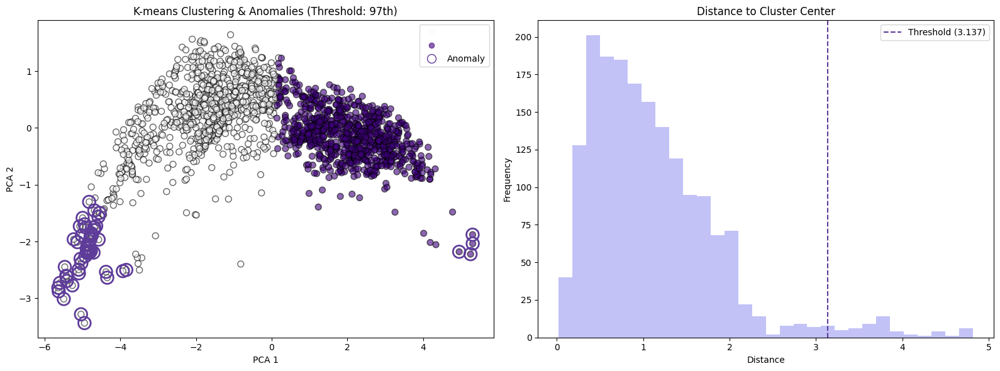

Total points: 1776
Anomalies detected: 54 (3.04%)
Distance threshold: 3.137

Anomalies per original cluster:
  Cluster 0: 50/932 (5.36%) anomalies
  Cluster 1: 4/844 (0.47%) anomalies

=== Ranked Features (By Std. Difference) ===


,Feature,Anomaly Mean,Normal Mean,Mean Difference,Std. Diff
4,Bridges and Tunnels: Total Traffic,374967.5926,872383.7578,-497416.1652,-3.5225
3,Access-A-Ride: Total Scheduled Trips,8054.0185,22797.7718,-14743.7533,-1.7909
0,Subways: Total Estimated Ridership,806309.2593,2596254.2683,-1789945.0090,-1.6765
1,LIRR: Total Estimated Ridership,31535.3148,142146.8577,-110611.5429,-1.5311
2,Metro-North: Total Estimated Ridership,27968.6481,120330.7062,-92362.0580,-1.3738
5,Staten Island Railway: Total Estimated Ridership,1911.2593,4572.8908,-2661.6316,-0.9857


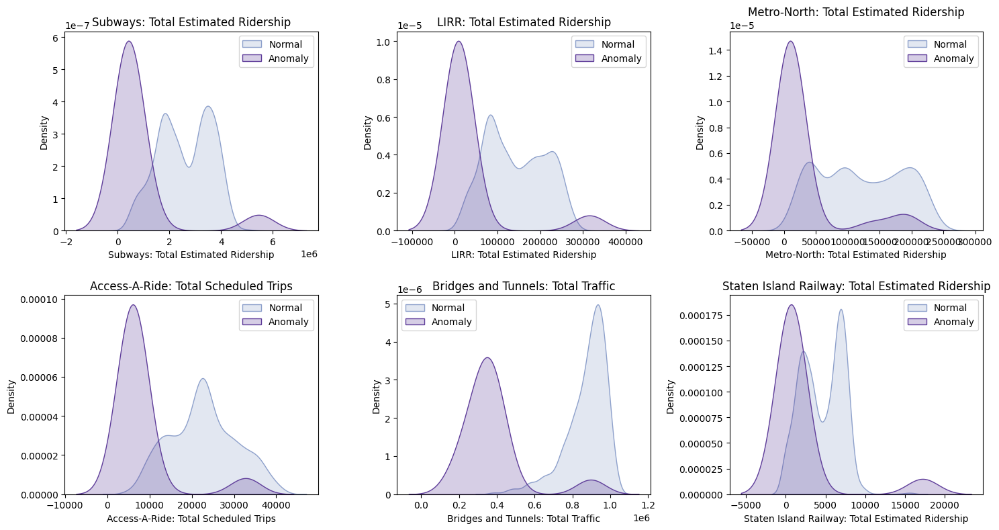

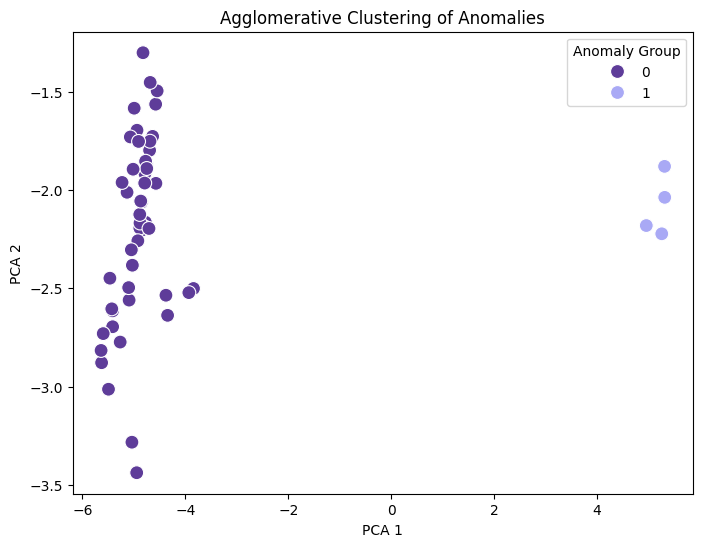

=== Data Breakdown ===
       Count
Group       
-1      1722
 0        50
 1         4 

=== Mean Feature Values (Grouped by Anomaly Group + Normal) ===


anomaly_group,-1,0,1
Bridges and Tunnels: Total Traffic,872383.7578,333132.0000,897912.5000
Access-A-Ride: Total Scheduled Trips,22797.7718,6086.1200,32652.7500
Subways: Total Estimated Ridership,2596254.2683,434688.4000,5451570.0000
LIRR: Total Estimated Ridership,142146.8577,8847.0400,315138.7500
Metro-North: Total Estimated Ridership,120330.7062,15037.6600,189606.0000
Staten Island Railway: Total Estimated Ridership,4572.8908,685.5200,17233.0000



=== Difference from Normal Behavior ===


anomaly_group,0,1
Bridges and Tunnels: Total Traffic,-539251.7578,25528.7422
Access-A-Ride: Total Scheduled Trips,-16711.6518,9854.9782
Subways: Total Estimated Ridership,-2161565.8683,2855315.7317
LIRR: Total Estimated Ridership,-133299.8177,172991.8923
Metro-North: Total Estimated Ridership,-105293.0462,69275.2938
Staten Island Railway: Total Estimated Ridership,-3887.3708,12660.1092


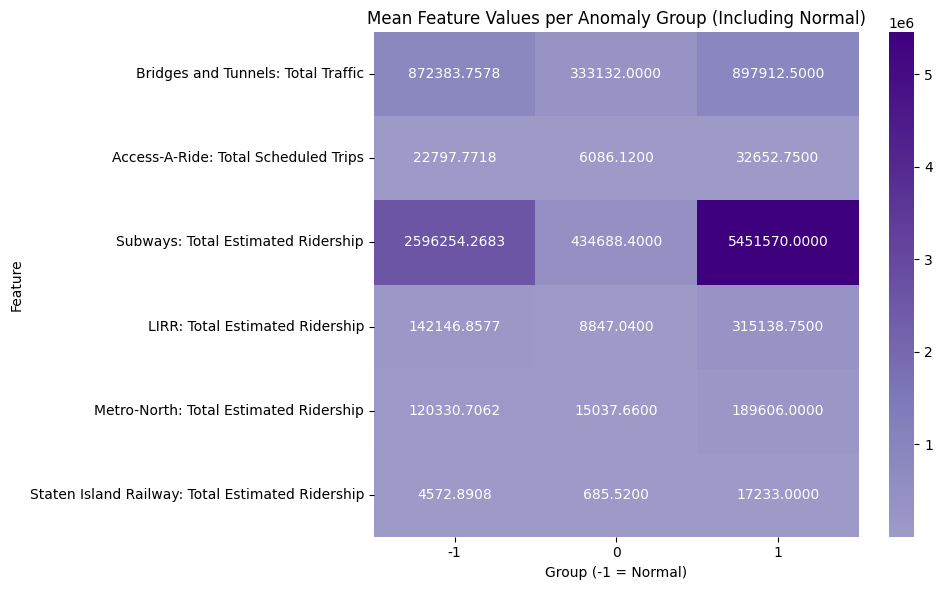

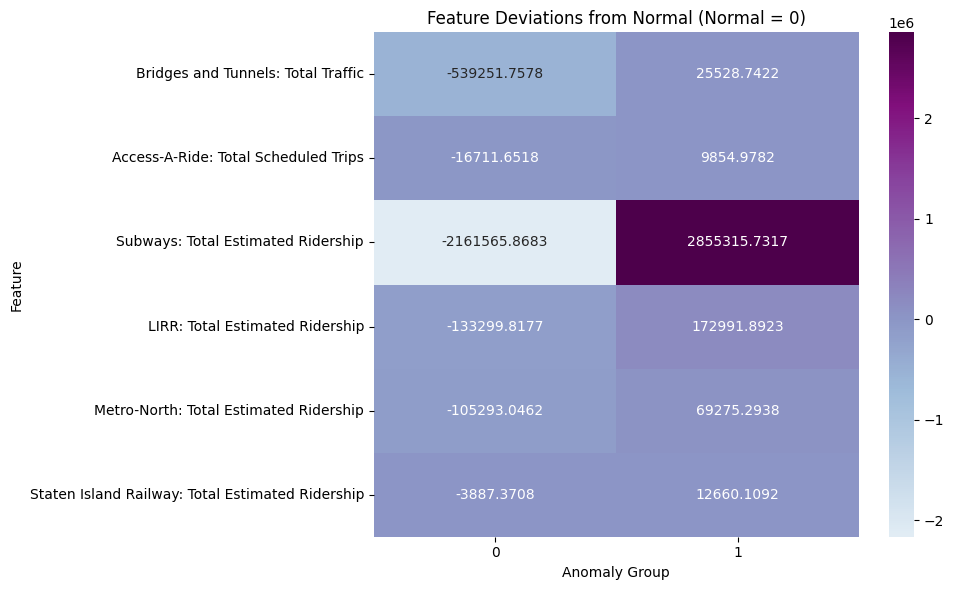


=== Feature Distribution per Group (with Normal) ===


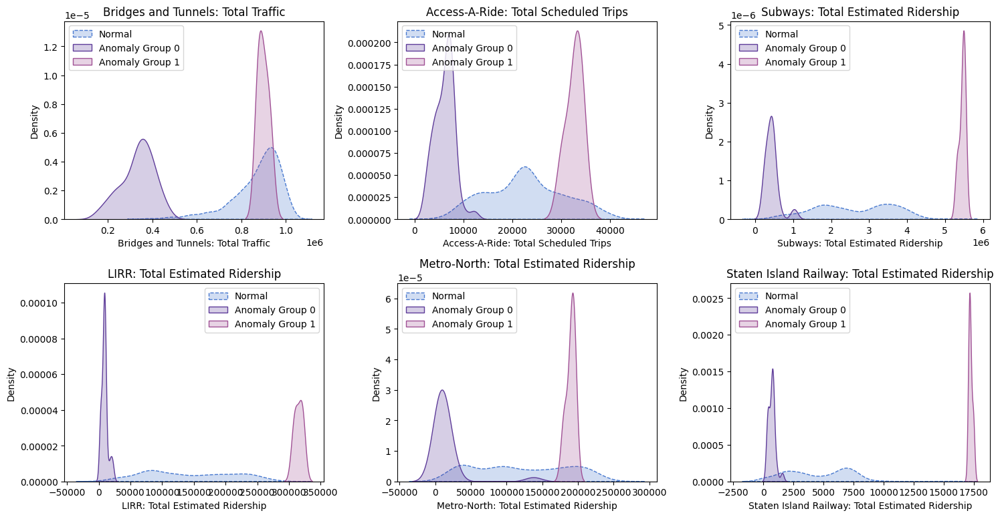

In [20]:
results_pct_no_bus= kmeans_anomaly_detection_with_analysis(df_pct.drop(["Spectral_Cluster", "Buses: % of Comparable Pre-Pandemic Day"], axis='columns'), threshold_percentile=97, pdf_path="pct_normal_vs_anomaly_plots_no_bus.pdf")
analyze_anomaly_clusters_with_normals(
    results_pct_no_bus, 
    data=df_pct.drop(["Spectral_Cluster", "Buses: % of Comparable Pre-Pandemic Day"], axis='columns'),
    pdf_path="pct_anomaly_clusters_analysis_no_bus.pdf"
)

results_totals_no_bus= kmeans_anomaly_detection_with_analysis(df_totals.drop(["Spectral_Cluster", "Buses: Total Estimated Ridership"], axis='columns'), threshold_percentile=97, pdf_path="totals_normal_vs_anomaly_plots_no_bus.pdf")
analyze_anomaly_clusters_with_normals(
    results_totals_no_bus, 
    data=df_totals.drop(["Spectral_Cluster", "Buses: Total Estimated Ridership"], axis='columns'),
    pdf_path="totals_anomaly_clusters_analysis_no_bus.pdf"
)

In [21]:
import matplotlib.dates as mdates
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

def plot_pca_with_date_gradient(data, numerical_columns=None, date_column=None,
                                random_state=42, figsize=(10, 7),
                                title="PCA Colored by Date", pdf_path=None):
    """
    Plot PCA (2D) with points colored by actual date values using a continuous gradient.
    """
    if date_column is None or date_column not in data.columns:
        raise ValueError("Please provide a valid `date_column` that exists in the data.")

    df = data.copy()
    df[date_column] = pd.to_datetime(df[date_column])
    df = df.sort_values(by=date_column)

    if numerical_columns is None:
        numerical_columns = df.select_dtypes(include=[np.number]).columns.tolist()

    # Standardize numerical data
    X = df[numerical_columns].values
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Perform PCA
    pca = PCA(n_components=2, random_state=random_state)
    X_pca = pca.fit_transform(X_scaled)

    # Prepare dataframe for plotting
    pca_df = pd.DataFrame(X_pca, columns=["PCA 1", "PCA 2"])
    pca_df["Date"] = df[date_column]
    pca_df["DateNum"] = mdates.date2num(df[date_column])

    # Normalize dates for color mapping
    norm = Normalize(vmin=pca_df["DateNum"].min(), vmax=pca_df["DateNum"].max())
    cmap = plt.cm.Purples  # <- Changed to Purples
    sm = ScalarMappable(norm=norm, cmap=cmap)

    # Plotting
    fig, ax = plt.subplots(figsize=figsize)
    scatter = ax.scatter(
        pca_df["PCA 1"], pca_df["PCA 2"],
        c=pca_df["DateNum"],
        cmap=cmap,
        norm=norm,
        s=60,
        alpha=0.85,
        edgecolor='k',
        linewidth=0.3
    )

    # Colorbar with formatted date ticks
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label("Date")
    cbar.ax.yaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    cbar.ax.yaxis.set_major_locator(mdates.AutoDateLocator())

    plt.title(title)
    plt.tight_layout()

    # Save to PDF if path provided
    if pdf_path:
        with PdfPages(pdf_path) as pdf:
            pdf.savefig(fig)
        print(f"PCA plot with date gradient saved to: {pdf_path}")

    plt.show()

PCA plot with date gradient saved to: pca_sundays_pct_clusters_anomalies.pdf


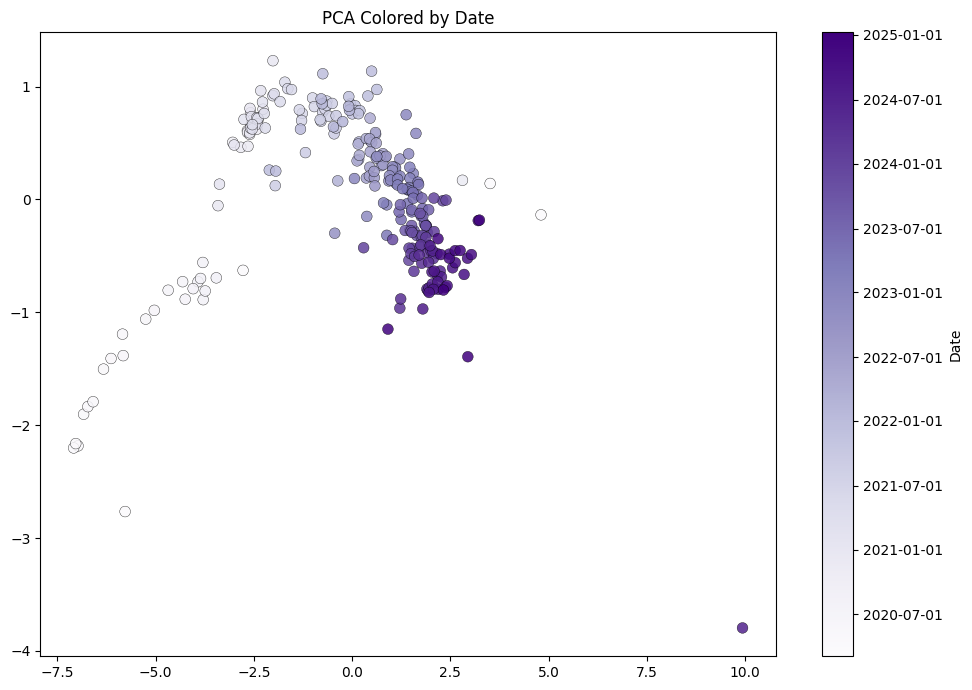

PCA plot with date gradient saved to: pca_pct_clusters_anomalies.pdf


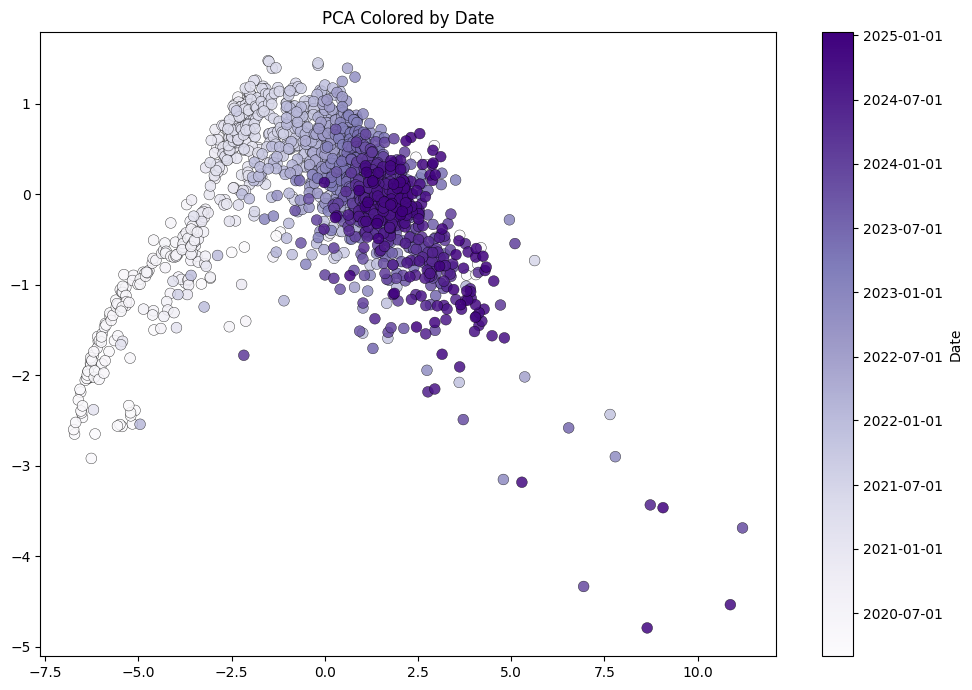

PCA plot with date gradient saved to: pca_sundays_totals_clusters_anomalies.pdf


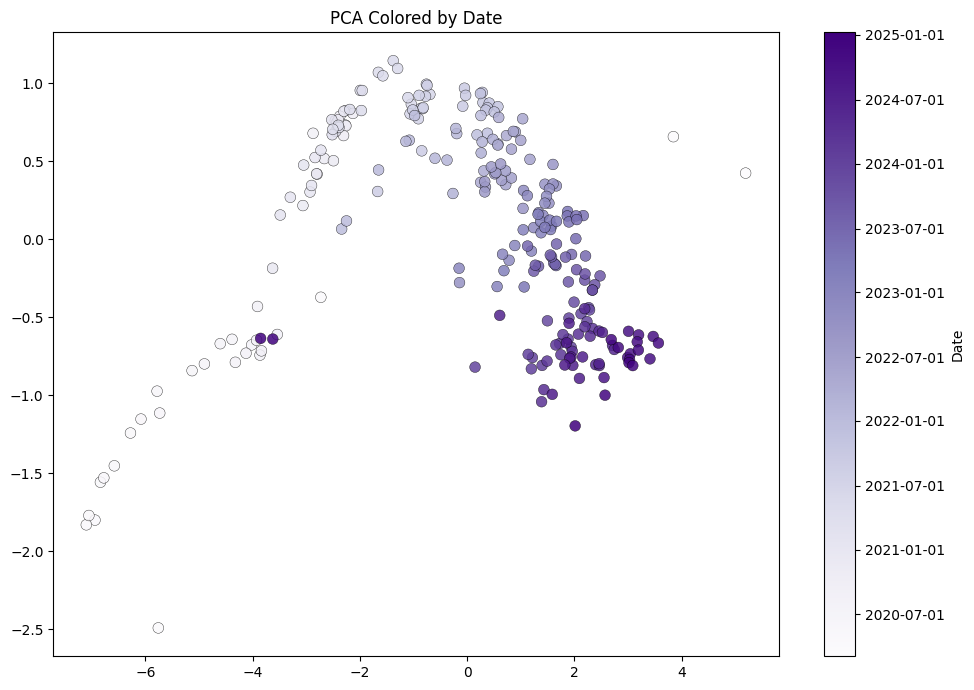

PCA plot with date gradient saved to: pca_totals_clusters_anomalies.pdf


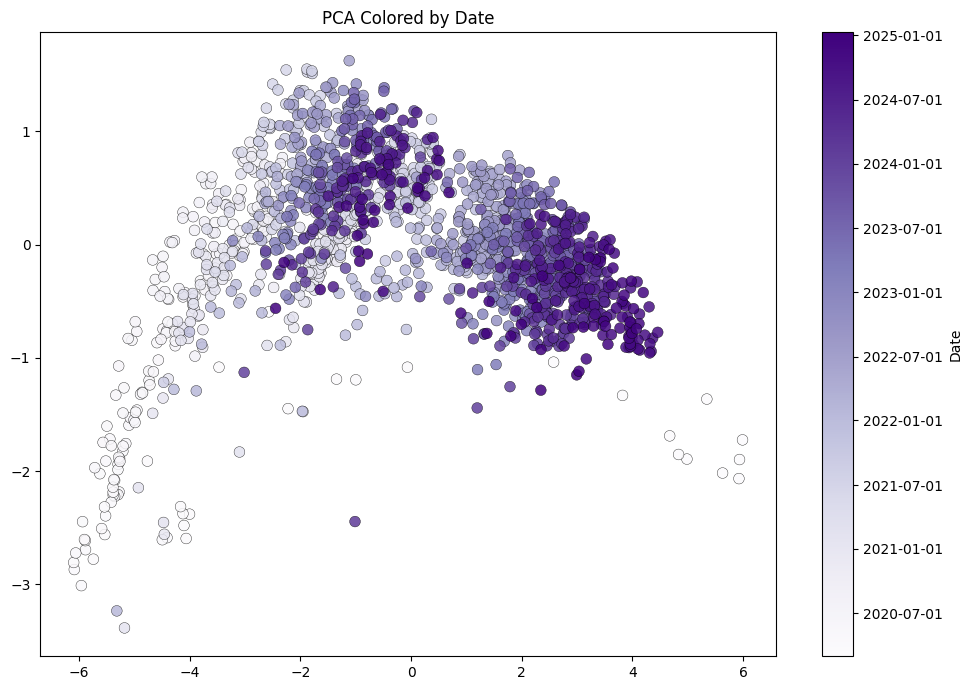

In [22]:
plot_pca_with_date_gradient(
    data=sundays_pct_d,
    date_column="Date",
    pdf_path="pca_sundays_pct_clusters_anomalies.pdf"
)

plot_pca_with_date_gradient(
    data=pct_df_d,
    date_column="Date",
    pdf_path="pca_pct_clusters_anomalies.pdf"
)

plot_pca_with_date_gradient(
    data=sundays_totals_d,
    date_column="Date",
    pdf_path="pca_sundays_totals_clusters_anomalies.pdf"
)
plot_pca_with_date_gradient(
    data=totals_df_d,
    date_column="Date",
    pdf_path="pca_totals_clusters_anomalies.pdf"
)

sundays_results, sundays_pdf_path = run_multivariate_analysis_with_pdf(sundays_X_d, 'Date', n_bkps=4)

from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

def plot_all_acfs(data, date_column='Date', lags=60, figsize=(12, 4)):
    """
    Plot autocorrelation functions for all numeric columns (transit types).
    
    Parameters:
        data (pd.DataFrame): The DataFrame containing the ridership data.
        date_column (str): The name of the column containing dates.
        lags (int): Number of lags to include in the ACF.
        figsize (tuple): Size of each individual ACF plot.
    """
    df = data.copy()
    df[date_column] = pd.to_datetime(df[date_column])
    df = df.sort_values(by=date_column)
    
    ridership_cols = df.select_dtypes(include='number').columns.tolist()
    
    for col in ridership_cols:
        fig, ax = plt.subplots(figsize=figsize)
        plot_acf(df[col].dropna(), lags=lags, ax=ax)
        ax.set_title(f"Autocorrelation of {col}")
        plt.tight_layout()
        plt.show()

plot_all_acfs(data=totals_df_d, date_column='Date', lags=7)
plot_all_acfs(data=pct_df_d, date_column='Date', lags=7)


from statsmodels.graphics.tsaplots import plot_pacf

def plot_pacf_and_rolling(df, date_column, lags=7, rolling_window=7, figsize=(14, 5)):
    df = df.copy()
    df[date_column] = pd.to_datetime(df[date_column])
    df = df.set_index(date_column).sort_index()

    numeric_columns = df.select_dtypes(include='number').columns

    for col in numeric_columns:
        fig, axes = plt.subplots(1, 2, figsize=(figsize[0]*2, figsize[1]))

        # Rolling Average
        df[col].rolling(window=rolling_window).mean().plot(ax=axes[0])
        axes[0].set_title(f'{col} - {rolling_window}-Day Rolling Average')
        axes[0].set_xlabel("Date")
        axes[0].set_ylabel("Ridership")

        # PACF
        plot_pacf(df[col].dropna(), lags=lags, ax=axes[1], title=f"{col} - PACF (lags={lags})")

        plt.tight_layout()
        plt.show()

plot_pacf_and_rolling(totals_df_d, date_column="Date")


PCA explained variance ratio: [0.79121946 0.08690931]
Total variance explained: 0.8781


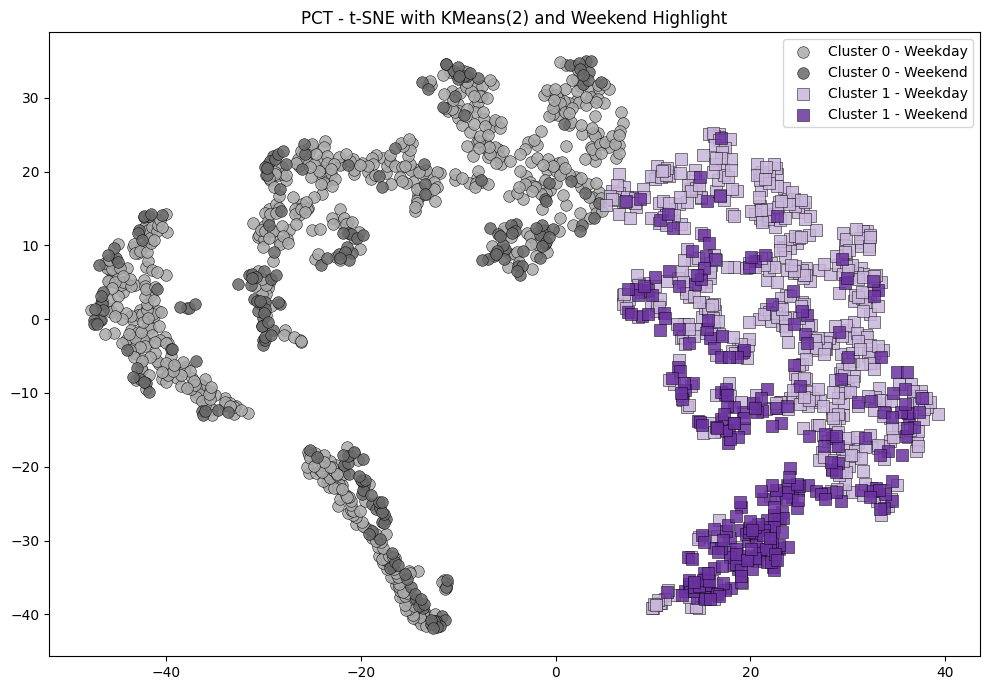

PCA explained variance ratio: [0.85071207 0.06993713]
Total variance explained: 0.9206


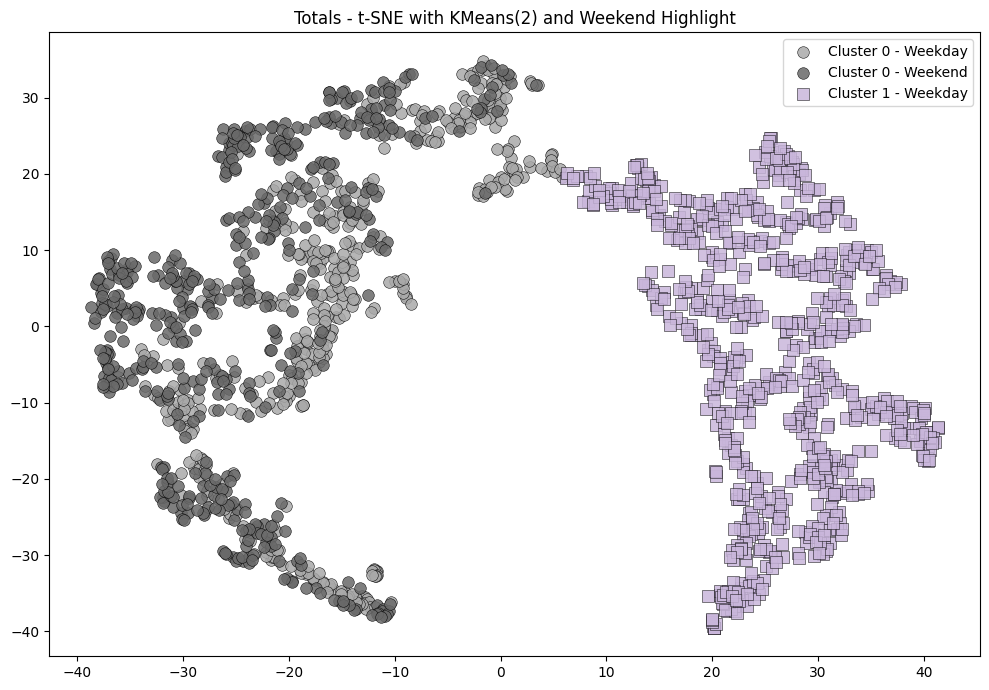

In [23]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from matplotlib.backends.backend_pdf import PdfPages

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from matplotlib.backends.backend_pdf import PdfPages

def plot_tsne_weekend_kmeans(data, date_column, numerical_columns=None,
                              pca_components=2, perplexity=40, random_state=42,
                              figsize=(10, 7), title="t-SNE: Weekend + KMeans Clusters",
                              pdf_path=None):
    """
    Plot t-SNE with KMeans(2) clusters, using darker shades for weekends.
    Performs PCA dimensionality reduction before t-SNE and clustering.
    """
    df = data.copy()
    df[date_column] = pd.to_datetime(df[date_column])
    df["Is_Weekend"] = df[date_column].dt.weekday >= 5
    
    if numerical_columns is None:
        numerical_columns = df.select_dtypes(include=[np.number]).columns.tolist()
    
    # Standardize features
    X = df[numerical_columns].values
    X_scaled = StandardScaler().fit_transform(X)
    
    # Apply PCA for dimensionality reduction
    pca = PCA(n_components=pca_components, random_state=random_state)
    X_pca = pca.fit_transform(X_scaled)
    
    # Print explained variance
    explained_variance = pca.explained_variance_ratio_
    print(f"PCA explained variance ratio: {explained_variance}")
    print(f"Total variance explained: {sum(explained_variance):.4f}")
    
    # t-SNE on PCA result
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=random_state)
    X_tsne = tsne.fit_transform(X_pca)
    
    # KMeans clustering on t-SNE result
    kmeans = KMeans(n_clusters=2, random_state=random_state)
    cluster_labels = kmeans.fit_predict(X_tsne)
    
    # Combine results into DataFrame
    tsne_df = pd.DataFrame(X_tsne, columns=["TSNE 1", "TSNE 2"])
    tsne_df["Is_Weekend"] = df["Is_Weekend"]
    tsne_df["Cluster"] = cluster_labels
    
    # Plot
    fig, ax = plt.subplots(figsize=figsize)
    
    # Define colors for each combination of cluster and weekend status
    color_mapping = {
        (0, False): 'darkgray',    # Cluster 0, Weekday (lighter gray)
        (0, True): 'dimgray',      # Cluster 0, Weekend (darker gray)
        (1, False): '#C9B6DB',     # Cluster 1, Weekday (lighter purple)
        (1, True): '#6A329F',      # Cluster 1, Weekend (darker purple)
    }
    
    # Create markers based on cluster
    markers = ['o', 's']  # circle for cluster 0, square for cluster 1
    
    # Plot each group
    for (cluster, is_weekend), group_df in tsne_df.groupby(['Cluster', 'Is_Weekend']):
        weekend_label = "Weekend" if is_weekend else "Weekday"
        ax.scatter(
            group_df["TSNE 1"],
            group_df["TSNE 2"],
            marker=markers[cluster],
            c=color_mapping[(cluster, is_weekend)],
            s=70,
            alpha=0.85,
            edgecolor='black',
            linewidth=0.4,
            label=f"Cluster {cluster} - {weekend_label}"
        )
    
    plt.title(title)
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(), loc="best")
    
    plt.tight_layout()
    
    if pdf_path:
        with PdfPages(pdf_path) as pdf:
            pdf.savefig(fig)
        print(f"t-SNE with KMeans plot saved to: {pdf_path}")
    
    plt.show()



plot_tsne_weekend_kmeans(
    data=pct_df_d,
    date_column="Date",
    title="PCT - t-SNE with KMeans(2) and Weekend Highlight"
)

plot_tsne_weekend_kmeans(
    data=totals_df_d,
    date_column="Date",
    title="Totals - t-SNE with KMeans(2) and Weekend Highlight"
)

PCA explained variance ratio: [0.85071207 0.06993713]
Total variance explained: 0.9206
PCA with KMeans plot saved to: weekend_totals_pca_analysis.pdf


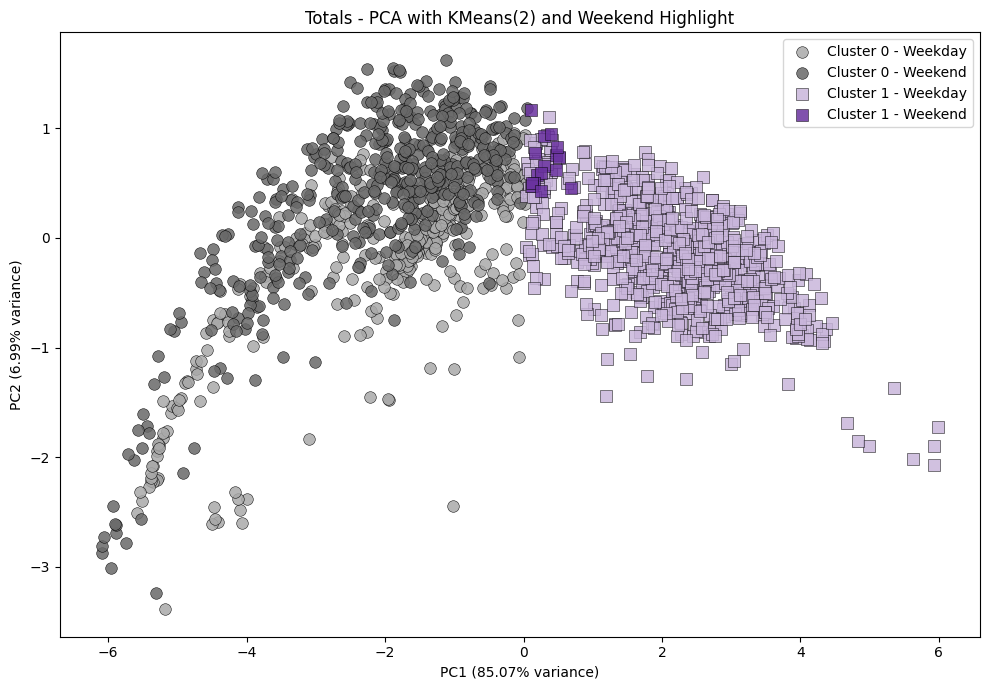

<bound method NDFrame.head of            Date  Subways: Total Estimated Ridership  \
0    2020-03-01                             2212965   
1    2020-03-02                             5329915   
2    2020-03-03                             5481103   
3    2020-03-04                             5498809   
4    2020-03-05                             5496453   
...         ...                                 ...   
1771 2025-01-05                             1791020   
1772 2025-01-06                             3436491   
1773 2025-01-07                             3781536   
1774 2025-01-08                             3830616   
1775 2025-01-09                             3734383   

      Buses: Total Estimated Ridership  LIRR: Total Estimated Ridership  \
0                               984908                            86790   
1                              2209066                           321569   
2                              2228608                           319727   
3        

In [24]:

def plot_pca_weekend_kmeans(data, date_column, numerical_columns=None,
                           random_state=42, figsize=(10, 7), 
                           title="PCA: Weekend + KMeans Clusters",
                           pdf_path=None):
    """
    Plot PCA with KMeans(2) clusters, using darker shades for weekends.
    """
    df = data.copy()
    df[date_column] = pd.to_datetime(df[date_column])
    df["Is_Weekend"] = df[date_column].dt.weekday >= 5
    
    if numerical_columns is None:
        numerical_columns = df.select_dtypes(include=[np.number]).columns.tolist()
    
    # Standardize features
    X = df[numerical_columns].values
    X_scaled = StandardScaler().fit_transform(X)
    
    # Apply PCA for dimensionality reduction
    pca = PCA(n_components=2, random_state=random_state)
    X_pca = pca.fit_transform(X_scaled)
    
    # Print explained variance
    explained_variance = pca.explained_variance_ratio_
    print(f"PCA explained variance ratio: {explained_variance}")
    print(f"Total variance explained: {sum(explained_variance):.4f}")
    
    # KMeans clustering on PCA result
    kmeans = KMeans(n_clusters=2, random_state=random_state)
    cluster_labels = kmeans.fit_predict(X_pca)
    
    # Combine results into DataFrame
    pca_df = pd.DataFrame(X_pca, columns=["PC1", "PC2"])
    pca_df["Is_Weekend"] = df["Is_Weekend"]
    pca_df["Cluster"] = cluster_labels
    
    # Plot
    fig, ax = plt.subplots(figsize=figsize)
    
    # Define colors for each combination of cluster and weekend status
    color_mapping = {
        (0, False): 'darkgray',    # Cluster 0, Weekday (lighter gray)
        (0, True): 'dimgray',      # Cluster 0, Weekend (darker gray)
        (1, False): '#C9B6DB',     # Cluster 1, Weekday (lighter purple)
        (1, True): '#6A329F',      # Cluster 1, Weekend (darker purple)
    }
    
    # Create markers based on cluster
    markers = ['o', 's']  # circle for cluster 0, square for cluster 1
    
    # Plot each group
    for (cluster, is_weekend), group_df in pca_df.groupby(['Cluster', 'Is_Weekend']):
        weekend_label = "Weekend" if is_weekend else "Weekday"
        ax.scatter(
            group_df["PC1"],
            group_df["PC2"],
            marker=markers[cluster],
            c=color_mapping[(cluster, is_weekend)],
            s=70,
            alpha=0.85,
            edgecolor='black',
            linewidth=0.4,
            label=f"Cluster {cluster} - {weekend_label}"
        )
    
    # Add axis labels with variance explained
    ax.set_xlabel(f"PC1 ({explained_variance[0]:.2%} variance)")
    ax.set_ylabel(f"PC2 ({explained_variance[1]:.2%} variance)")
    
    plt.title(title)
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(), loc="best")
    
    plt.tight_layout()
    
    if pdf_path:
        with PdfPages(pdf_path) as pdf:
            pdf.savefig(fig)
        print(f"PCA with KMeans plot saved to: {pdf_path}")
    
    plt.show()

plot_pca_weekend_kmeans(
    data=totals_df_d,
    date_column="Date",
    title="Totals - PCA with KMeans(2) and Weekend Highlight",
    pdf_path="weekend_totals_pca_analysis.pdf"
)
print(totals_df_d.head)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime

def analyze_sunday_weekday_ratio(df, feature_type='percentage', window_size=4):
    """
    Analyze and plot the Sunday to weekday ratio for selected features.
    
    Parameters:
    -----------
    df : pandas DataFrame
        DataFrame containing date column and features to analyze
    feature_type : str
        Type of features to analyze: 'percentage' for '% of Comparable Pre-Pandemic Day',
        'total' for 'Total Estimated Ridership' and similar total columns
    window_size : int
        Number of weeks to include in each moving average calculation
        
    Returns:
    --------
    DataFrame with the calculated ratios
    """
    # Make a copy to avoid modifying the original DataFrame
    df = df.copy()
    
    # Ensure Date column is datetime
    if not pd.api.types.is_datetime64_any_dtype(df['Date']):
        df['Date'] = pd.to_datetime(df['Date'])
    
    # Add a day of week column
    df['DayOfWeek'] = df['Date'].dt.day_name()
    df['IsSunday'] = df['DayOfWeek'] == 'Sunday'
    
    # Get features based on feature_type
    if feature_type.lower() == 'percentage':
        selected_columns = [col for col in df.columns if '%' in col]
    elif feature_type.lower() == 'total':
        selected_columns = [col for col in df.columns if 'Total' in col]
    else:
        raise ValueError("feature_type must be either 'percentage' or 'total'")
    
    # Convert selected columns to numeric if they're not already
    for col in selected_columns:
        if not pd.api.types.is_numeric_dtype(df[col]):
            df[col] = pd.to_numeric(df[col], errors='coerce')
    
    # Create a week identifier (year-week)
    df['YearWeek'] = df['Date'].dt.strftime('%Y-%U')
    
    # Create weekly ratios
    ratio_results = []
    
    # Group by week
    weeks = df['YearWeek'].unique()
    
    for week in weeks:
        week_data = df[df['YearWeek'] == week]
        
        # Skip weeks with no Sundays
        if not any(week_data['IsSunday']):
            continue
            
        sunday_data = week_data[week_data['IsSunday']]
        weekday_data = week_data[~week_data['IsSunday']]
        
        # Skip weeks with no weekdays
        if len(weekday_data) == 0:
            continue
        
        # For each selected column, calculate the ratio
        for col in selected_columns:
            sunday_value = sunday_data[col].mean()
            weekday_value = weekday_data[col].mean()
            
            if weekday_value > 0:  # Avoid division by zero
                ratio = sunday_value / weekday_value
                
                # Get the Sunday date for this week
                sunday_date = sunday_data['Date'].iloc[0]
                
                ratio_results.append({
                    'Date': sunday_date,
                    'YearWeek': week,
                    'Feature': col,
                    'SundayValue': sunday_value,
                    'WeekdayAvgValue': weekday_value,
                    'Ratio': ratio
                })
    
    # Convert results to DataFrame
    ratio_df = pd.DataFrame(ratio_results)
    
    if len(ratio_df) == 0:
        print("Not enough data to calculate ratios. Need at least one week with both Sunday and weekday data.")
        return None
    
    # Calculate moving average of ratios
    if len(weeks) >= window_size:
        # For each feature, calculate a moving average
        features = ratio_df['Feature'].unique()
        ratio_df = ratio_df.sort_values('Date')
        
        for feature in features:
            feature_data = ratio_df[ratio_df['Feature'] == feature]
            if len(feature_data) >= window_size:
                ratio_df.loc[ratio_df['Feature'] == feature, 'MovingAvgRatio'] = \
                    feature_data['Ratio'].rolling(window=window_size, min_periods=1).mean().values
    
    # Plot the results
    plot_ratios(ratio_df, window_size, feature_type)
    
    return ratio_df

def plot_ratios(ratio_df, window_size, feature_type):
    """
    Plot Sunday-Weekday ratios over time for each feature.
    
    Parameters:
    -----------
    ratio_df : DataFrame
        DataFrame containing the calculated ratios
    window_size : int
        Window size used for moving average calculation
    feature_type : str
        Type of features being analyzed
    """
    if len(ratio_df) == 0:
        print("No data to plot.")
        return
    
    # Get unique features
    features = ratio_df['Feature'].unique()
    
    # Create subplots - one row per feature
    fig, axes = plt.subplots(len(features), 1, figsize=(12, len(features) * 3), sharex=True)
    
    # If there's only one feature, axes won't be an array
    if len(features) == 1:
        axes = [axes]
    
    for i, feature in enumerate(features):
        feature_data = ratio_df[ratio_df['Feature'] == feature].sort_values('Date')
        
        # Plot the ratio
        axes[i].plot(feature_data['Date'], feature_data['Ratio'], 'o-', label='Weekly Ratio')
        
        # If moving average is available, plot it
        if 'MovingAvgRatio' in feature_data.columns:
            axes[i].plot(feature_data['Date'], feature_data['MovingAvgRatio'], 'r--', 
                         label=f'{window_size}-Week Moving Average')
        
        # Add a horizontal line at ratio=1
        axes[i].axhline(y=1, color='gray', linestyle='-', alpha=0.3)
        
        # Set labels and title
        axes[i].set_ylabel('Sunday/Weekday Ratio')
        axes[i].set_title(f"{feature}")
        axes[i].grid(True, alpha=0.3)
        axes[i].legend()
    
    # Set overall labels
    plt.xlabel('Date')
    plt.suptitle(f'Sunday/Weekday Ratios for {feature_type.title()} Features', fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)  # Make room for the suptitle
    plt.show()
    
    return fig


result_total = analyze_sunday_weekday_ratio(X_with_dates, feature_type='percentage')


In [25]:
from scipy import stats
from scipy.stats import wilcoxon

def analyze_weekend_weekday_ratio(df, feature_type='percentage', window_size=4, pdf_filename='weekend_weekday_ratio.pdf'):
    """
    Analyze and plot the weekend to weekday ratio for selected features,
    including statistical tests comparing ratios to 1, and save the plot to PDF.

    Parameters:
    -----------
    df : pandas DataFrame
        DataFrame containing date column and features to analyze
    feature_type : str
        'percentage' for % of Pre-Pandemic Day, 'total' for raw totals
    window_size : int
        Number of weeks to include in moving average (not used in plotting)
    pdf_filename : str
        Output filename for the PDF report

    Returns:
    --------
    Tuple: (DataFrame with calculated ratios, DataFrame with statistical test results)
    """
    df = df.copy()
    if not pd.api.types.is_datetime64_any_dtype(df['Date']):
        df['Date'] = pd.to_datetime(df['Date'])

    df['DayOfWeek'] = df['Date'].dt.day_name()
    df['IsWeekend'] = df['DayOfWeek'].isin(['Saturday', 'Sunday'])
    df['YearWeek'] = df['Date'].dt.strftime('%Y-%U')

    if feature_type.lower() == 'percentage':
        selected_columns = [col for col in df.columns if '%' in col]
    elif feature_type.lower() == 'total':
        selected_columns = [col for col in df.columns if 'Total' in col]
    else:
        raise ValueError("feature_type must be either 'percentage' or 'total'")

    for col in selected_columns:
        if not pd.api.types.is_numeric_dtype(df[col]):
            df[col] = pd.to_numeric(df[col], errors='coerce')

    ratio_results = []
    for week in df['YearWeek'].unique():
        week_data = df[df['YearWeek'] == week]
        weekend_data = week_data[week_data['IsWeekend']]
        weekday_data = week_data[~week_data['IsWeekend']]
        
        if len(weekend_data) == 0 or len(weekday_data) == 0:
            continue
            
        for col in selected_columns:
            weekend_value = weekend_data[col].mean()
            weekday_value = weekday_data[col].mean()
            
            if weekday_value > 0:
                ratio = weekend_value / weekday_value
                weekend_date = weekend_data['Date'].iloc[0]  # Take first weekend day as reference
                ratio_results.append({
                    'Date': weekend_date,
                    'YearWeek': week,
                    'Feature': col,
                    'WeekendValue': weekend_value,
                    'WeekdayAvgValue': weekday_value,
                    'Ratio': ratio
                })

    ratio_df = pd.DataFrame(ratio_results)

    if len(ratio_df) == 0:
        print("Not enough data to calculate ratios.")
        return None

    stats_results = []
    for feature in ratio_df['Feature'].unique():
        feature_ratios = ratio_df[ratio_df['Feature'] == feature]['Ratio'].values
        if len(feature_ratios) > 0:
            try:
                w_stat, p_value = wilcoxon(feature_ratios - 1)
            except ValueError:
                w_stat, p_value = np.nan, np.nan

            effect_size = (np.median(feature_ratios) - 1) / np.std(feature_ratios) if np.std(feature_ratios) > 0 else 0
            direction = "higher than" if np.median(feature_ratios) > 1 else "lower than"
            if pd.isna(p_value) or p_value >= 0.05:
                direction = "not significantly different from"
            median_diff = np.median(feature_ratios) - 1
            median_diff_percent = median_diff * 100
            stats_results.append({
                'Feature': feature,
                'Median Ratio': np.median(feature_ratios),
                'W-statistic': w_stat,
                'P-value': p_value,
                'P-value (sci)': f"{p_value:.1e}" if not pd.isna(p_value) else "NaN",
                'Significant (p < 0.05)': p_value < 0.05 if not pd.isna(p_value) else False,
                'Effect Size (approx)': effect_size,
                'Direction': direction,
                'Median Difference': median_diff,
                'Median Difference (%)': median_diff_percent
            })

    stats_df = pd.DataFrame(stats_results)

    plot_ratios_with_stats(ratio_df, stats_df, feature_type, pdf_filename)
    return ratio_df, stats_df


def plot_ratios_with_stats(ratio_df, stats_df, feature_type, pdf_filename):
    """
    Plot Weekend-Weekday ratios over time for each feature and save to PDF.
    """
    if len(ratio_df) == 0:
        print("No data to plot.")
        return

    purple_main = '#663399'
    purple_grid = '#D8BFD8'
    purple_ref = '#483D8B'
    purple_shade = '#8da0cb'

    features = ratio_df['Feature'].unique()
    plt.style.use('seaborn-v0_8-whitegrid')
    fig, axes = plt.subplots(len(features), 1, figsize=(14, len(features) * 3.5), sharex=True)

    if len(features) == 1:
        axes = [axes]

    for i, feature in enumerate(features):
        feature_data = ratio_df[ratio_df['Feature'] == feature].sort_values('Date')
        ratios = feature_data['Ratio'].dropna().values
        axes[i].plot(feature_data['Date'], feature_data['Ratio'], 'o-', color=purple_main,
                     linewidth=2.5, markersize=7, label='Weekly Ratio')
        axes[i].axhline(y=1, color=purple_ref, linewidth=1.5, alpha=0.7)
        axes[i].grid(True, linestyle='--', color=purple_grid, alpha=0.6)
        axes[i].set_facecolor('#FCFAFF')
        axes[i].set_ylabel('Weekend / Weekday Ratio', fontsize=12, fontweight='bold')

        stats_row = stats_df[stats_df['Feature'] == feature]
        if not stats_row.empty:
            p_display = stats_row['P-value (sci)'].iloc[0]
            median_ratio = stats_row['Median Ratio'].iloc[0]
            direction = stats_row['Direction'].iloc[0]
            median_diff = stats_row['Median Difference (%)'].iloc[0]
            sig_stars = "***" if stats_row['Significant (p < 0.05)'].iloc[0] else ""
            title = (
                f"{feature}\nMedian Ratio: {median_ratio:.3f} ({median_diff:+.1f}%) {sig_stars}\n"
                f"Weekend is {direction} weekday (p={p_display})"
            )
        else:
            title = f"{feature}"

        axes[i].set_title(title, fontsize=13, fontweight='bold')
        axes[i].legend(loc='upper right', frameon=True, facecolor='white', framealpha=0.9, fontsize=10)

        

    plt.xlabel('Date', fontsize=12, fontweight='bold')
    plt.tight_layout()
    plt.subplots_adjust(top=0.95, bottom=0.05)
    fig.patch.set_facecolor('#F8F4FF')
    fig.savefig(pdf_filename, format='pdf', bbox_inches='tight')
    plt.close(fig)

# Example usage:
ratio_df, stats_df = analyze_weekend_weekday_ratio(
    X_with_dates,
    feature_type='percentage',           # or 'total'
    window_size=4,                       # not currently used for plotting, but kept for compatibility
    pdf_filename='sunday_weekday_analysis.pdf'  # name of the PDF file to generate
)
# Print the statistical results table
print(stats_df)

                                             Feature  Median Ratio  \
0          Subways: % of Comparable Pre-Pandemic Day        1.1565   
1            Buses: % of Comparable Pre-Pandemic Day        1.0017   
2             LIRR: % of Comparable Pre-Pandemic Day        1.4183   
3      Metro-North: % of Comparable Pre-Pandemic Day        1.1886   
4    Access-A-Ride: % of Comparable Pre-Pandemic Day        0.9860   
5  Bridges and Tunnels: % of Comparable Pre-Pande...        0.9977   
6  Staten Island Railway: % of Comparable Pre-Pan...        1.1497   

   W-statistic  P-value P-value (sci)  Significant (p < 0.05)  \
0     788.0000   0.0000       1.2e-39                    True   
1   14338.5000   0.5115       5.1e-01                   False   
2     525.0000   0.0000       6.3e-41                    True   
3    2141.0000   0.0000       4.1e-33                    True   
4   12674.0000   0.0015       1.5e-03                    True   
5   14576.5000   0.1392       1.4e-01            

In [26]:
df_2022_onwards = X_with_dates[X_with_dates['Date'] >= '2022-01-01']
ratio_df_2022, stats_df_2022 = analyze_weekend_weekday_ratio(
    df_2022_onwards,
    feature_type='percentage',           # or 'total'
    window_size=4,                       # not currently used for plotting, but kept for compatibility
    pdf_filename='sunday_weekday_analysis_2022.pdf'  # name of the PDF file to generate
)

# Print the statistical results table
print(stats_df_2022)

df_2022_previous = X_with_dates[X_with_dates['Date'] <= '2022-01-01']

ratio_dfp_2022, stats_dfp_2022 = analyze_weekend_weekday_ratio(
    df_2022_previous,
    feature_type='percentage',           # or 'total'
    window_size=4,                       # not currently used for plotting, but kept for compatibility
    pdf_filename='sunday_weekday_analysis_2022_previous.pdf'  # name of the PDF file to generate
)

# Print the statistical results table
print(stats_dfp_2022)

                                             Feature  Median Ratio  \
0          Subways: % of Comparable Pre-Pandemic Day        1.1607   
1            Buses: % of Comparable Pre-Pandemic Day        1.0017   
2             LIRR: % of Comparable Pre-Pandemic Day        1.4206   
3      Metro-North: % of Comparable Pre-Pandemic Day        1.1517   
4    Access-A-Ride: % of Comparable Pre-Pandemic Day        1.0255   
5  Bridges and Tunnels: % of Comparable Pre-Pande...        1.0130   
6  Staten Island Railway: % of Comparable Pre-Pan...        1.1939   

   W-statistic  P-value P-value (sci)  Significant (p < 0.05)  \
0     117.0000   0.0000       1.0e-26                    True   
1    6183.5000   0.8663       8.7e-01                   False   
2      49.0000   0.0000       1.9e-27                    True   
3     690.0000   0.0000       1.8e-22                    True   
4    4224.0000   0.0002       2.4e-04                    True   
5    4210.0000   0.0003       3.3e-04            

In [27]:
from scipy.stats import mannwhitneyu

def weekend_weekday_comparison(df, feature_type='total'):
    """
    Compare weekend vs. weekday values for all features with non-parametric tests
    
    Parameters:
    -----------
    df : pandas DataFrame
        DataFrame containing date column and features to analyze
    feature_type : str
        'percentage' or 'total' to select which columns to analyze
    
    Returns:
    --------
    DataFrame with comparison results
    """
    # Make copy and ensure datetime
    df = df.copy()
    if not pd.api.types.is_datetime64_any_dtype(df['Date']):
        df['Date'] = pd.to_datetime(df['Date'])
    
    # Create weekend/weekday flag
    df['DayOfWeek'] = df['Date'].dt.day_name()
    df['IsWeekend'] = df['DayOfWeek'].isin(['Saturday', 'Sunday'])
    
    # Select appropriate columns
    if feature_type.lower() == 'percentage':
        feature_cols = [col for col in df.columns if '%' in col]
    elif feature_type.lower() == 'total':
        feature_cols = [col for col in df.columns if 'Total' in col]
    else:
        raise ValueError("feature_type must be 'percentage' or 'total'")
    
    # Initialize results storage
    results = []
    
    for col in feature_cols:
        # Get values for each group
        weekend_vals = df[df['IsWeekend']][col].dropna()
        weekday_vals = df[~df['IsWeekend']][col].dropna()
        
        # Skip if not enough data
        if len(weekend_vals) < 3 or len(weekday_vals) < 3:
            continue
        
        # Calculate statistics
        weekend_mean = np.mean(weekend_vals)
        weekday_mean = np.mean(weekday_vals)
        mean_diff_pct = ((weekend_mean - weekday_mean)/weekday_mean)*100 if weekday_mean != 0 else np.nan
        
        # Non-parametric test
        try:
            stat, p = mannwhitneyu(weekend_vals, weekday_vals, alternative='two-sided')
        except:
            stat, p = np.nan, np.nan
        
        # Determine significance and format p-value
        if p < 0.001:
            sig = '***'
        elif p < 0.01:
            sig = '**'
        elif p < 0.05:
            sig = '*'
        else:
            sig = 'ns'
        
        # Format p-value in scientific notation
        p_formatted = f"{p:.2e}" if not np.isnan(p) else "NaN"
        
        results.append({
            'Feature': col,
            'Weekend_Mean': weekend_mean,
            'Weekday_Mean': weekday_mean,
            'Percent_Difference': mean_diff_pct,
            'MannWhitneyU_Stat': stat,
            'P_Value': p_formatted,
            'Significance': sig
        })
    
    # Create and format results dataframe
    results_df = pd.DataFrame(results)
    results_df = results_df.sort_values('P_Value')
    
    # Format numeric columns (excluding the formatted p-value)
    float_cols = ['Weekend_Mean', 'Weekday_Mean', 'Percent_Difference']
    results_df[float_cols] = results_df[float_cols].round(3)
    
    return results_df

# Example usage:
# For percentage features
percentage_results = weekend_weekday_comparison(
    df=X_with_dates, 
    feature_type='percentage'
)

# For total features
total_results = weekend_weekday_comparison(
    df=X_with_dates, 
    feature_type='total'
)

# Display results
print("Weekend vs Weekday Comparison (Percentage Features):")
display(percentage_results)

print("\nWeekend vs Weekday Comparison (Total Features):")
display(total_results)

Weekend vs Weekday Comparison (Percentage Features):


,Feature,Weekend_Mean,Weekday_Mean,Percent_Difference,MannWhitneyU_Stat,P_Value,Significance
3,Metro-North: % of Comparable Pre-Pandemic Day,0.5800,0.5040,15.1170,384471.0000,1.25e-10,***
6,Staten Island Railway: % of Comparable Pre-Pan...,0.4040,0.3810,5.9390,368671.0000,1.48e-06,***
5,Bridges and Tunnels: % of Comparable Pre-Pande...,0.9300,0.9400,-1.0800,334429.0000,1.92e-01,ns
1,Buses: % of Comparable Pre-Pandemic Day,0.5520,0.5510,0.1730,330358.5000,3.74e-01,ns
0,Subways: % of Comparable Pre-Pandemic Day,0.6210,0.5410,14.8390,424907.0000,3.82e-26,***
2,LIRR: % of Comparable Pre-Pandemic Day,0.7590,0.5470,38.6630,455936.5000,4.78e-43,***
4,Access-A-Ride: % of Comparable Pre-Pandemic Day,0.8750,0.8800,-0.6220,314960.5000,4.90e-01,ns



Weekend vs Weekday Comparison (Total Features):


,Feature,Weekend_Mean,Weekday_Mean,Percent_Difference,MannWhitneyU_Stat,P_Value,Significance
5,Bridges and Tunnels: Total Traffic,813577.6000,874711.7710,-6.9890,230873.5000,1.35e-20,***
1,Buses: Total Estimated Ridership,648118.1340,1156553.8310,-43.9610,67453.0000,1.47e-149,***
2,LIRR: Total Estimated Ridership,80292.2330,162152.5880,-50.4840,113916.5000,1.51e-100,***
6,Staten Island Railway: Total Estimated Ridership,1562.7200,5662.2750,-72.4010,35570.5000,7.05e-189,***
3,Metro-North: Total Estimated Ridership,71866.1140,135763.3280,-47.0650,147947.5000,7.06e-71,***
0,Subways: Total Estimated Ridership,1705455.1560,2875984.8590,-40.7000,120013.0000,7.63e-95,***
4,Access-A-Ride: Total Scheduled Trips,14908.3630,25322.4110,-41.1260,78700.0000,8.55e-137,***


In [28]:
def compare_percent_to_one(df, date_col='Date', alpha=0.05):
    """
    For each percentage feature in the dataframe, test whether its values 
    are significantly different from 1 (i.e., 100% of pre-pandemic baseline).

    Parameters:
    -----------
    df : pandas DataFrame
        A DataFrame containing a date column and multiple percentage columns.
    date_col : str
        Name of the column containing dates.
    alpha : float
        Significance threshold for hypothesis testing.

    Returns:
    --------
    results_df : pandas DataFrame
        A DataFrame summarizing the test results for each feature.
    """
    df = df.copy()

    if not pd.api.types.is_datetime64_any_dtype(df[date_col]):
        df[date_col] = pd.to_datetime(df[date_col])

    # Identify percentage columns (contains '%' in name)
    pct_cols = [col for col in df.columns if '%' in col and col != date_col]

    results = []

    for col in pct_cols:
        values = pd.to_numeric(df[col], errors='coerce').dropna()

        if len(values) < 3:
            continue  # not enough data for test

        try:
            stat, p_val = wilcoxon(values - 1)
            median_val = np.median(values)
            median_diff = median_val - 1
            direction = (
                "significantly higher than 1"
                if median_diff > 0 and p_val < alpha else
                "significantly lower than 1"
                if median_diff < 0 and p_val < alpha else
                "not significantly different from 1"
            )

            results.append({
                'Feature': col,
                'Median': median_val,
                'Median Diff': median_diff,
                'P-value': p_val,
                'P-value (sci)': f"{p_val:.1e}",
                'Direction': direction,
                'Significant': p_val < alpha
            })

        except ValueError:
            results.append({
                'Feature': col,
                'Median': np.nan,
                'Median Diff': np.nan,
                'P-value': np.nan,
                'P-value (sci)': "NaN",
                'Direction': "Error",
                'Significant': False
            })

    return pd.DataFrame(results).sort_values('P-value')
df_2023 = X_with_dates[X_with_dates['Date'] >= '2023-03-01']

percent_stats = compare_percent_to_one(df_2023)
display(percent_stats)

,Feature,Median,Median Diff,P-value,P-value (sci),Direction,Significant
1,Buses: % of Comparable Pre-Pandemic Day,0.6200,-0.3800,0.0000,3.1e-113,significantly lower than 1,True
0,Subways: % of Comparable Pre-Pandemic Day,0.7000,-0.3000,0.0000,3.8e-111,significantly lower than 1,True
6,Staten Island Railway: % of Comparable Pre-Pan...,0.4700,-0.5300,0.0000,5.6e-110,significantly lower than 1,True
3,Metro-North: % of Comparable Pre-Pandemic Day,0.7400,-0.2600,0.0000,2.3e-102,significantly lower than 1,True
4,Access-A-Ride: % of Comparable Pre-Pandemic Day,1.1200,0.1200,0.0000,1.5e-69,significantly higher than 1,True
2,LIRR: % of Comparable Pre-Pandemic Day,0.7700,-0.2300,0.0000,3.0e-60,significantly lower than 1,True
5,Bridges and Tunnels: % of Comparable Pre-Pande...,1.0100,0.0100,0.0000,1.1e-09,significantly higher than 1,True


In [29]:
def plot_rolling_average_to_pdf(df, date_col='Date', feature='Buses: % of Comparable Pre-Pandemic Day', window=7, output_dir='.'):
    """
    Plot the rolling average of the selected percentage feature and save the plot to a PDF.
    """

    df = df.copy()
    if not pd.api.types.is_datetime64_any_dtype(df[date_col]):
        df[date_col] = pd.to_datetime(df[date_col])

    df = df.sort_values(by=date_col).reset_index(drop=True)
    df['Smoothed'] = df[feature].rolling(window=window, center=True).mean()
    df.dropna(subset=['Smoothed'], inplace=True)

    # Prepare output
    timestamp = pd.to_datetime('now').strftime("%Y%m%d_%H%M%S")
    pdf_path = f"{output_dir}/rolling_average_{timestamp}.pdf"
    pdf = PdfPages(pdf_path)

    # Plot
    fig, ax = plt.subplots(figsize=(15, 6))
    ax.plot(df[date_col], df['Smoothed'], color='purple', linewidth=2.5, label='7-day Smoothed')

    ax.set_title(f"7-day Rolling Average of {feature}", fontsize=14)
    ax.set_ylabel('% of Pre-Pandemic Day', fontsize=12)
    ax.set_xlabel('Date', fontsize=12)
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
    plt.xticks(rotation=45)
    plt.tight_layout()

    # Save the plot to the PDF
    pdf.savefig(fig)
    plt.close(fig)

    # Close the PDF
    pdf.close()
    print(f"PDF saved to: {pdf_path}")

# Call the function to plot the rolling average and save to PDF
plot_rolling_average_to_pdf(df=X_with_dates, date_col='Date', feature='Buses: % of Comparable Pre-Pandemic Day', window=7, output_dir='.')

PDF saved to: ./rolling_average_20250426_145712.pdf
